In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os

In [ ]:
# List all folders in My Drive
my_drive_path = "/content/drive/My Drive/227 Final Project/Variation 3 Results"
folders = [f for f in os.listdir(my_drive_path) if os.path.isdir(os.path.join(my_drive_path, f))]

print("📁 Folders in My Drive:")
for folder in folders:
    print("-", folder)


📁 Folders in My Drive:
- nonconstant_filtration
- constant_filtration
- base
- nonconstant_filtration_original
- constant_filtration_original


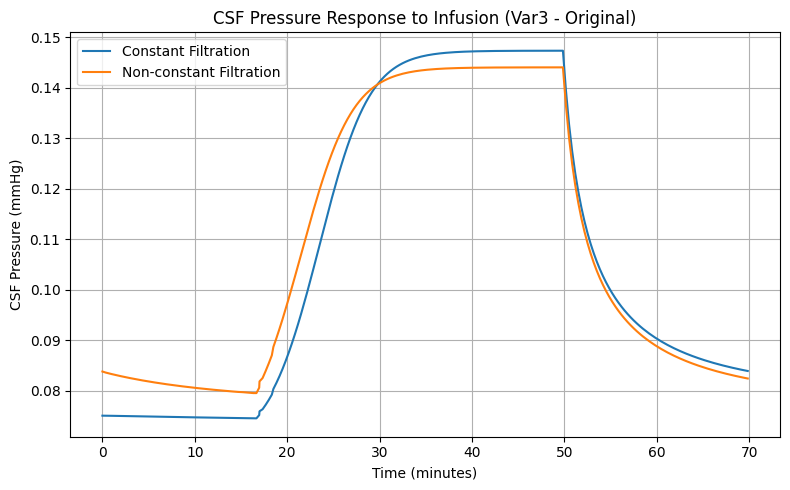

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
base_path = "/content/drive/My Drive/227 Final Project/Variation 3 Results"
# === File paths ===
paths = {
    "Constant Filtration": base_path+"/constant_filtration_original/pressure_average.dat",
    "Non-constant Filtration": base_path+"/nonconstant_filtration_original/pressure_average.dat"
}

# === Plotting ===
plt.figure(figsize=(8, 5))
for label, filepath in paths.items():
    data = np.loadtxt(filepath, skiprows=1)
    time = data[:, 0] / 60  # convert seconds to minutes
    csf_pressure = data[:, -1] / 133.322  # convert from Pa to mmHg
    plt.plot(time, csf_pressure, label=label)

plt.xlabel("Time (minutes)")
plt.ylabel("CSF Pressure (mmHg)")
plt.title("CSF Pressure Response to Infusion (Var3 - Original)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


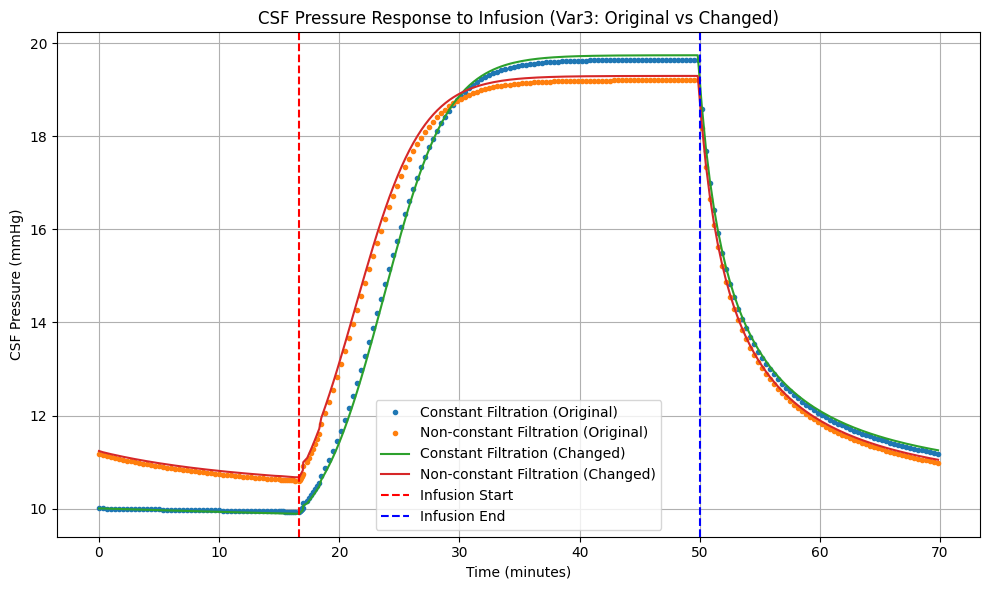

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

base_path = "/content/drive/My Drive/227 Final Project/Variation 3 Results"

# === File paths for both original and changed models ===
paths = {
    # Original model outputs
    "Constant Filtration (Original)": base_path + "/constant_filtration_original/pressure_average.dat",
    "Non-constant Filtration (Original)": base_path + "/nonconstant_filtration_original/pressure_average.dat",

    # Changed model outputs
    "Constant Filtration (Changed)": base_path + "/constant_filtration/pressure_average.dat",
    "Non-constant Filtration (Changed)": base_path + "/nonconstant_filtration/pressure_average.dat"
}

# === Plotting ===
plt.figure(figsize=(10, 6))
for label, filepath in paths.items():
    try:
        data = np.loadtxt(filepath, skiprows=1)
        time = data[:, 0] / 60  # seconds → minutes
        csf_pressure = data[:, -1]  # CSF pressure in mmHg

        if "Original" in label:
            plt.plot(time, csf_pressure, 'o', label=label, markersize=3)
        else:
            plt.plot(time, csf_pressure, label=label)
    except Exception as e:
        print(f"Error reading {label}: {e}")

# Mark infusion window
plt.axvline(x=1000/60, color='red', linestyle='--', label="Infusion Start")
plt.axvline(x=3000/60, color='blue', linestyle='--', label="Infusion End")
#plt.xlim(1000/60, 3000/60)

plt.xlabel("Time (minutes)")
plt.ylabel("CSF Pressure (mmHg)")
plt.title("CSF Pressure Response to Infusion (Var3: Original vs Changed)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


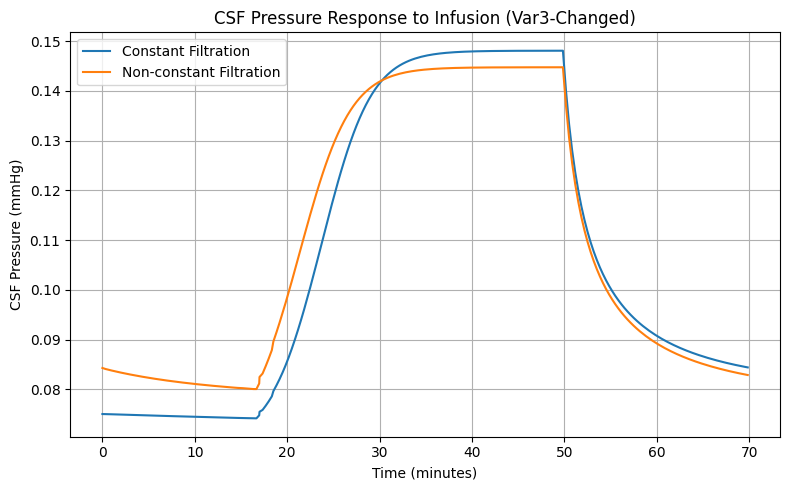

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
base_path = "/content/drive/My Drive/227 Final Project/Variation 3 Results"
# === File paths ===
paths = {
    "Constant Filtration": base_path+"/constant_filtration/pressure_average.dat",
    "Non-constant Filtration": base_path+"/nonconstant_filtration/pressure_average.dat"
}

# === Plotting ===
plt.figure(figsize=(8, 5))
for label, filepath in paths.items():
    data = np.loadtxt(filepath, skiprows=1)
    time = data[:, 0] / 60  # convert seconds to minutes
    csf_pressure = data[:, -1] / 133.322  # convert from Pa to mmHg
    plt.plot(time, csf_pressure, label=label)

plt.xlabel("Time (minutes)")
plt.ylabel("CSF Pressure (mmHg)")
plt.title("CSF Pressure Response to Infusion (Var3-Changed)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

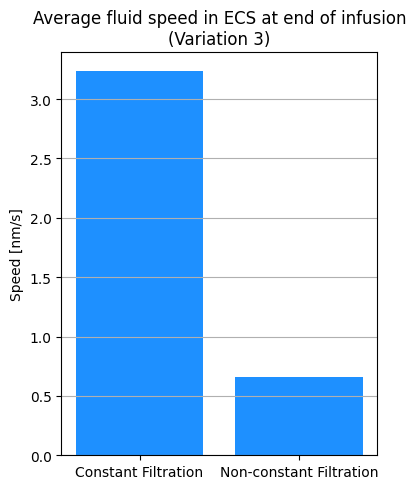

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
base_path = "/content/drive/My Drive/227 Final Project/Variation 3 Results"

#=== Var3 file paths (update if directory structure differs) ===

paths = {
    "Constant Filtration": base_path+"/constant_filtration_original/speed_average.dat",
    "Non-constant Filtration": base_path+"/nonconstant_filtration_original/speed_average.dat"
}

# === Load ECS speed at final time point ===
ecs_speeds = {}
for label, file_path in paths.items():
    if os.path.exists(file_path):
        try:
            data = np.loadtxt(file_path, skiprows=1)
            ecs_speed_last = data[-1, -1]
            ecs_speeds[label] = ecs_speed_last
        except Exception as e:
            print(f"Error reading {file_path}: {e}")
    else:
        print(f"Missing file: {file_path}")

# === Plotting ===
labels = list(ecs_speeds.keys())
values = [ecs_speeds[k] for k in labels]

plt.figure(figsize=(4, 5))
plt.bar(labels, values, color='dodgerblue')
plt.ylabel("Speed [nm/s]")
plt.title("Average fluid speed in ECS at end of infusion\n(Variation 3)")
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()


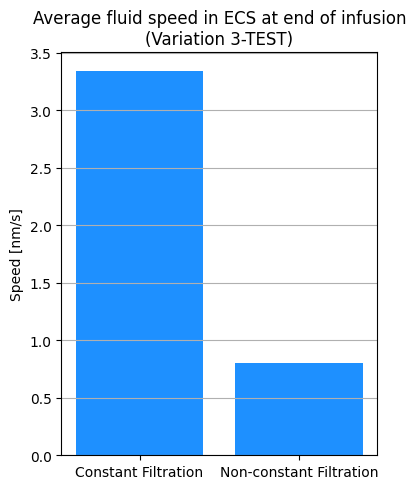

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
base_path = "/content/drive/My Drive/227 Final Project/Variation 3 Results"

#=== Var3 file paths (update if directory structure differs) ===

paths = {
    "Constant Filtration": base_path+"/constant_filtration/speed_average.dat",
    "Non-constant Filtration": base_path+"/nonconstant_filtration/speed_average.dat"
}

# === Load ECS speed at final time point ===
ecs_speeds = {}
for label, file_path in paths.items():
    if os.path.exists(file_path):
        try:
            data = np.loadtxt(file_path, skiprows=1)
            ecs_speed_last = data[-1, -1]
            ecs_speeds[label] = ecs_speed_last
        except Exception as e:
            print(f"Error reading {file_path}: {e}")
    else:
        print(f"Missing file: {file_path}")

# === Plotting ===
labels = list(ecs_speeds.keys())
values = [ecs_speeds[k] for k in labels]

plt.figure(figsize=(4, 5))
plt.bar(labels, values, color='dodgerblue')
plt.ylabel("Speed [nm/s]")
plt.title("Average fluid speed in ECS at end of infusion\n(Variation 3-TEST)")
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()


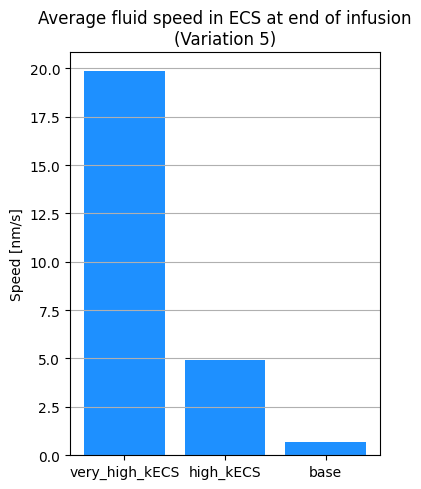

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
base_path = "/content/drive/My Drive/227 Final Project/Variation 5"

#=== Var3 file paths (update if directory structure differs) ===

paths = {
    "very_high_kECS": base_path+"/very_high_kECS_original/speed_average.dat",
    "high_kECS": base_path+"/high_kECS_original/speed_average.dat",
    "base": base_path+"/base5_original/speed_average.dat"
}

# === Load ECS speed at final time point ===
ecs_speeds = {}
for label, file_path in paths.items():
    if os.path.exists(file_path):
        try:
            data = np.loadtxt(file_path, skiprows=1)
            ecs_speed_last = data[-1, -1]
            ecs_speeds[label] = ecs_speed_last
        except Exception as e:
            print(f"Error reading {file_path}: {e}")
    else:
        print(f"Missing file: {file_path}")

# === Plotting ===
labels = list(ecs_speeds.keys())
values = [ecs_speeds[k] for k in labels]

plt.figure(figsize=(4, 5))
plt.bar(labels, values, color='dodgerblue')
plt.ylabel("Speed [nm/s]")
plt.title("Average fluid speed in ECS at end of infusion\n(Variation 5)")
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()


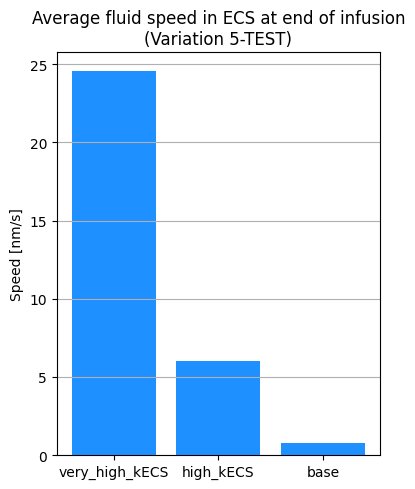

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
base_path = "/content/drive/My Drive/227 Final Project/Variation 5"

#=== Var3 file paths (update if directory structure differs) ===

paths = {
    "very_high_kECS": base_path+"/very_high_kECS/speed_average.dat",
    "high_kECS": base_path+"/high_kECS/speed_average.dat",
    "base": base_path+"/base/speed_average.dat"
}

# === Load ECS speed at final time point ===
ecs_speeds = {}
for label, file_path in paths.items():
    if os.path.exists(file_path):
        try:
            data = np.loadtxt(file_path, skiprows=1)
            ecs_speed_last = data[-1, -1]
            ecs_speeds[label] = ecs_speed_last
        except Exception as e:
            print(f"Error reading {file_path}: {e}")
    else:
        print(f"Missing file: {file_path}")

# === Plotting ===
labels = list(ecs_speeds.keys())
values = [ecs_speeds[k] for k in labels]

plt.figure(figsize=(4, 5))
plt.bar(labels, values, color='dodgerblue')
plt.ylabel("Speed [nm/s]")
plt.title("Average fluid speed in ECS at end of infusion\n(Variation 5-TEST)")
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

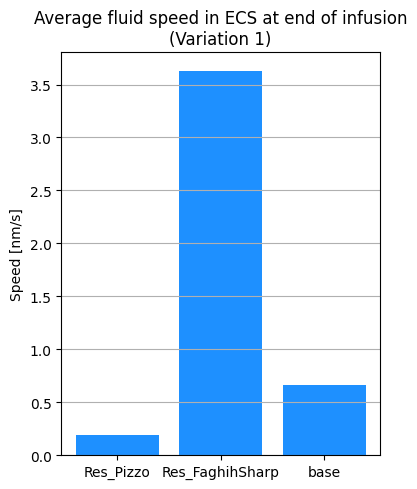

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
base_path = "/content/drive/My Drive/227 Final Project/Variation 1 Results"

#=== Var3 file paths (update if directory structure differs) ===

paths = {
    "Res_Pizzo": base_path+"/Res_Pizzo_original/speed_average.dat",
    "Res_FaghihSharp": base_path+"/Res_FaghihSharp_original/speed_average.dat",
    "base": base_path+"/base1_original/speed_average.dat"
}

# === Load ECS speed at final time point ===
ecs_speeds = {}
for label, file_path in paths.items():
    if os.path.exists(file_path):
        try:
            data = np.loadtxt(file_path, skiprows=1)
            ecs_speed_last = data[-1, -1]
            ecs_speeds[label] = ecs_speed_last
        except Exception as e:
            print(f"Error reading {file_path}: {e}")
    else:
        print(f"Missing file: {file_path}")

# === Plotting ===
labels = list(ecs_speeds.keys())
values = [ecs_speeds[k] for k in labels]

plt.figure(figsize=(4, 5))
plt.bar(labels, values, color='dodgerblue')
plt.ylabel("Speed [nm/s]")
plt.title("Average fluid speed in ECS at end of infusion\n(Variation 1)")
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

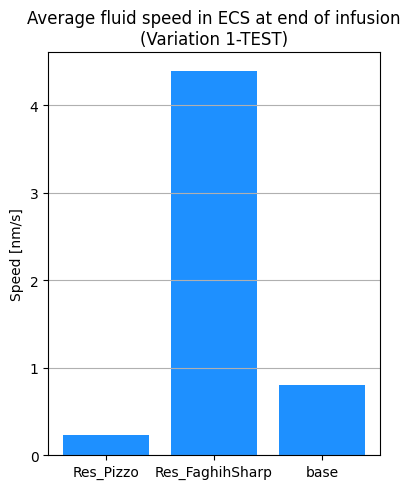

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
base_path = "/content/drive/My Drive/227 Final Project/Variation 1 Results"

#=== Var3 file paths (update if directory structure differs) ===

paths = {
    "Res_Pizzo": base_path+"/Res_Pizzo/speed_average.dat",
    "Res_FaghihSharp": base_path+"/Res_FaghihSharp/speed_average.dat",
    "base": base_path+"/base1/speed_average.dat"
}

# === Load ECS speed at final time point ===
ecs_speeds = {}
for label, file_path in paths.items():
    if os.path.exists(file_path):
        try:
            data = np.loadtxt(file_path, skiprows=1)
            ecs_speed_last = data[-1, -1]
            ecs_speeds[label] = ecs_speed_last
        except Exception as e:
            print(f"Error reading {file_path}: {e}")
    else:
        print(f"Missing file: {file_path}")

# === Plotting ===
labels = list(ecs_speeds.keys())
values = [ecs_speeds[k] for k in labels]

plt.figure(figsize=(4, 5))
plt.bar(labels, values, color='dodgerblue')
plt.ylabel("Speed [nm/s]")
plt.title("Average fluid speed in ECS at end of infusion\n(Variation 1-TEST)")
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

In [ ]:
base_path = "/content/drive/My Drive/227 Final Project/Variation 1 Results"

#=== Var3 file paths (update if directory structure differs) ===

paths = {
    "Res_Pizzo": base_path+"/Res_Pizzo_original/speed_average.dat",
    "Res_FaghihSharp": base_path+"/Res_FaghihSharp_original/speed_average.dat",
    "base": base_path+"/base1_original/speed_average.dat"
}


ALL VARIATIONS IN ONE PLOT

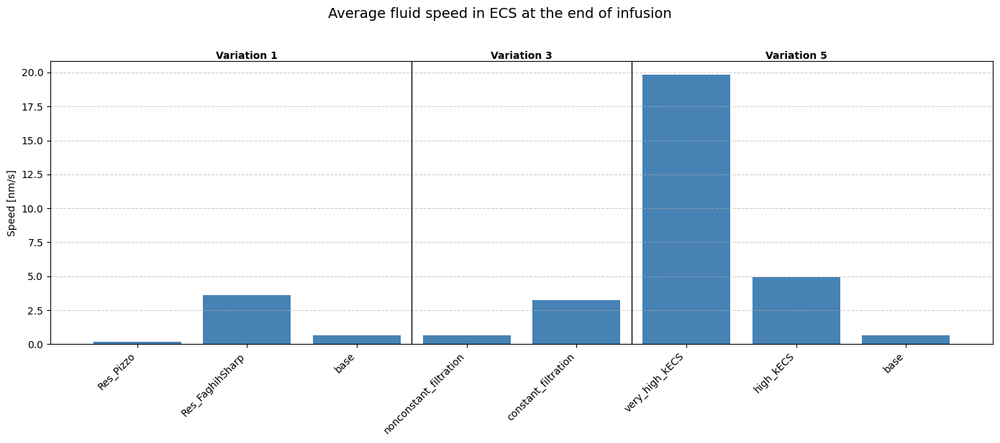

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

# === Manually defined file paths ===
base_path1 = "/content/drive/My Drive/227 Final Project/Variation 1 Results"
base_path3 = "/content/drive/My Drive/227 Final Project/Variation 3 Results"
base_path5 = "/content/drive/My Drive/227 Final Project/Variation 5"
paths = {
    "Variation 1": {
    "Res_Pizzo": base_path1+"/Res_Pizzo_original/speed_average.dat",
    "Res_FaghihSharp": base_path1+"/Res_FaghihSharp_original/speed_average.dat",
    "base": base_path1+"/base1_original/speed_average.dat"
},
    "Variation 3": {
        "nonconstant_filtration": base_path3+"/nonconstant_filtration_original/speed_average.dat",
        "constant_filtration": base_path3+"/constant_filtration_original/speed_average.dat"
    },
    "Variation 5": {
    "very_high_kECS": base_path5+"/very_high_kECS_original/speed_average.dat",
    "high_kECS": base_path5+"/high_kECS_original/speed_average.dat",
    "base": base_path5+"/base5_original/speed_average.dat"
}
}

# === Load ECS speeds ===
group_labels = []
bar_labels = []
bar_values = []

for group, subpaths in paths.items():
    group_labels.extend([group] * len(subpaths))
    for label, file_path in subpaths.items():
        bar_labels.append(label)
        if os.path.exists(file_path):
            try:
                data = np.loadtxt(file_path, skiprows=1)
                speed = data[-1, -1]
            except Exception as e:
                print(f"Error reading {file_path}: {e}")
                speed = np.nan
        else:
            print(f"Missing: {file_path}")
            speed = np.nan
        bar_values.append(speed)

# === Plotting ===
x = np.arange(len(bar_labels))
plt.figure(figsize=(14, 6))
bars = plt.bar(x, bar_values, color='steelblue')

# Add gridlines between groups
prev_group = group_labels[0]
for i in range(1, len(group_labels)):
    if group_labels[i] != prev_group:
        plt.axvline(i - 0.5, color='black', linewidth=1)
        prev_group = group_labels[i]

# X-axis labels
plt.xticks(x, bar_labels, rotation=45, ha='right')
plt.ylabel("Speed [nm/s]")
plt.suptitle("Average fluid speed in ECS at the end of infusion", fontsize=14, y=1.02)
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Leave room for the suptitle
plt.grid(True, axis='y', linestyle='--', alpha=0.6)

# Add variation labels above groups
group_centers = {}
for i, grp in enumerate(group_labels):
    if grp not in group_centers:
        group_centers[grp] = []
    group_centers[grp].append(i)

for grp, idxs in group_centers.items():
    center = np.mean(idxs)
    plt.text(center, max(bar_values) * 1.05, grp, ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()


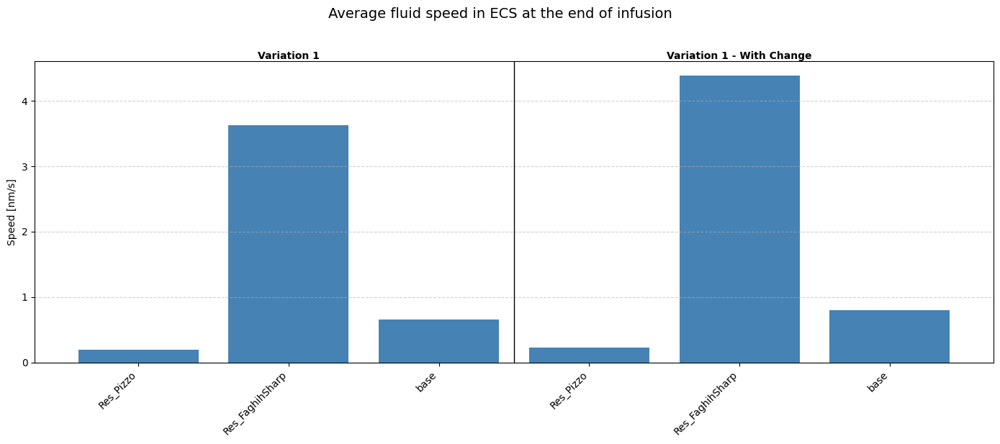

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

# === Manually defined file paths ===
base_path1 = "/content/drive/My Drive/227 Final Project/Variation 1 Results"
base_path3 = "/content/drive/My Drive/227 Final Project/Variation 3 Results"
base_path5 = "/content/drive/My Drive/227 Final Project/Variation 5"
paths = {
    "Variation 1": {
    "Res_Pizzo": base_path1+"/Res_Pizzo_original/speed_average.dat",
    "Res_FaghihSharp": base_path1+"/Res_FaghihSharp_original/speed_average.dat",
    "base": base_path1+"/base1_original/speed_average.dat"
},
    "Variation 1 - With Change": {
    "Res_Pizzo": base_path1+"/Res_Pizzo/speed_average.dat",
    "Res_FaghihSharp": base_path1+"/Res_FaghihSharp/speed_average.dat",
    "base": base_path1+"/base1/speed_average.dat"
}
}

# === Load ECS speeds ===
group_labels = []
bar_labels = []
bar_values = []

for group, subpaths in paths.items():
    group_labels.extend([group] * len(subpaths))
    for label, file_path in subpaths.items():
        bar_labels.append(label)
        if os.path.exists(file_path):
            try:
                data = np.loadtxt(file_path, skiprows=1)
                speed = data[-1, -1]
            except Exception as e:
                print(f"Error reading {file_path}: {e}")
                speed = np.nan
        else:
            print(f"Missing: {file_path}")
            speed = np.nan
        bar_values.append(speed)

# === Plotting ===
x = np.arange(len(bar_labels))
plt.figure(figsize=(14, 6))
bars = plt.bar(x, bar_values, color='steelblue')

# Add gridlines between groups
prev_group = group_labels[0]
for i in range(1, len(group_labels)):
    if group_labels[i] != prev_group:
        plt.axvline(i - 0.5, color='black', linewidth=1)
        prev_group = group_labels[i]

# X-axis labels
plt.xticks(x, bar_labels, rotation=45, ha='right')
plt.ylabel("Speed [nm/s]")
plt.suptitle("Average fluid speed in ECS at the end of infusion", fontsize=14, y=1.02)
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Leave room for the suptitle
plt.grid(True, axis='y', linestyle='--', alpha=0.6)

# Add variation labels above groups
group_centers = {}
for i, grp in enumerate(group_labels):
    if grp not in group_centers:
        group_centers[grp] = []
    group_centers[grp].append(i)

for grp, idxs in group_centers.items():
    center = np.mean(idxs)
    plt.text(center, max(bar_values) * 1.05, grp, ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

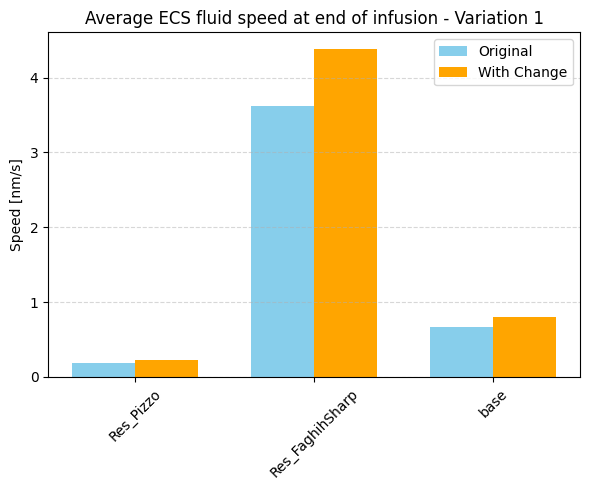

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

# === File Paths ===
base_path1 = "/content/drive/My Drive/227 Final Project/Variation 1 Results"

conditions = {
    "Original": {
        "Res_Pizzo": base_path1 + "/Res_Pizzo_original/speed_average.dat",
        "Res_FaghihSharp": base_path1 + "/Res_FaghihSharp_original/speed_average.dat",
        "base": base_path1 + "/base1_original/speed_average.dat"
    },
    "With Change": {
        "Res_Pizzo": base_path1 + "/Res_Pizzo/speed_average.dat",
        "Res_FaghihSharp": base_path1 + "/Res_FaghihSharp/speed_average.dat",
        "base": base_path1 + "/base1/speed_average.dat"
    }
}

# === Load Data ===
subgroups = list(conditions["Original"].keys())
speeds = {label: [] for label in subgroups}

for condition in conditions:
    for label in subgroups:
        file_path = conditions[condition][label]
        if os.path.exists(file_path):
            try:
                data = np.loadtxt(file_path, skiprows=1)
                speed = data[-1, -1]
            except Exception as e:
                print(f"Error reading {file_path}: {e}")
                speed = np.nan
        else:
            print(f"Missing: {file_path}")
            speed = np.nan
        speeds[label].append(speed)

# === Plotting ===
x = np.arange(len(subgroups))
width = 0.35

fig, ax = plt.subplots(figsize=(6, 5))  # Narrower plot

bars1 = ax.bar(x - width/2, [speeds[label][0] for label in subgroups], width, label="Original", color='skyblue')
bars2 = ax.bar(x + width/2, [speeds[label][1] for label in subgroups], width, label="With Change", color='orange')

ax.set_ylabel("Speed [nm/s]")
ax.set_title("Average ECS fluid speed at end of infusion - Variation 1")
ax.set_xticks(x)
ax.set_xticklabels(subgroups, rotation=45)
ax.legend()
ax.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


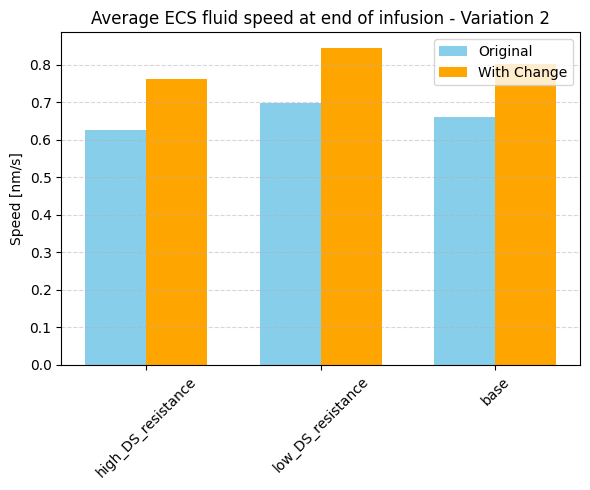

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

# === File Paths ===
base_path2 = "/content/drive/My Drive/227 Final Project/Variation 2 Results"

conditions = {
    "Original": {
        "high_DS_resistance": base_path2 + "/high_DS_resistance_original/speed_average.dat",
        "low_DS_resistance": base_path2 + "/low_DS_resistance_original/speed_average.dat",
        "base": base_path2 + "/base2/speed_average.dat"
    },
    "With Change": {
        "high_DS_resistance": base_path2 + "/high_DS_resistance/speed_average.dat",
        "low_DS_resistance": base_path2 + "/low_DS_resistance/speed_average.dat",
        "base": base_path2 + "/base/speed_average.dat"
    }
}

# === Load Data ===
subgroups = list(conditions["Original"].keys())
speeds = {label: [] for label in subgroups}

for condition in conditions:
    for label in subgroups:
        file_path = conditions[condition][label]
        if os.path.exists(file_path):
            try:
                data = np.loadtxt(file_path, skiprows=1)
                speed = data[-1, -1]
            except Exception as e:
                print(f"Error reading {file_path}: {e}")
                speed = np.nan
        else:
            print(f"Missing: {file_path}")
            speed = np.nan
        speeds[label].append(speed)

# === Plotting ===
x = np.arange(len(subgroups))
width = 0.35

fig, ax = plt.subplots(figsize=(6, 5))  # Narrower plot

bars1 = ax.bar(x - width/2, [speeds[label][0] for label in subgroups], width, label="Original", color='skyblue')
bars2 = ax.bar(x + width/2, [speeds[label][1] for label in subgroups], width, label="With Change", color='orange')

ax.set_ylabel("Speed [nm/s]")
ax.set_title("Average ECS fluid speed at end of infusion - Variation 2")
ax.set_xticks(x)
ax.set_xticklabels(subgroups, rotation=45)
ax.legend()
ax.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


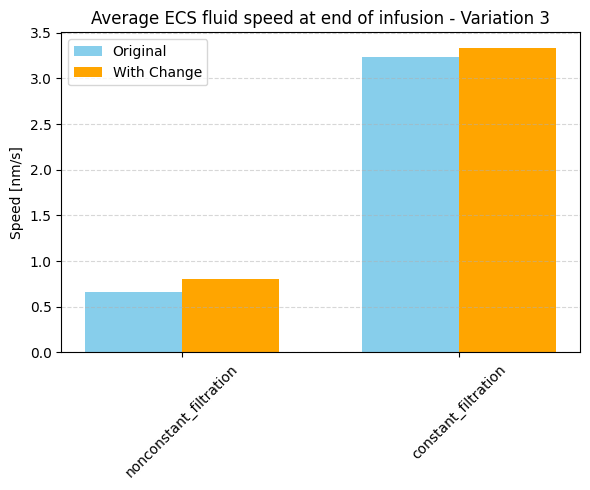

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

# === File Paths ===
base_path3 = "/content/drive/My Drive/227 Final Project/Variation 3 Results"


conditions = {
    "Original": {
        "nonconstant_filtration": base_path3 + "/nonconstant_filtration_original/speed_average.dat",
        "constant_filtration": base_path3 + "/constant_filtration_original/speed_average.dat"
    },
    "With Change": {
        "nonconstant_filtration": base_path3 + "/nonconstant_filtration/speed_average.dat",
        "constant_filtration": base_path3 + "/constant_filtration/speed_average.dat"
    }
}

# === Load Data ===
subgroups = list(conditions["Original"].keys())
speeds = {label: [] for label in subgroups}

for condition in conditions:
    for label in subgroups:
        file_path = conditions[condition][label]
        if os.path.exists(file_path):
            try:
                data = np.loadtxt(file_path, skiprows=1)
                speed = data[-1, -1]
            except Exception as e:
                print(f"Error reading {file_path}: {e}")
                speed = np.nan
        else:
            print(f"Missing: {file_path}")
            speed = np.nan
        speeds[label].append(speed)

# === Plotting ===
x = np.arange(len(subgroups))
width = 0.35

fig, ax = plt.subplots(figsize=(6, 5))  # Narrower plot

bars1 = ax.bar(x - width/2, [speeds[label][0] for label in subgroups], width, label="Original", color='skyblue')
bars2 = ax.bar(x + width/2, [speeds[label][1] for label in subgroups], width, label="With Change", color='orange')

ax.set_ylabel("Speed [nm/s]")
ax.set_title("Average ECS fluid speed at end of infusion - Variation 3")
ax.set_xticks(x)
ax.set_xticklabels(subgroups, rotation=45)
ax.legend()
ax.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


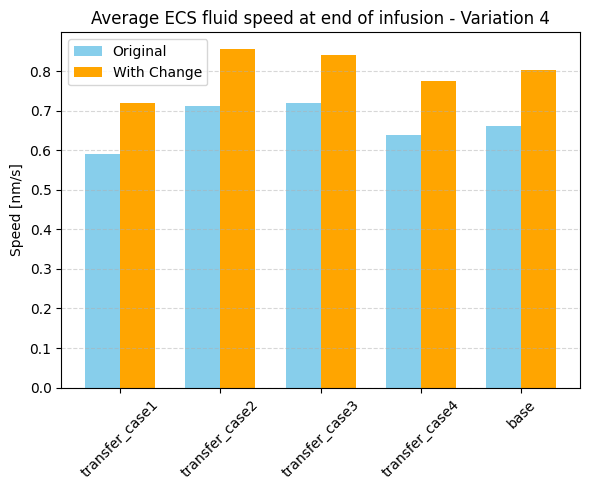

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

# === File Paths ===
base_path4 = "/content/drive/My Drive/227 Final Project/Variation 4 Results"



conditions = {
    "Original": {
        "transfer_case1": base_path4 + "/transfer_case1original/speed_average.dat",
        "transfer_case2": base_path4 + "/transfer_case2original/speed_average.dat",
        "transfer_case3": base_path4 + "/transfer_case3original/speed_average.dat",
        "transfer_case4": base_path4 + "/transfer_case4original/speed_average.dat",
        "base": base_path4 + "/base4_original/speed_average.dat"
    },
    "With Change": {
        "transfer_case1": base_path4 + "/transfer_case1/speed_average.dat",
        "transfer_case2": base_path4 + "/transfer_case2/speed_average.dat",
        "transfer_case3": base_path4 + "/transfer_case3/speed_average.dat",
        "transfer_case4": base_path4 + "/transfer_case4/speed_average.dat",
        "base": base_path4 + "/base/speed_average.dat"
    }
}

# === Load Data ===
subgroups = list(conditions["Original"].keys())
speeds = {label: [] for label in subgroups}

for condition in conditions:
    for label in subgroups:
        file_path = conditions[condition][label]
        if os.path.exists(file_path):
            try:
                data = np.loadtxt(file_path, skiprows=1)
                speed = data[-1, -1]
            except Exception as e:
                print(f"Error reading {file_path}: {e}")
                speed = np.nan
        else:
            print(f"Missing: {file_path}")
            speed = np.nan
        speeds[label].append(speed)

# === Plotting ===
x = np.arange(len(subgroups))
width = 0.35

fig, ax = plt.subplots(figsize=(6, 5))  # Narrower plot

bars1 = ax.bar(x - width/2, [speeds[label][0] for label in subgroups], width, label="Original", color='skyblue')
bars2 = ax.bar(x + width/2, [speeds[label][1] for label in subgroups], width, label="With Change", color='orange')

ax.set_ylabel("Speed [nm/s]")
ax.set_title("Average ECS fluid speed at end of infusion - Variation 4")
ax.set_xticks(x)
ax.set_xticklabels(subgroups, rotation=45)
ax.legend()
ax.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


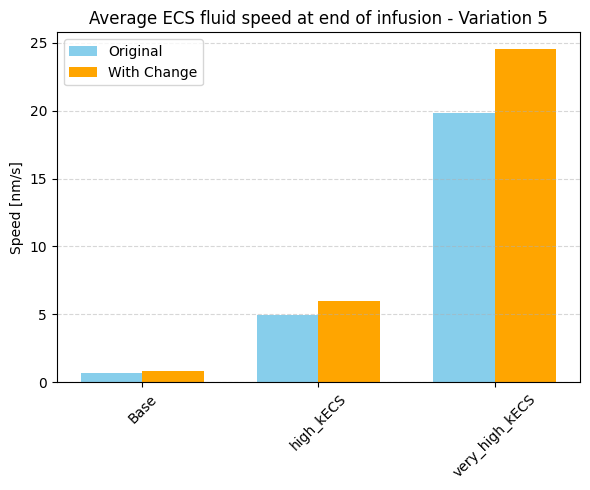

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

# === File Paths ===
base_path5 = "/content/drive/My Drive/227 Final Project/Variation 5"



conditions = {
    "Original": {
        "Base": base_path5 + "/base5_original/speed_average.dat",
        "high_kECS": base_path5 + "/high_kECS_original/speed_average.dat",
        "very_high_kECS": base_path5 + "/very_high_kECS_original/speed_average.dat" },
    "With Change": {
        "Base": base_path5 + "/base/speed_average.dat",
        "high_kECS": base_path5 + "/high_kECS/speed_average.dat",
        "very_high_kECS": base_path5 + "/very_high_kECS/speed_average.dat" }
}

# === Load Data ===
subgroups = list(conditions["Original"].keys())
speeds = {label: [] for label in subgroups}

for condition in conditions:
    for label in subgroups:
        file_path = conditions[condition][label]
        if os.path.exists(file_path):
            try:
                data = np.loadtxt(file_path, skiprows=1)
                speed = data[-1, -1]
            except Exception as e:
                print(f"Error reading {file_path}: {e}")
                speed = np.nan
        else:
            print(f"Missing: {file_path}")
            speed = np.nan
        speeds[label].append(speed)

# === Plotting ===
x = np.arange(len(subgroups))
width = 0.35

fig, ax = plt.subplots(figsize=(6, 5))  # Narrower plot

bars1 = ax.bar(x - width/2, [speeds[label][0] for label in subgroups], width, label="Original", color='skyblue')
bars2 = ax.bar(x + width/2, [speeds[label][1] for label in subgroups], width, label="With Change", color='orange')

ax.set_ylabel("Speed [nm/s]")
ax.set_title("Average ECS fluid speed at end of infusion - Variation 5")
ax.set_xticks(x)
ax.set_xticklabels(subgroups, rotation=45)
ax.legend()
ax.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

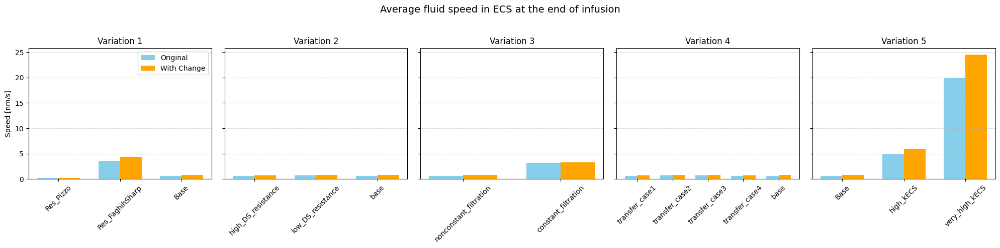

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

# === Paths for all variations ===
base_paths = {
    "Variation 1": "/content/drive/My Drive/227 Final Project/Variation 1 Results",
   "Variation 2": "/content/drive/My Drive/227 Final Project/Variation 2 Results",
    "Variation 3": "/content/drive/My Drive/227 Final Project/Variation 3 Results",
    "Variation 4": "/content/drive/My Drive/227 Final Project/Variation 4 Results",
    "Variation 5": "/content/drive/My Drive/227 Final Project/Variation 5"
}

# === Folder mappings for each variation ===
folder_mappings = {
    "Variation 1": {
        "Original": {"Res_Pizzo": "Res_Pizzo_original", "Res_FaghihSharp": "Res_FaghihSharp_original", "Base": "base1_original"},
        "With Change": {"Res_Pizzo": "Res_Pizzo", "Res_FaghihSharp": "Res_FaghihSharp", "Base": "base1"}
    },
    "Variation 2": {
        "Original": {"high_DS_resistance": "high_DS_resistance_original", "low_DS_resistance": "low_DS_resistance_original","base":"base2"},
        "With Change": {"high_DS_resistance": "high_DS_resistance", "low_DS_resistance": "low_DS_resistance","base":"base"}
    },

    "Variation 3": {
        "Original": {"nonconstant_filtration": "nonconstant_filtration_original", "constant_filtration": "constant_filtration_original"},
        "With Change": {"nonconstant_filtration": "nonconstant_filtration", "constant_filtration": "constant_filtration"}
    },
    "Variation 4": {
        "Original": {"transfer_case1": "transfer_case1original", "transfer_case2": "transfer_case2original","transfer_case3": "transfer_case3original","transfer_case4": "transfer_case4original","base":"base4_original"},
        "With Change": {"transfer_case1": "transfer_case1", "transfer_case2": "transfer_case2","transfer_case3": "transfer_case3","transfer_case4": "transfer_case4","base":"base"}
    },
    "Variation 5": {
        "Original": {"Base": "base5_original", "high_kECS": "high_kECS_original","very_high_kECS":"very_high_kECS_original"},
        "With Change": {"Base": "base", "high_kECS": "high_kECS","very_high_kECS":"very_high_kECS"}
    }
}

# === Create subplots ===
num_vars = len(base_paths)
fig, axes = plt.subplots(1, num_vars, figsize=(4 * num_vars, 5), sharey=True)

if num_vars == 1:
    axes = [axes]  # ensure it's iterable

for i, (var_name, base_path) in enumerate(base_paths.items()):
    ax = axes[i]
    configs = folder_mappings[var_name]
    labels = list(configs["Original"].keys())

    original_speeds = []
    changed_speeds = []

    for label in labels:
        # File paths
        path_orig = os.path.join(base_path, configs["Original"][label], "speed_average.dat")
        path_changed = os.path.join(base_path, configs["With Change"].get(label, ""), "speed_average.dat")

        # Read original
        if os.path.exists(path_orig):
            try:
                data = np.loadtxt(path_orig, skiprows=1)
                speed_orig = data[-1, -1]
            except:
                speed_orig = np.nan
        else:
            speed_orig = np.nan

        # Read with change
        if path_changed and os.path.exists(path_changed):
            try:
                data = np.loadtxt(path_changed, skiprows=1)
                speed_changed = data[-1, -1]
            except:
                speed_changed = np.nan
        else:
            speed_changed = np.nan

        original_speeds.append(speed_orig)
        changed_speeds.append(speed_changed)

    # Plot
    x = np.arange(len(labels))
    width = 0.35
    ax.bar(x - width/2, original_speeds, width, label='Original', color='skyblue')
    ax.bar(x + width/2, changed_speeds, width, label='With Change', color='orange')

    ax.set_title(var_name)
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45)
    ax.grid(axis='y', linestyle='--', alpha=0.5)
    if i == 0:
        ax.set_ylabel("Speed [nm/s]")

# Only add legend once
axes[0].legend()

plt.suptitle("Average fluid speed in ECS at the end of infusion", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


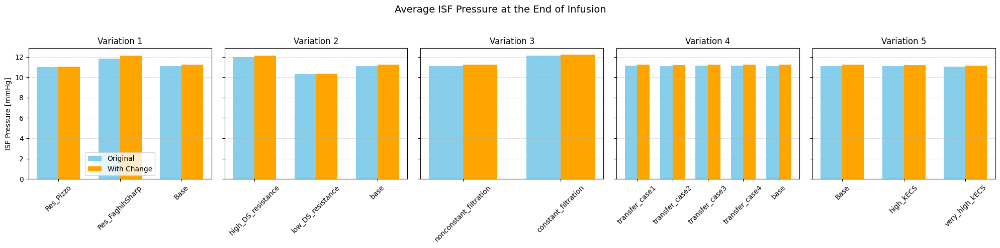

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

# === Paths for all variations ===
# === Paths for all variations ===
base_paths = {
    "Variation 1": "/content/drive/My Drive/227 Final Project/Variation 1 Results",
   "Variation 2": "/content/drive/My Drive/227 Final Project/Variation 2 Results",
    "Variation 3": "/content/drive/My Drive/227 Final Project/Variation 3 Results",
    "Variation 4": "/content/drive/My Drive/227 Final Project/Variation 4 Results",
    "Variation 5": "/content/drive/My Drive/227 Final Project/Variation 5"
}

# === Folder mappings for each variation ===
folder_mappings = {
    "Variation 1": {
        "Original": {"Res_Pizzo": "Res_Pizzo_original", "Res_FaghihSharp": "Res_FaghihSharp_original", "Base": "base1_original"},
        "With Change": {"Res_Pizzo": "Res_Pizzo", "Res_FaghihSharp": "Res_FaghihSharp", "Base": "base1"}
    },
    "Variation 2": {
        "Original": {"high_DS_resistance": "high_DS_resistance_original", "low_DS_resistance": "low_DS_resistance_original","base":"base2"},
        "With Change": {"high_DS_resistance": "high_DS_resistance", "low_DS_resistance": "low_DS_resistance","base":"base"}
    },

    "Variation 3": {
        "Original": {"nonconstant_filtration": "nonconstant_filtration_original", "constant_filtration": "constant_filtration_original"},
        "With Change": {"nonconstant_filtration": "nonconstant_filtration", "constant_filtration": "constant_filtration"}
    },
    "Variation 4": {
        "Original": {"transfer_case1": "transfer_case1original", "transfer_case2": "transfer_case2original","transfer_case3": "transfer_case3original","transfer_case4": "transfer_case4original","base":"base4_original"},
        "With Change": {"transfer_case1": "transfer_case1", "transfer_case2": "transfer_case2","transfer_case3": "transfer_case3","transfer_case4": "transfer_case4","base":"base"}
    },
    "Variation 5": {
        "Original": {"Base": "base5_original", "high_kECS": "high_kECS_original","very_high_kECS":"very_high_kECS_original"},
        "With Change": {"Base": "base", "high_kECS": "high_kECS","very_high_kECS":"very_high_kECS"}
    }
}


# === Create subplots ===
num_vars = len(base_paths)
fig, axes = plt.subplots(1, num_vars, figsize=(4 * num_vars, 5), sharey=True)

if num_vars == 1:
    axes = [axes]  # ensure it's iterable

for i, (var_name, base_path) in enumerate(base_paths.items()):
    ax = axes[i]
    configs = folder_mappings[var_name]
    labels = list(configs["Original"].keys())

    original_pressures = []
    changed_pressures = []

    for label in labels:
        # File paths
        path_orig = os.path.join(base_path, configs["Original"][label], "pressure_average.dat")
        path_changed = os.path.join(base_path, configs["With Change"].get(label, ""), "pressure_average.dat")

        # Read original
        if os.path.exists(path_orig):
            try:
                data = np.loadtxt(path_orig, skiprows=1)
                pressure_orig = data[-1, 7]  # ISF pressure = column 7
            except:
                pressure_orig = np.nan
        else:
            pressure_orig = np.nan

        # Read with change
        if path_changed and os.path.exists(path_changed):
            try:
                data = np.loadtxt(path_changed, skiprows=1)
                pressure_changed = data[-1, 7]  # ISF pressure = column 7
            except:
                pressure_changed = np.nan
        else:
            pressure_changed = np.nan

        original_pressures.append(pressure_orig)
        changed_pressures.append(pressure_changed)

    # Plot
    x = np.arange(len(labels))
    width = 0.35
    ax.bar(x - width/2, original_pressures, width, label='Original', color='skyblue')
    ax.bar(x + width/2, changed_pressures, width, label='With Change', color='orange')

    ax.set_title(var_name)
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45)
    ax.grid(axis='y', linestyle='--', alpha=0.5)
    if i == 0:
        ax.set_ylabel("ISF Pressure [mmHg]")

# Only add legend once
axes[0].legend()

plt.suptitle("Average ISF Pressure at the End of Infusion", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [ ]:
# === File Paths ===
base_path1 = "/content/drive/My Drive/227 Final Project/Variation 1 Results"

conditions = {
    "Original": {
        "Res_Pizzo": base_path1 + "/Res_Pizzo_original/speed_average.dat",
        "Res_FaghihSharp": base_path1 + "/Res_FaghihSharp_original/speed_average.dat",
        "base": base_path1 + "/base1_original/speed_average.dat"
    },
    "With Change": {
        "Res_Pizzo": base_path1 + "/Res_Pizzo/speed_average.dat",
        "Res_FaghihSharp": base_path1 + "/Res_FaghihSharp/speed_average.dat",
        "base": base_path1 + "/base1/speed_average.dat"
    }
}

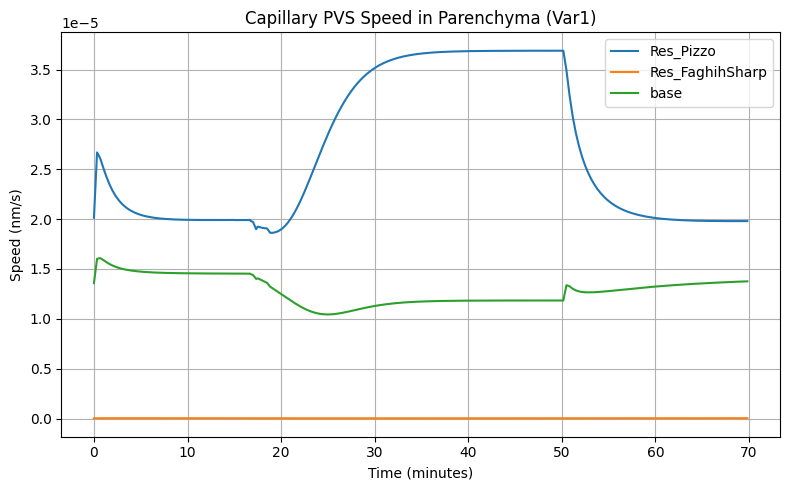

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
base_path1 = "/content/drive/My Drive/227 Final Project/Variation 1 Results"
# === File paths ===
paths = {
        "Res_Pizzo": base_path1 + "/Res_Pizzo_original/avg_speed_1.txt",
        "Res_FaghihSharp": base_path1 + "/Res_FaghihSharp_original/avg_speed_1.txt",
        "base": base_path1 + "/base1_original/avg_speed_1.txt"
}

# === Plotting ===
plt.figure(figsize=(8, 5))
for label, filepath in paths.items():
    data = np.loadtxt(filepath, skiprows=1)
    time = data[:, 0] / 60  # convert seconds to minutes
    speed = data[:, 5]
    plt.plot(time, speed, label=label)

plt.xlabel("Time (minutes)")
plt.ylabel("Speed (nm/s)")
plt.title("Capillary PVS Speed in Parenchyma (Var1)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


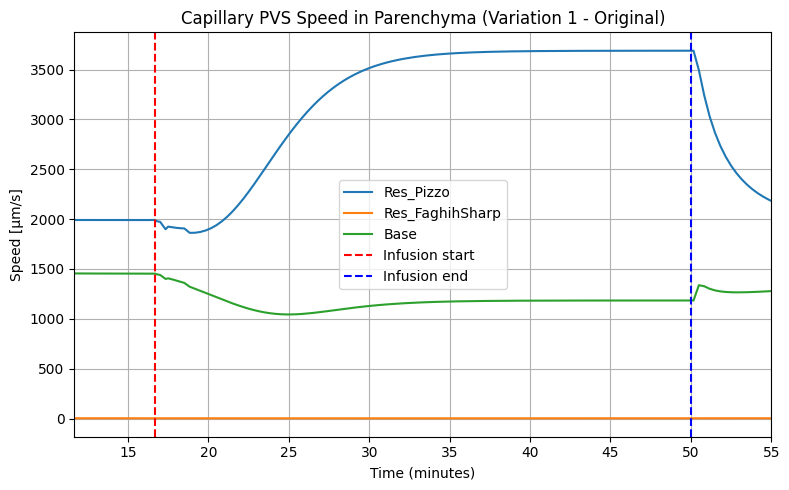

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

base_path1 = "/content/drive/My Drive/227 Final Project/Variation 1 Results"

# === File paths ===
paths = {
    "Res_Pizzo": base_path1 + "/Res_Pizzo_original/avg_speed_1.txt",
    "Res_FaghihSharp": base_path1 + "/Res_FaghihSharp_original/avg_speed_1.txt",
    "Base": base_path1 + "/base1_original/avg_speed_1.txt"
}

# === Plotting ===
plt.figure(figsize=(8, 5))
for label, filepath in paths.items():
    data = np.loadtxt(filepath, skiprows=1)
    time = data[:, 0] / 60  # convert to minutes
    speed = data[:, 5] *100000000    # PVS_c
    plt.plot(time, speed, label=label)

# Infusion window: 1000–3000 seconds → 16.67–50 minutes
plt.axvline(x=1000/60, color='red', linestyle='--', label='Infusion start')
plt.axvline(x=3000/60, color='blue', linestyle='--', label='Infusion end')
plt.xlim(1000/60-5, 3000/60+5)

plt.xlabel("Time (minutes)")
plt.ylabel("Speed [μm/s]")
plt.title("Capillary PVS Speed in Parenchyma (Variation 1 - Original)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


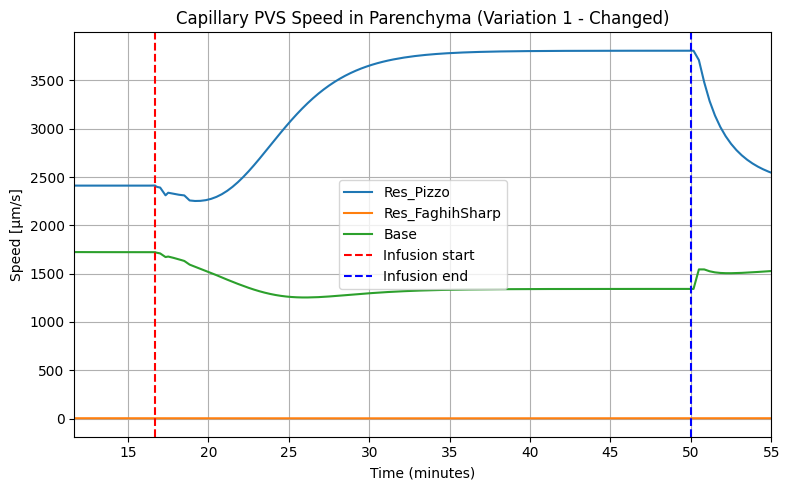

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

base_path1 = "/content/drive/My Drive/227 Final Project/Variation 1 Results"

# === File paths ===
paths = {
    "Res_Pizzo": base_path1 + "/Res_Pizzo/avg_speed_1.txt",
    "Res_FaghihSharp": base_path1 + "/Res_FaghihSharp/avg_speed_1.txt",
    "Base": base_path1 + "/base1/avg_speed_1.txt"
}

# === Plotting ===
plt.figure(figsize=(8, 5))
for label, filepath in paths.items():
    data = np.loadtxt(filepath, skiprows=1)
    time = data[:, 0] / 60  # convert to minutes
    speed = data[:, 5] *100000000    # PVS_c
    plt.plot(time, speed, label=label)

# Infusion window: 1000–3000 seconds → 16.67–50 minutes
plt.axvline(x=1000/60, color='red', linestyle='--', label='Infusion start')
plt.axvline(x=3000/60, color='blue', linestyle='--', label='Infusion end')
plt.xlim(1000/60-5, 3000/60+5)

plt.xlabel("Time (minutes)")
plt.ylabel("Speed [μm/s]")
plt.title("Capillary PVS Speed in Parenchyma (Variation 1 - Changed)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

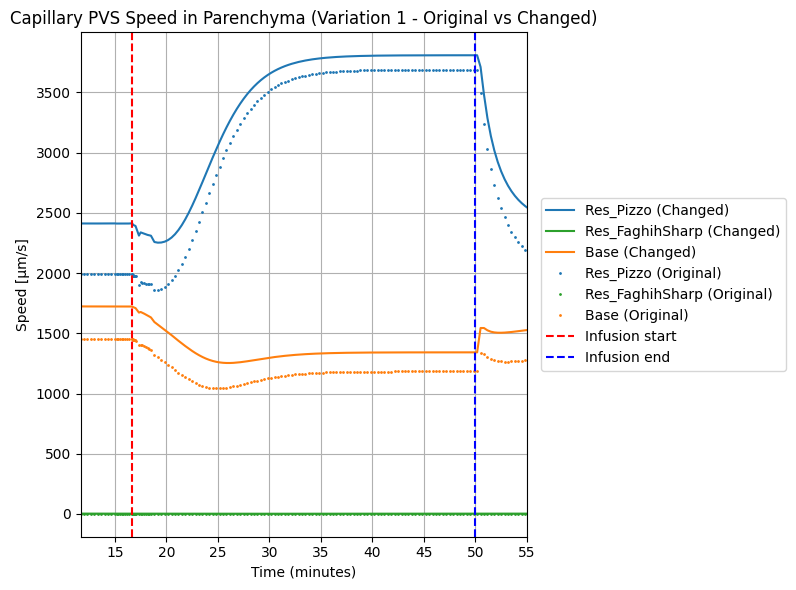

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

base_path1 = "/content/drive/My Drive/227 Final Project/Variation 1 Results"

# === File paths ===
paths_changed = {
    "Res_Pizzo": base_path1 + "/Res_Pizzo/avg_speed_1.txt",
    "Res_FaghihSharp": base_path1 + "/Res_FaghihSharp/avg_speed_1.txt",
    "Base": base_path1 + "/base1/avg_speed_1.txt"
}

paths_original = {
    "Res_Pizzo": base_path1 + "/Res_Pizzo_original/avg_speed_1.txt",
    "Res_FaghihSharp": base_path1 + "/Res_FaghihSharp_original/avg_speed_1.txt",
    "Base": base_path1 + "/base1_original/avg_speed_1.txt"
}

# Define consistent colors for each case
colors = {
    "Res_Pizzo": "tab:blue",
    "Res_FaghihSharp": "tab:green",
    "Base": "tab:orange"
}

plt.figure(figsize=(10, 6))

# Plot changed (solid lines)
for label, filepath in paths_changed.items():
    if os.path.exists(filepath):
        data = np.loadtxt(filepath, skiprows=1)
        time = data[:, 0] / 60
        speed = data[:, 5] * 1e8
        plt.plot(time, speed, label=f"{label} (Changed)", color=colors[label], linestyle='-')
    else:
        print(f"Missing changed file: {filepath}")

# Plot original (as dots, same color)
for label, filepath in paths_original.items():
    if os.path.exists(filepath):
        data = np.loadtxt(filepath, skiprows=1)
        time = data[:, 0] / 60
        speed = data[:, 5] * 1e8
        plt.plot(time, speed, label=f"{label} (Original)", color=colors[label], linestyle='None', marker='.', markersize=2)
    else:
        print(f"Missing original file: {filepath}")

# Infusion markers
plt.axvline(x=1000/60, color='red', linestyle='--', label='Infusion start')
plt.axvline(x=3000/60, color='blue', linestyle='--', label='Infusion end')
plt.xlim(1000/60 - 5, 3000/60 + 5)

# Labels, title, legend
plt.xlabel("Time (minutes)")
plt.ylabel("Speed [μm/s]")
plt.title("Capillary PVS Speed in Parenchyma (Variation 1 - Original vs Changed)")
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), borderaxespad=1)
plt.grid(True)
plt.tight_layout(rect=[0, 0, 0.8, 1])
plt.show()


ADDITIONAL PLOTS TO OBSERVE THE CHANGE

In [ ]:
base_path1 = "/content/drive/My Drive/227 Final Project/Variation 1 Results"
base_path2 = "/content/drive/My Drive/227 Final Project/Variation 2 Results"
base_path3 = "/content/drive/My Drive/227 Final Project/Variation 3 Results"
base_path4 = "/content/drive/My Drive/227 Final Project/Variation 4 Results"
base_path5 = "/content/drive/My Drive/227 Final Project/Variation 5"

In [ ]:
base_path_orig = {
    "var1": "/path/to/Variation 1 Results",
    "var2": "/path/to/Variation 2 Results",
    "var3": "/path/to/Variation 3 Results",
    "var4": "/path/to/Variation 4 Results",
    "var5": "/path/to/Variation 5"
}

base_path_chng = base_path_orig  # if originals and changed are in same parent directory


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_comparison(
    file_original, file_changed, column_index,
    ylabel, title, legend_labels,
    unit_scale=1.0, time_unit='min'
):
    """
    Plot a specific column from two files over time for comparison.

    Parameters:
    - file_original: str, path to the original model output file
    - file_changed: str, path to the changed model output file
    - column_index: int, index of the column to plot (excluding time)
    - ylabel: str, label for the y-axis
    - title: str, title of the plot
    - legend_labels: tuple of str, labels for the legend (original, changed)
    - unit_scale: float, multiplier to convert values to desired unit
    - time_unit: str, 'min' or 's' for time on x-axis
    """
    # Load data
    data_orig = np.loadtxt(file_original, skiprows=1)
    data_chng = np.loadtxt(file_changed, skiprows=1)

    # Extract time and data
    time_orig = data_orig[:, 0] / 60 if time_unit == 'min' else data_orig[:, 0]
    time_chng = data_chng[:, 0] / 60 if time_unit == 'min' else data_chng[:, 0]

    values_orig = data_orig[:, column_index + 1] * unit_scale
    values_chng = data_chng[:, column_index + 1] * unit_scale

    # Plotting
    plt.figure(figsize=(8, 5))
    plt.plot(time_orig, values_orig, linestyle='--', label=legend_labels[0])
    plt.plot(time_chng, values_chng, linestyle='-', label=legend_labels[1])
    plt.xlabel(f"Time ({time_unit})")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:
def plot_all_variation_subcases(base_path_orig, base_path_chng):
    var_map = {
        "var3": [
            ("constant_filtration_original", "constant_filtration"),
            ("nonconstant_filtration_original", "nonconstant_filtration")
        ],
        "var4": [
            (f"transfer_case{i}_original", f"transfer_case{i}") for i in range(5)
        ],
        "var5": [
            ("base", "base"),
            ("high_kECS_original", "high_kECS"),
            ("very_high_kECS_original", "very_high_kECS")
        ]
    }

    metrics = {
        "ISF Pressure": ("pressure_average.dat", 6, "ISF Pressure (mmHg)"),
        "CSF Pressure": ("pressure_average.dat", 7, "CSF Pressure (mmHg)"),
        "ISF Speed": ("speed_average.dat", 6, "ISF Speed (nm/s)")
    }

    ecs_sources = ["PVS_a", "PVS_c", "capillary"]
    regions = [1, 2, 3]
    compartments = ["Arterial", "Capillary", "Venous", "PVS_a", "PVS_c", "PVS_v", "ISF"]

    for var, subcases in var_map.items():
        for orig_name, chng_name in subcases:
            print(f"\n=== {var.upper()} | Comparing {orig_name} vs {chng_name} ===")

            # === Global plots ===
            for metric_name, (fname, col, ylabel) in metrics.items():
                f_orig = os.path.join(base_path_orig, orig_name, fname)
                f_chng = os.path.join(base_path_chng, chng_name, fname)
                try:
                    plot_comparison(f_orig, f_chng, col, ylabel, f"{metric_name} - {orig_name}", ("Original", "Changed"))
                except Exception as e:
                    print(f"Skipped {metric_name} ({orig_name}): {e}")

            # === Compartment pressures ===
            for i, label in enumerate(compartments):
                f_orig = os.path.join(base_path_orig, orig_name, "pressure_average.dat")
                f_chng = os.path.join(base_path_chng, chng_name, "pressure_average.dat")
                try:
                    plot_comparison(f_orig, f_chng, i, f"{label} Pressure (mmHg)", f"{label} Pressure - {orig_name}", ("Original", "Changed"))
                except Exception as e:
                    print(f"Skipped {label} Pressure ({orig_name}): {e}")

            # === ECS transfers ===
            for src in ecs_sources:
                fname = f"transfer_{src}_ISF.txt"
                f_orig = os.path.join(base_path_orig, orig_name, fname)
                f_chng = os.path.join(base_path_chng, chng_name, fname)
                try:
                    plot_comparison(f_orig, f_chng, 1, "Flow (μL/min)", f"{src} → ISF Transfer - {orig_name}", ("Original", "Changed"))
                except Exception as e:
                    print(f"Skipped ECS Transfer {src} ({orig_name}): {e}")

            # === Region-specific ISF pressure ===
            for region in regions:
                f_orig = os.path.join(base_path_orig, orig_name, f"avg_pressure_{region}.dat")
                f_chng = os.path.join(base_path_chng, chng_name, f"avg_pressure_{region}.dat")
                try:
                    plot_comparison(f_orig, f_chng, 6, "ISF Pressure (mmHg)", f"Region {region} ISF Pressure - {orig_name}", ("Original", "Changed"))
                except Exception as e:
                    print(f"Skipped Region {region} ISF ({orig_name}): {e}")


In [ ]:
plot_all_variation_subcases(base_path_orig["var3"], base_path_chng["var3"])



=== VAR3 | Comparing constant_filtration_original vs constant_filtration ===
Skipped ISF Pressure (constant_filtration_original): /path/to/Variation 3 Results/constant_filtration_original/pressure_average.dat not found.
Skipped CSF Pressure (constant_filtration_original): /path/to/Variation 3 Results/constant_filtration_original/pressure_average.dat not found.
Skipped ISF Speed (constant_filtration_original): /path/to/Variation 3 Results/constant_filtration_original/speed_average.dat not found.
Skipped Arterial Pressure (constant_filtration_original): /path/to/Variation 3 Results/constant_filtration_original/pressure_average.dat not found.
Skipped Capillary Pressure (constant_filtration_original): /path/to/Variation 3 Results/constant_filtration_original/pressure_average.dat not found.
Skipped Venous Pressure (constant_filtration_original): /path/to/Variation 3 Results/constant_filtration_original/pressure_average.dat not found.
Skipped PVS_a Pressure (constant_filtration_original): /

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

# === Plotting Function ===
def plot_comparison(file_original, file_changed, column_index, ylabel, title, legend_labels, unit_scale=1.0, time_unit='min'):
    try:
        data_orig = np.loadtxt(file_original, skiprows=1)
        data_chng = np.loadtxt(file_changed, skiprows=1)
    except Exception as e:
        print(f"Error reading files:\n  {file_original}\n  {file_changed}\n  {e}")
        return

    time_orig = data_orig[:, 0] / 60 if time_unit == 'min' else data_orig[:, 0]
    time_chng = data_chng[:, 0] / 60 if time_unit == 'min' else data_chng[:, 0]
    values_orig = data_orig[:, column_index + 1] * unit_scale
    values_chng = data_chng[:, column_index + 1] * unit_scale

    plt.figure(figsize=(8, 5))
    plt.plot(time_orig, values_orig, linestyle='--', label=legend_labels[0])
    plt.plot(time_chng, values_chng, linestyle='-', label=legend_labels[1])
    plt.xlabel(f"Time ({time_unit})")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# === Master Loop Function ===
def run_all_plots():
    base_dirs = {
        "var1": "/content/drive/MyDrive/227 Final Project/Variation 1 Results",
        "var2": "/content/drive/MyDrive/227 Final Project/Variation 2 Results",
        "var3": "/content/drive/MyDrive/227 Final Project/Variation 3 Results",
        "var4": "/content/drive/MyDrive/227 Final Project/Variation 4 Results",
        "var5": "/content/drive/MyDrive/227 Final Project/Variation 5"
    }

    variation_subcases = {
        "var1": [
            ("base1_original", "base1"),
            ("Res_FaghihSharp_original", "Res_FaghihSharp"),
            ("Res_Pizzo_original", "Res_Pizzo")
        ],
        "var2": [
            ("high_DS_resistance_original", "high_DS_resistance"),
            ("low_DS_resistance_original", "low_DS_resistance")
        ],
        "var3": [
            ("constant_filtration_original", "constant_filtration"),
            ("nonconstant_filtration_original", "nonconstant_filtration")
        ],
        "var4": [
            ("base4_original", "base"),
            ("transfer_case1original", "transfer_case1"),
            ("transfer_case2original", "transfer_case2"),
            ("transfer_case3original", "transfer_case3"),
            ("transfer_case4original", "transfer_case4")
        ],
        "var5": [
            ("base5_original", "base"),
            ("high_kECS_original", "high_kECS"),
            ("very_high_kECS_original", "very_high_kECS")
        ]
    }

    metrics = {
        "ISF Pressure": ("pressure_average.dat", 6, "ISF Pressure (mmHg)"),
        "CSF Pressure": ("pressure_average.dat", 7, "CSF Pressure (mmHg)"),
        "ISF Speed": ("speed_average.dat", 6, "ISF Speed (nm/s)")
    }

    ecs_sources = ["PVS_a", "PVS_c", "capillary"]
    regions = [1, 2, 3]
    compartments = ["Arterial", "Capillary", "Venous", "PVS_a", "PVS_c", "PVS_v", "ISF"]

    for var, subcases in variation_subcases.items():
        var_path = base_dirs[var]
        for original, changed in subcases:
            print(f"\n=== {var.upper()} | {original} vs {changed} ===")
            path_orig = os.path.join(var_path, original)
            path_chng = os.path.join(var_path, changed)

            # Global metrics
            for metric_name, (filename, col_idx, ylabel) in metrics.items():
                f_orig = os.path.join(path_orig, filename)
                f_chng = os.path.join(path_chng, filename)
                plot_comparison(f_orig, f_chng, col_idx, ylabel,
                                f"{metric_name} - {var} - {original}",
                                ("Original", "Changed"))

            # Compartment pressures
            for i, comp in enumerate(compartments):
                f_orig = os.path.join(path_orig, "pressure_average.dat")
                f_chng = os.path.join(path_chng, "pressure_average.dat")
                plot_comparison(f_orig, f_chng, i, f"{comp} Pressure (mmHg)",
                                f"{comp} Pressure - {var} - {original}",
                                ("Original", "Changed"))

            # ECS transfers
            for src in ecs_sources:
                transfer_file = f"transfer_{src}_ISF.txt"
                f_orig = os.path.join(path_orig, transfer_file)
                f_chng = os.path.join(path_chng, transfer_file)
                plot_comparison(f_orig, f_chng, 1, "Flow (μL/min)",
                                f"{src} → ISF Transfer - {var} - {original}",
                                ("Original", "Changed"))

            # Region-specific ISF pressure
            for region in regions:
                f_orig = os.path.join(path_orig, f"avg_pressure_{region}.dat")
                f_chng = os.path.join(path_chng, f"avg_pressure_{region}.dat")
                plot_comparison(f_orig, f_chng, 6, "ISF Pressure (mmHg)",
                                f"Region {region} ISF Pressure - {var} - {original}",
                                ("Original", "Changed"))



=== VAR1 | base1_original vs base1 ===


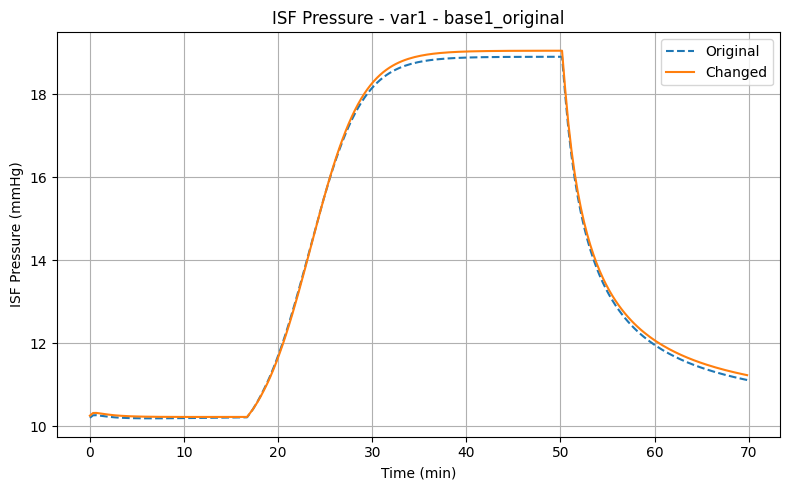

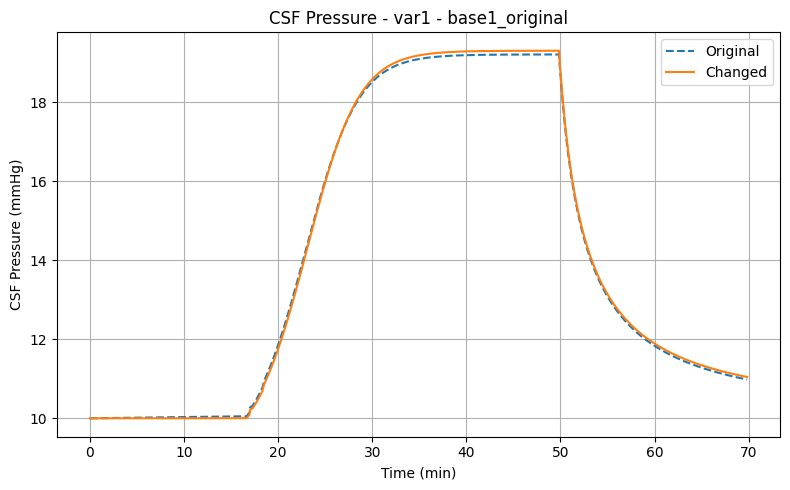

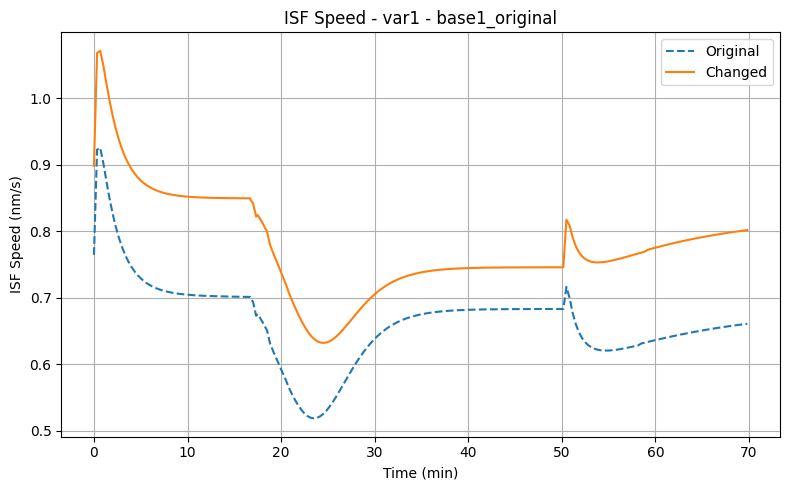

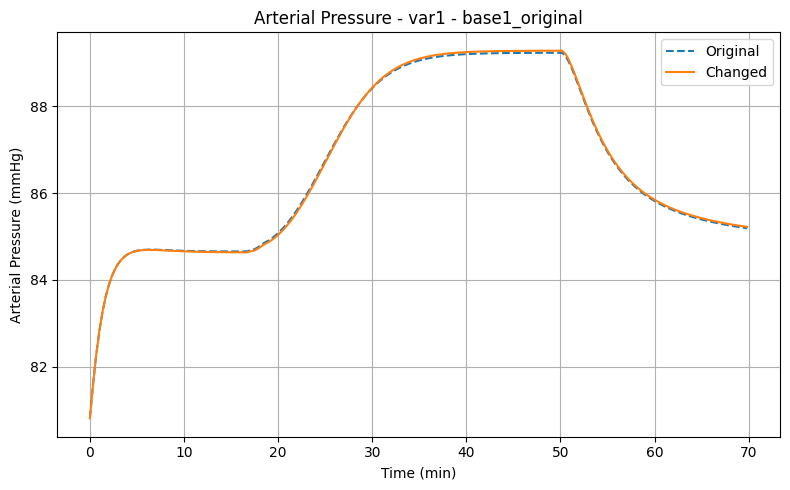

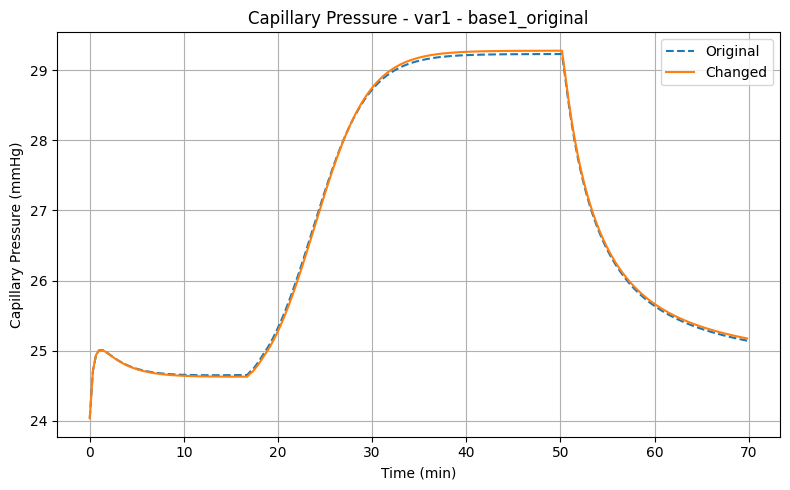

...

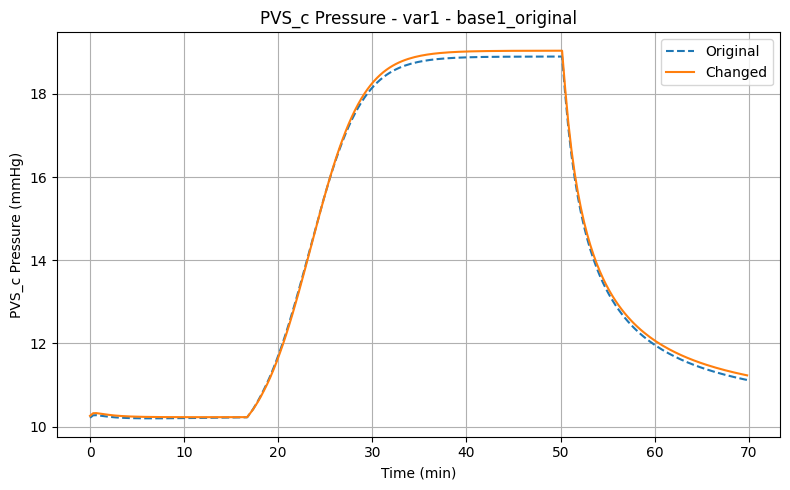

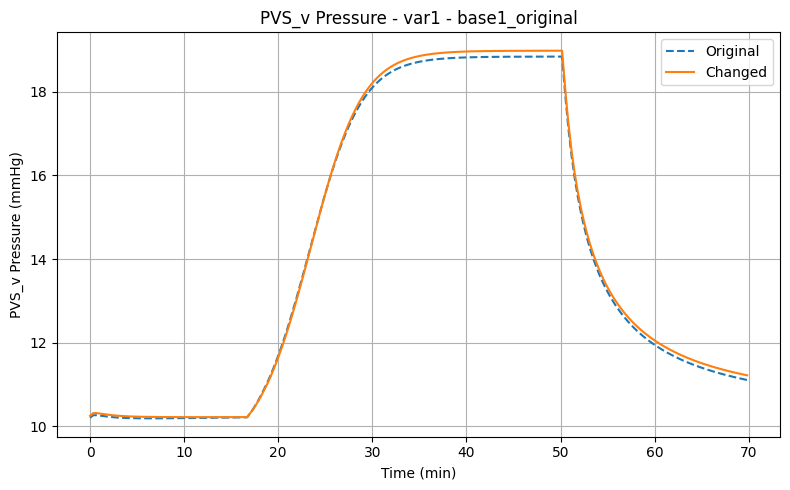

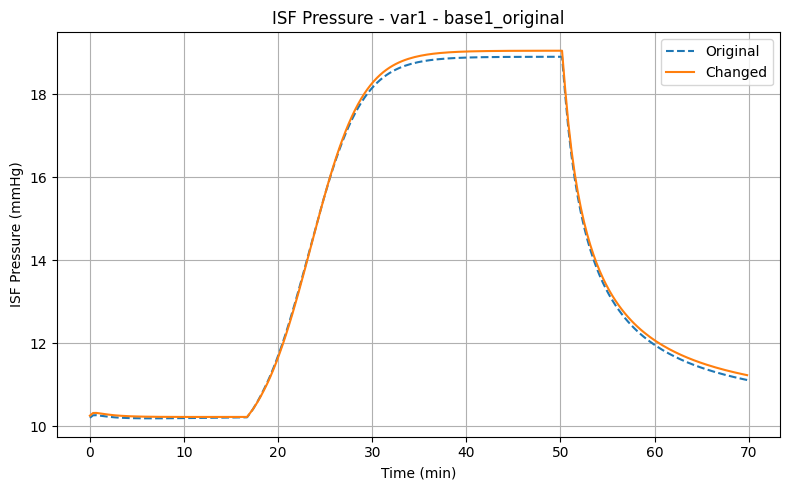

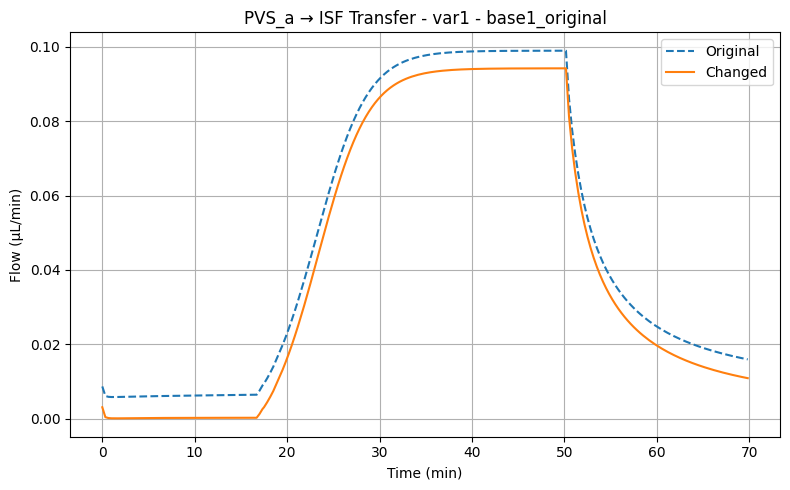

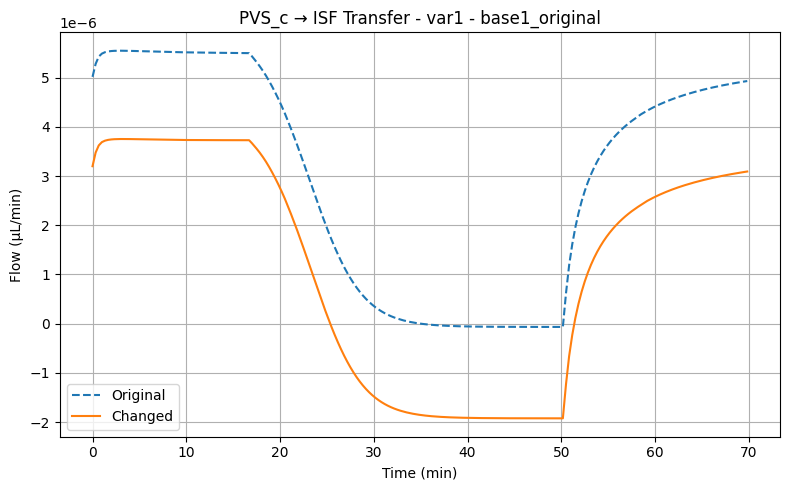

Error reading files:
  /content/drive/MyDrive/227 Final Project/Variation 1 Results/base1_original/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 1 Results/base1/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 1 Results/base1_original/transfer_capillary_ISF.txt not found.


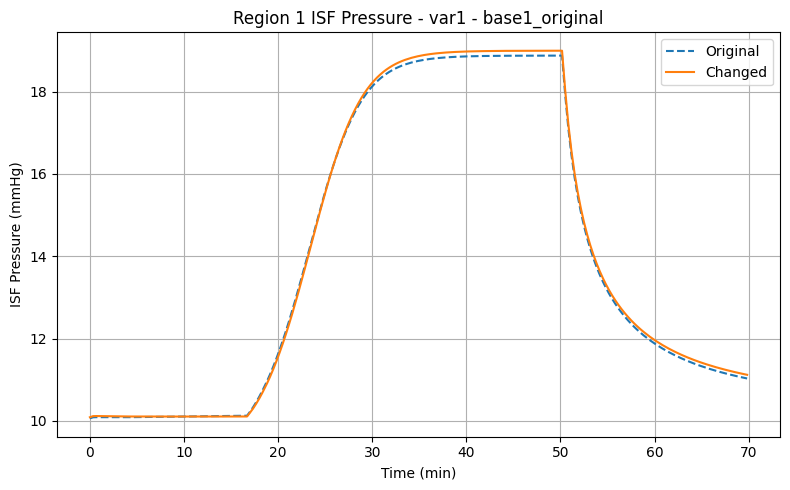

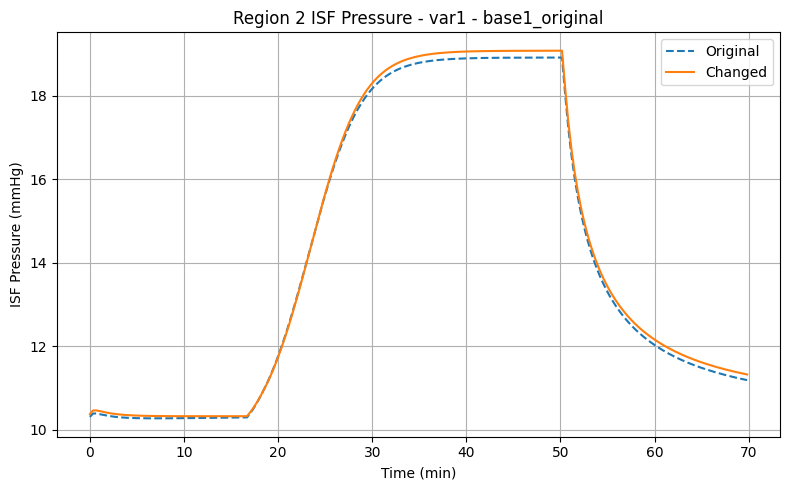

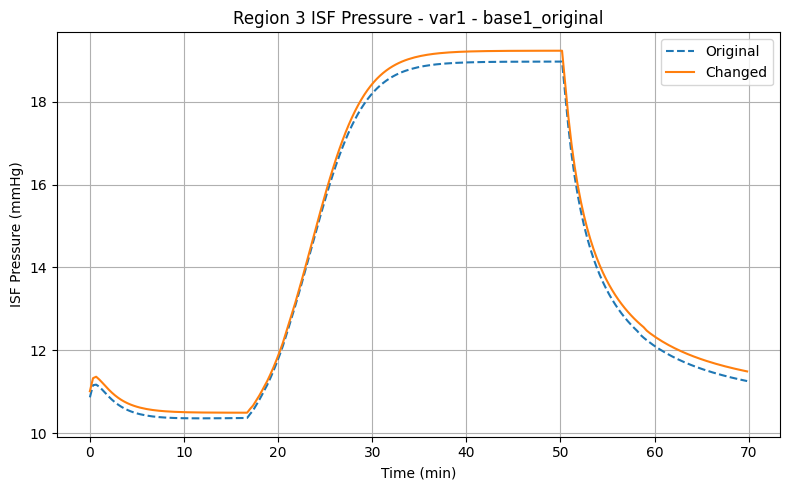


=== VAR1 | Res_FaghihSharp_original vs Res_FaghihSharp ===


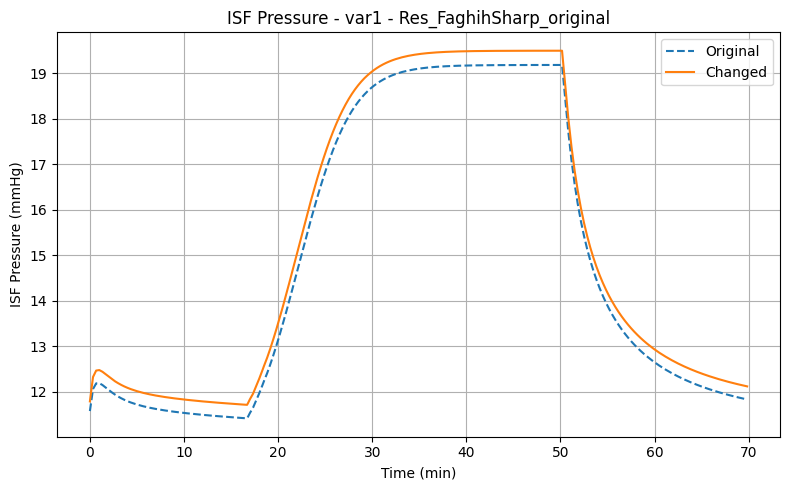

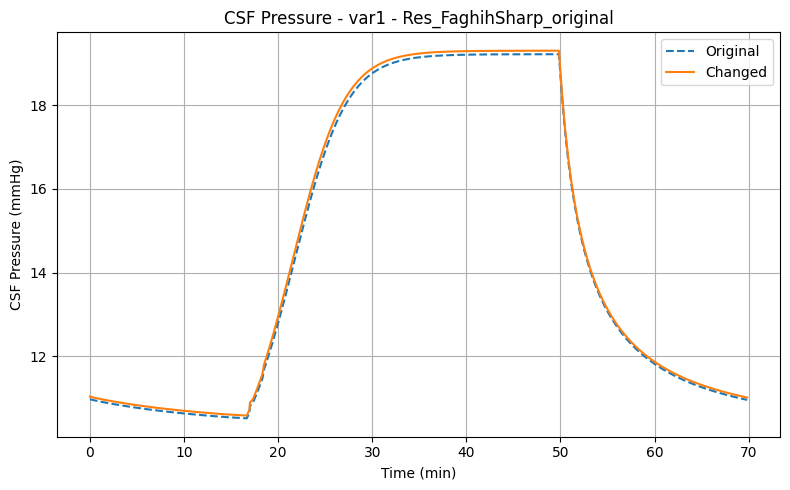

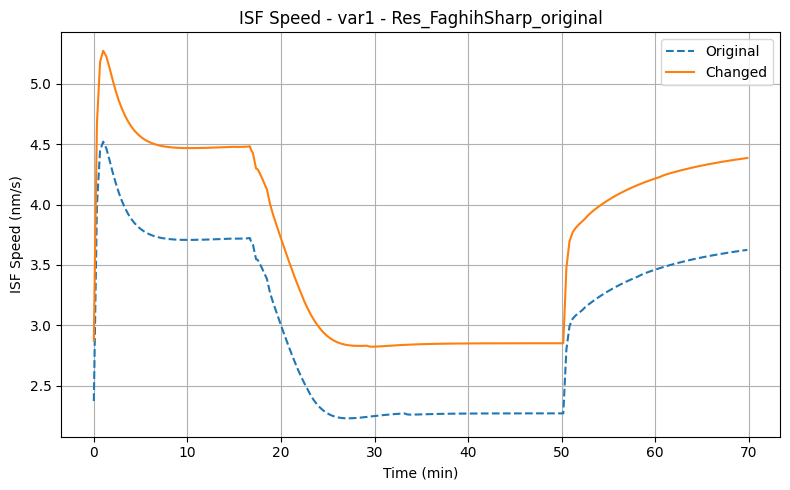

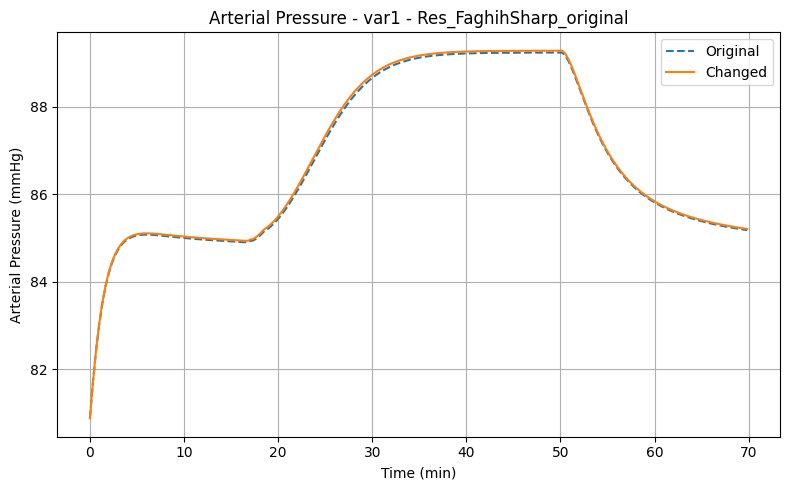

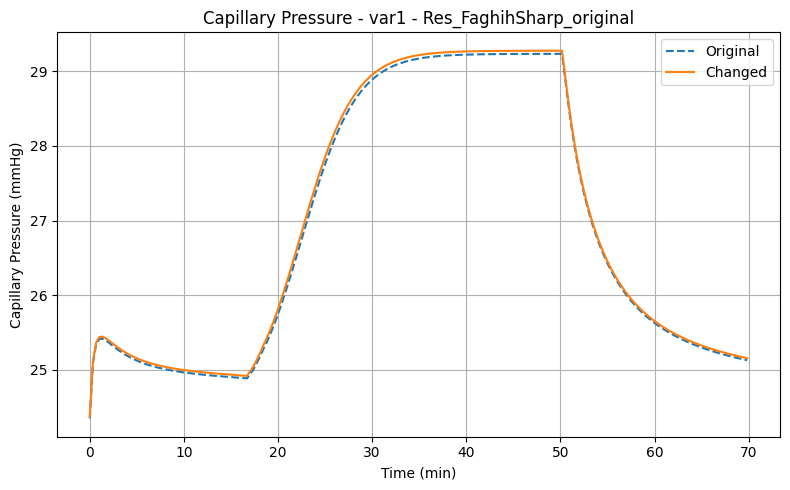

...

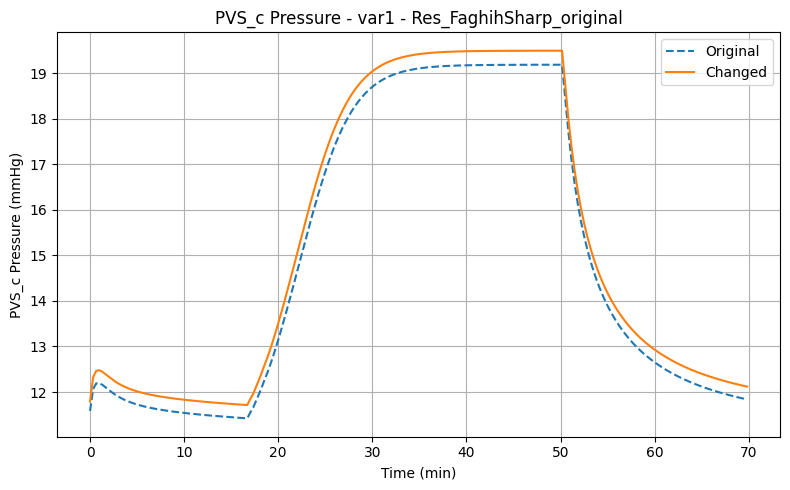

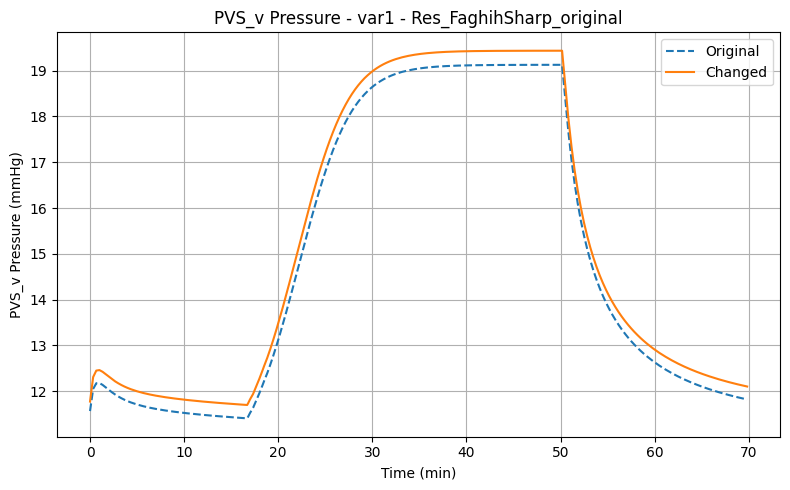

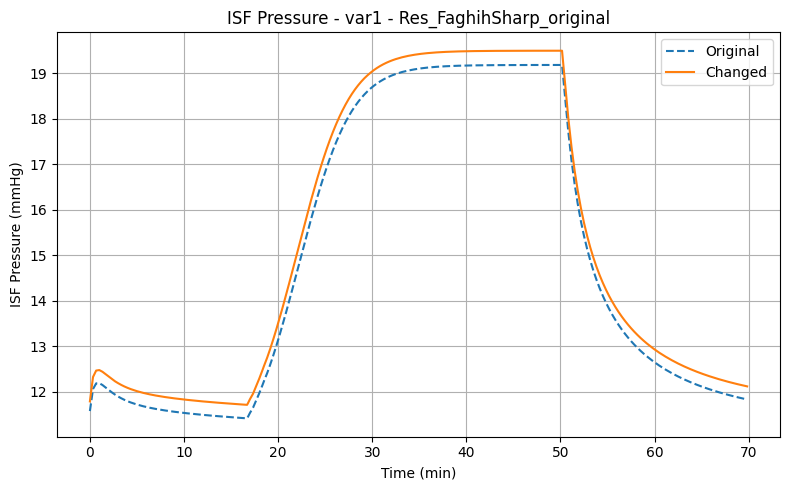

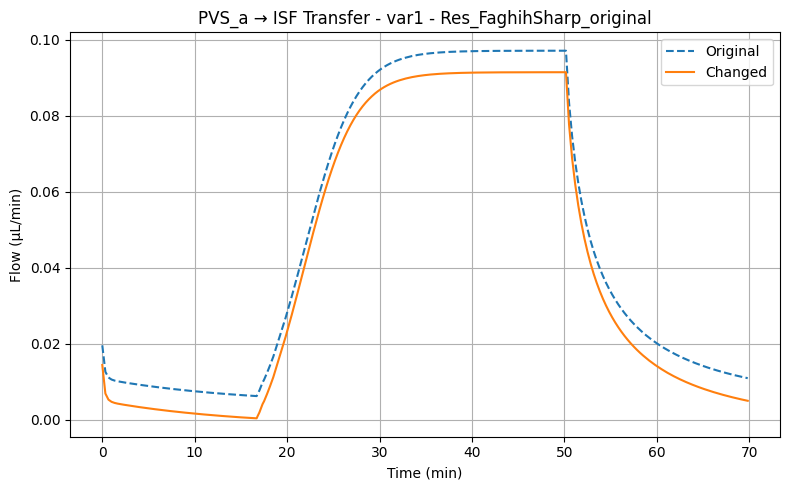

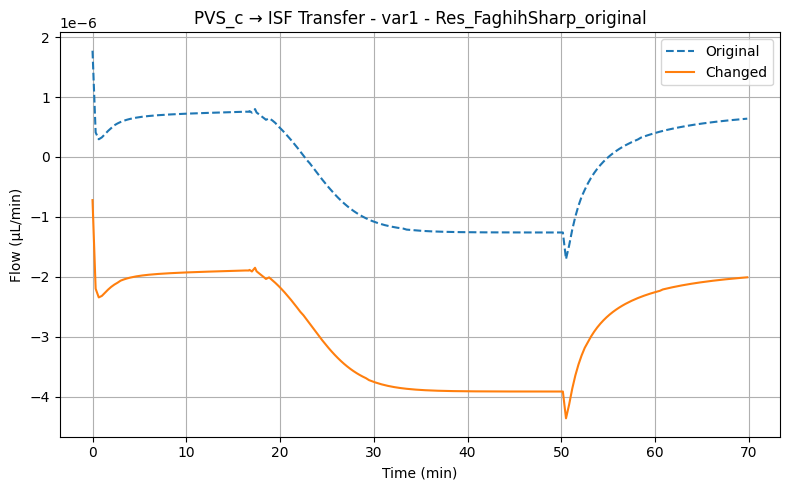

Error reading files:
  /content/drive/MyDrive/227 Final Project/Variation 1 Results/Res_FaghihSharp_original/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 1 Results/Res_FaghihSharp/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 1 Results/Res_FaghihSharp_original/transfer_capillary_ISF.txt not found.


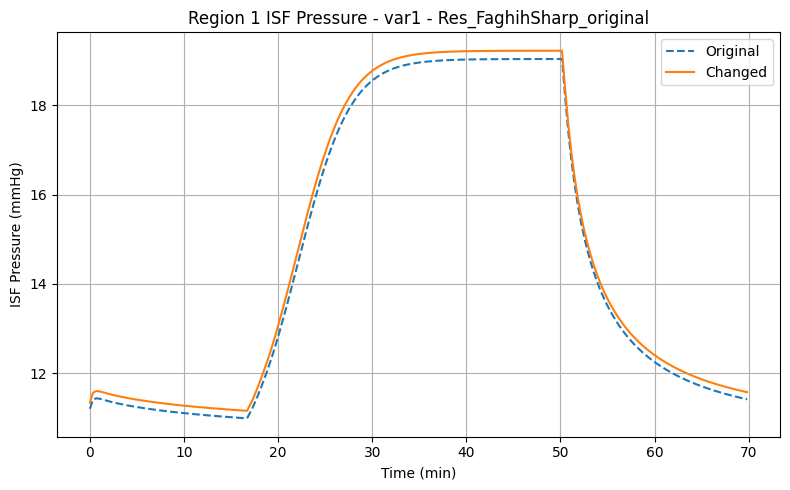

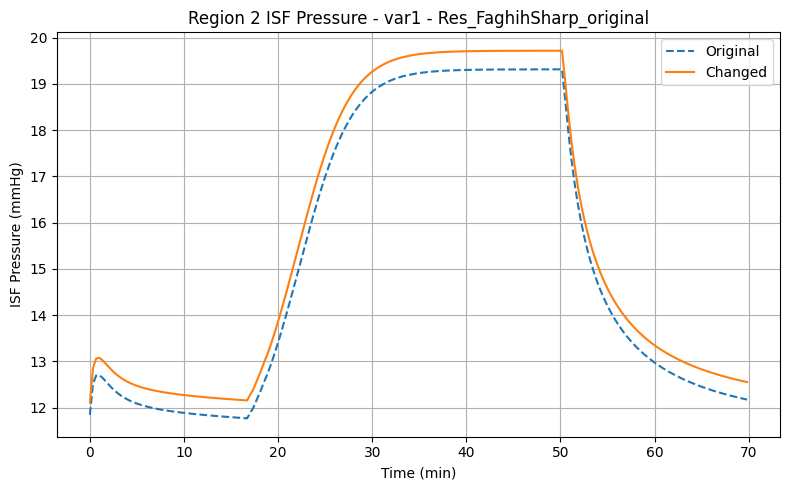

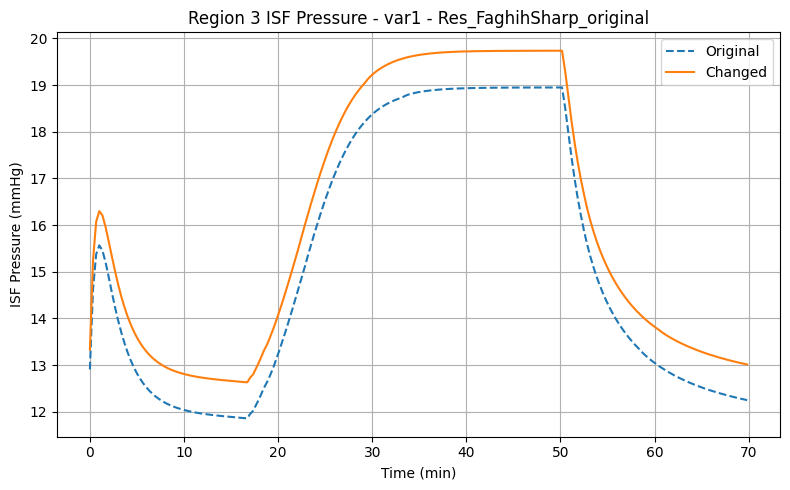


=== VAR1 | Res_Pizzo_original vs Res_Pizzo ===


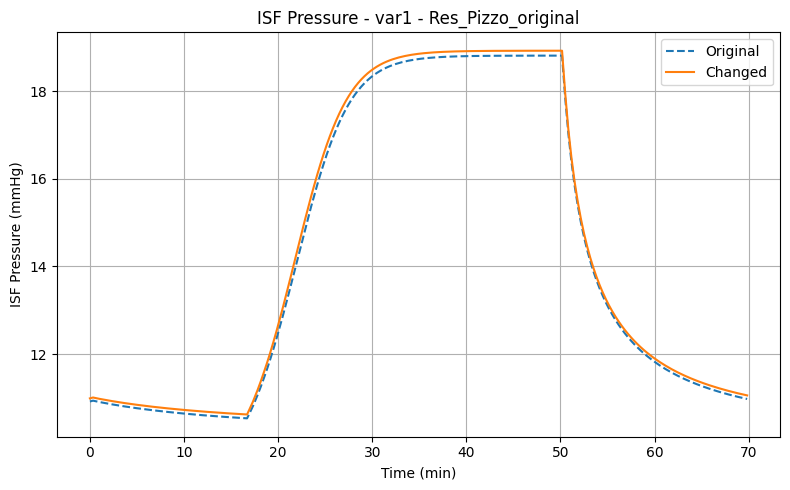

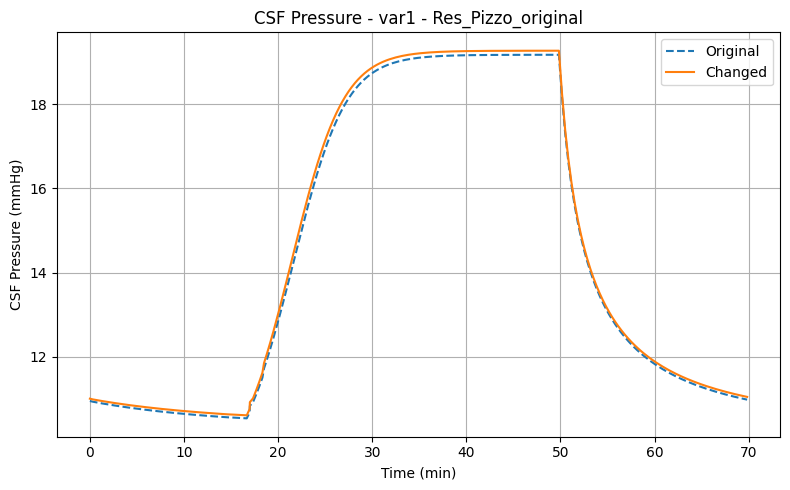

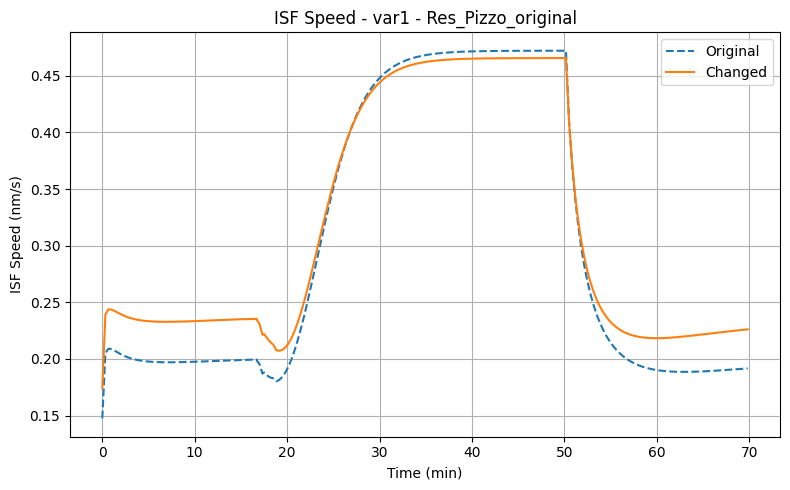

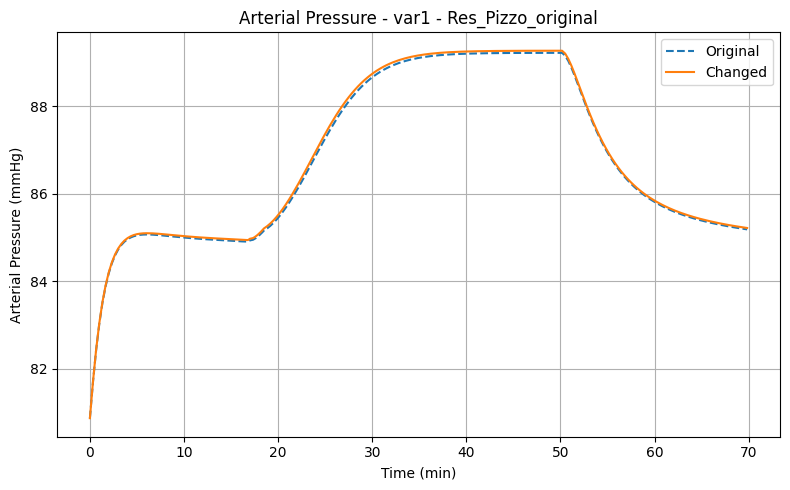

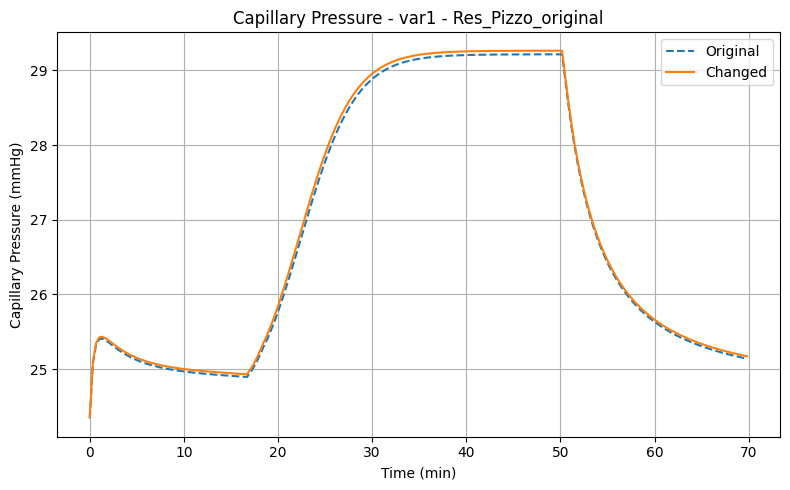

...

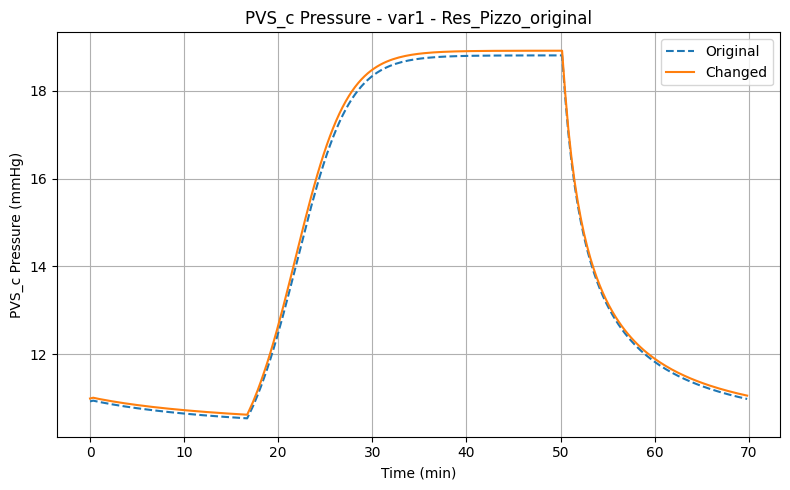

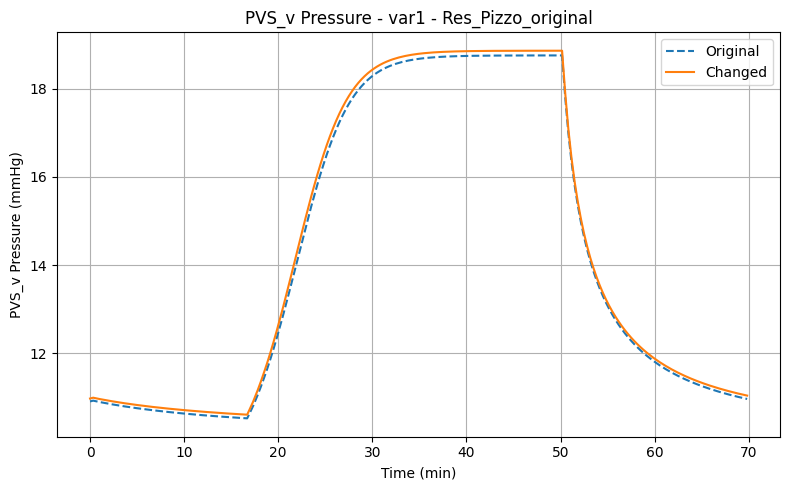

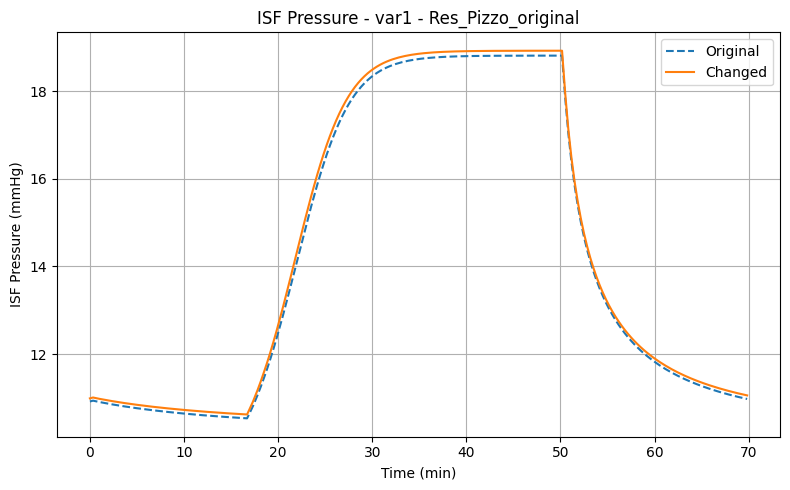

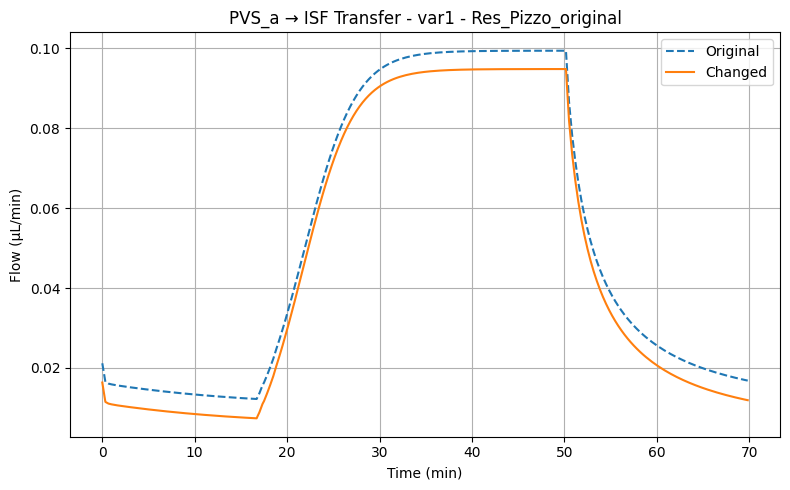

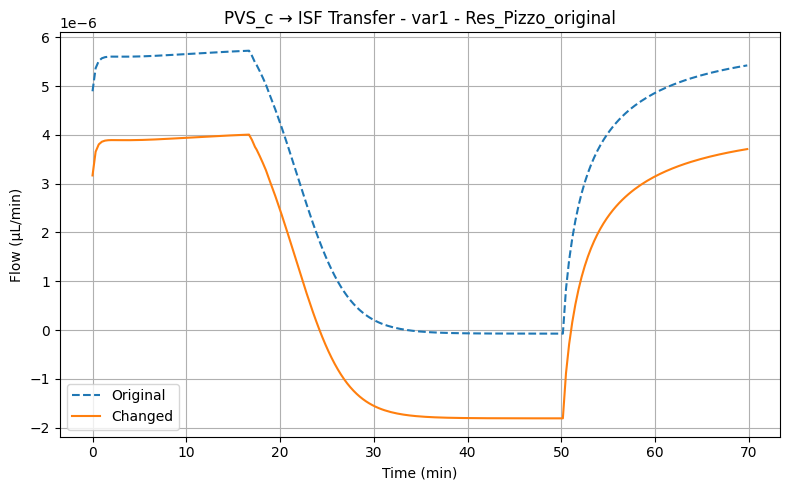

Error reading files:
  /content/drive/MyDrive/227 Final Project/Variation 1 Results/Res_Pizzo_original/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 1 Results/Res_Pizzo/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 1 Results/Res_Pizzo_original/transfer_capillary_ISF.txt not found.


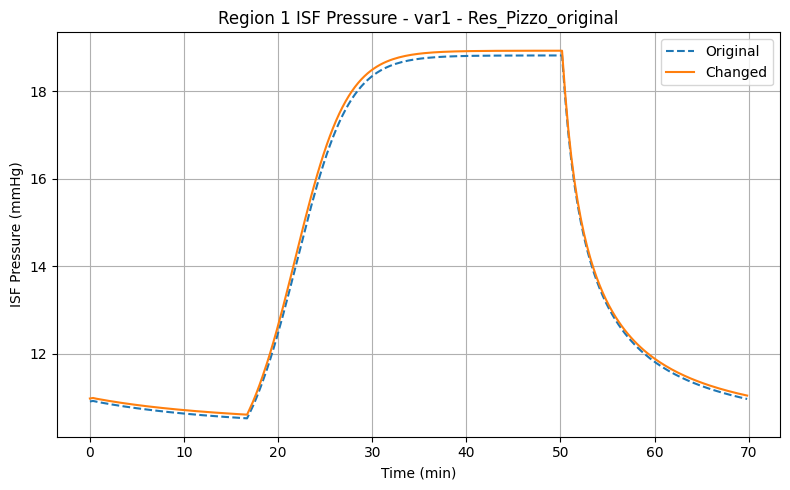

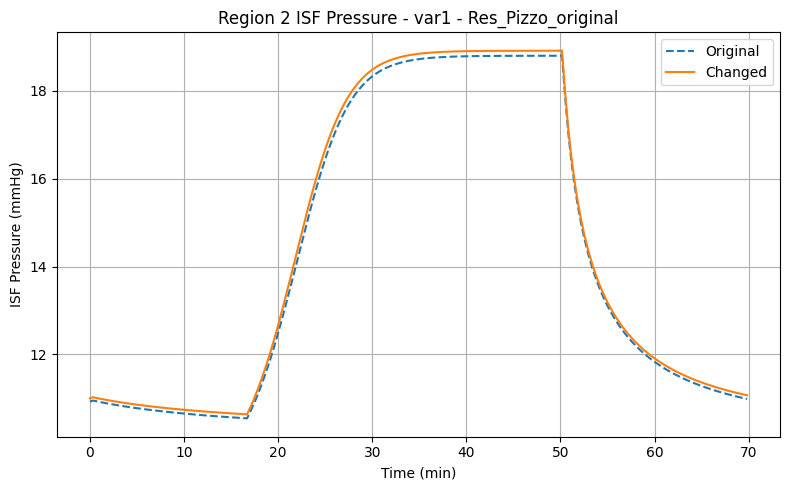

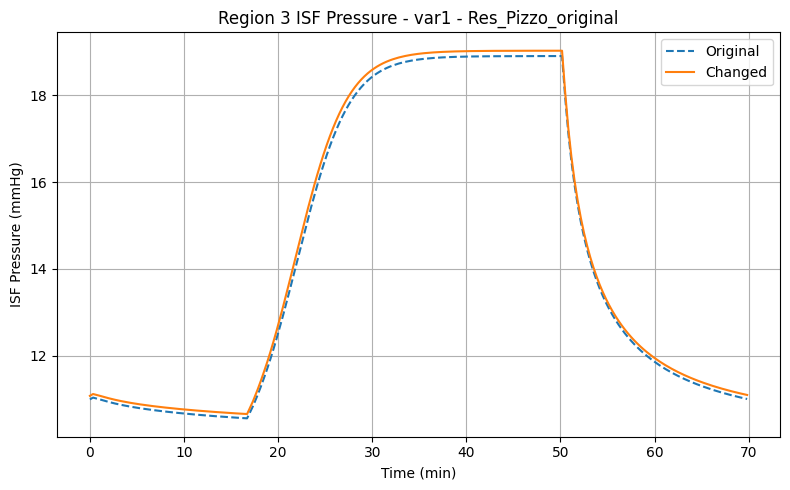


=== VAR2 | high_DS_resistance_original vs high_DS_resistance ===


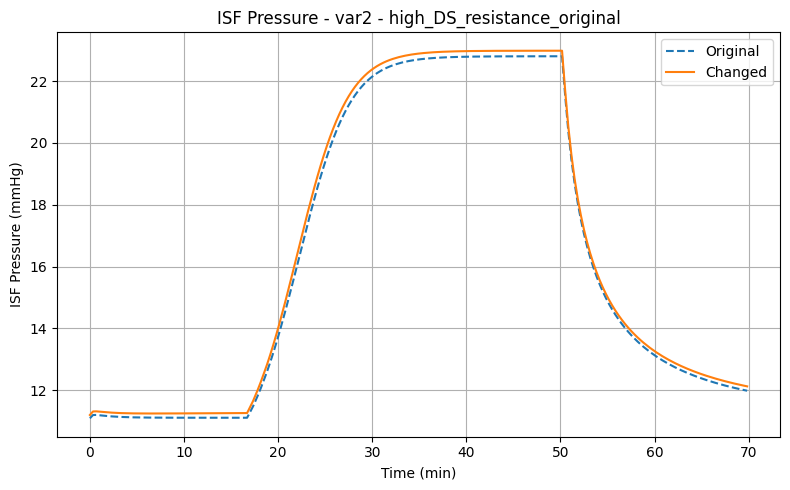

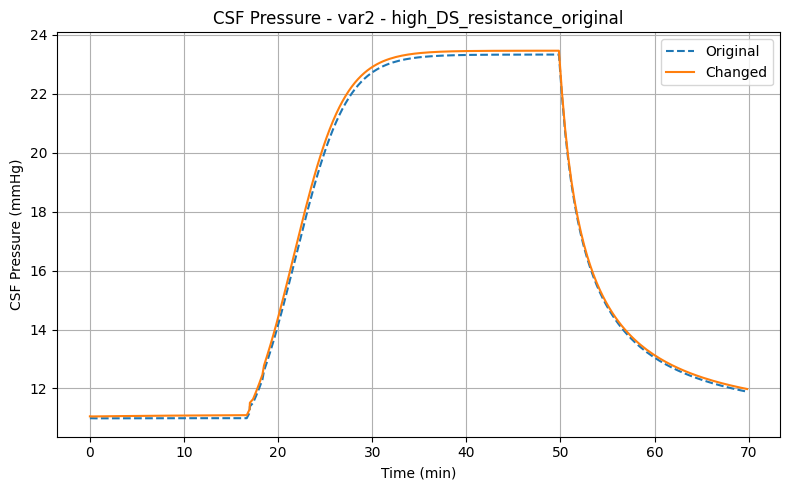

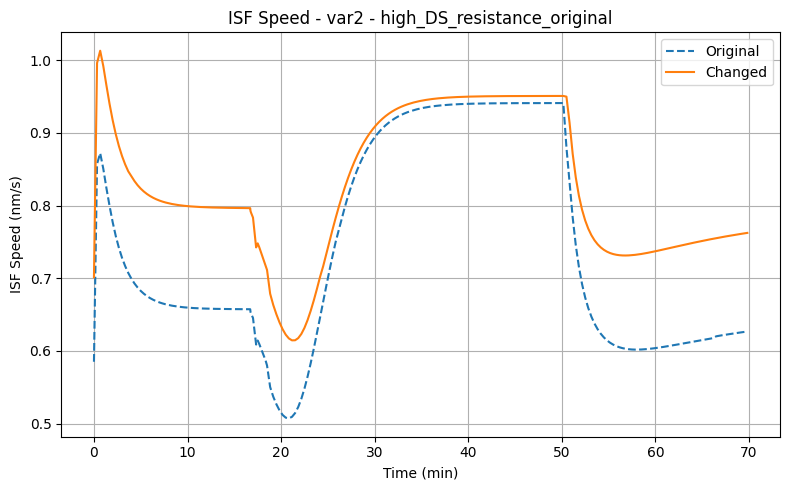

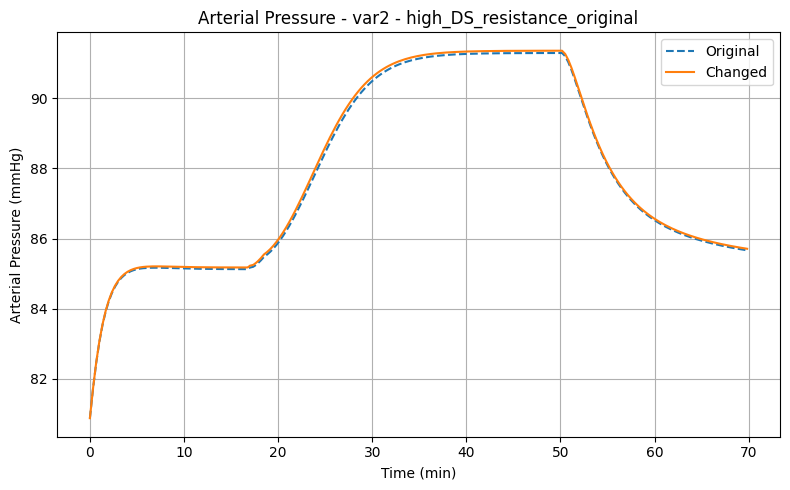

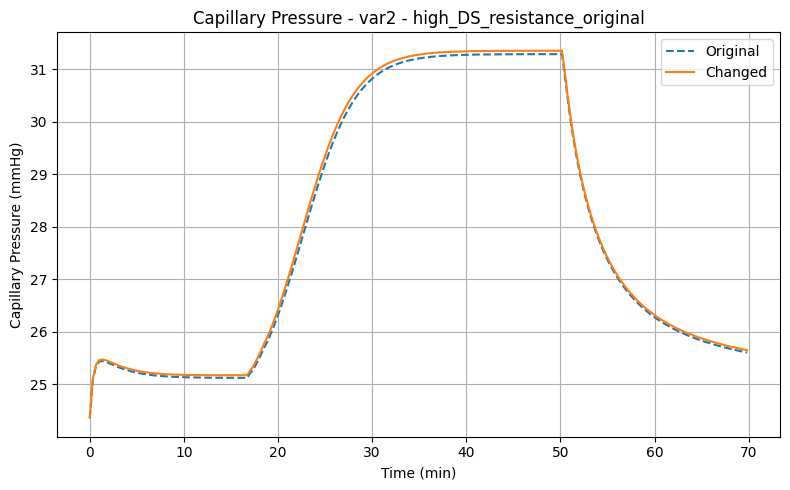

...

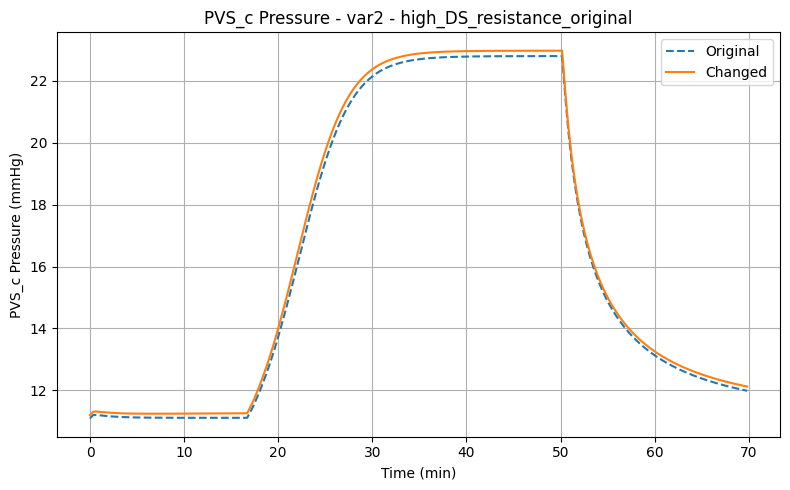

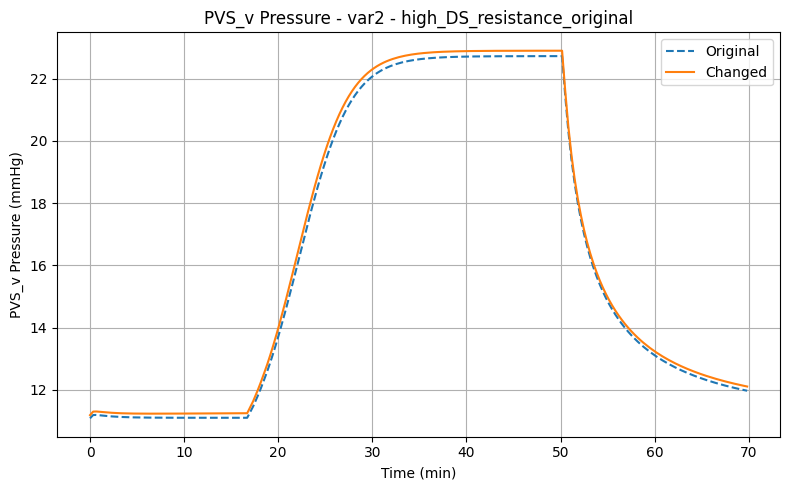

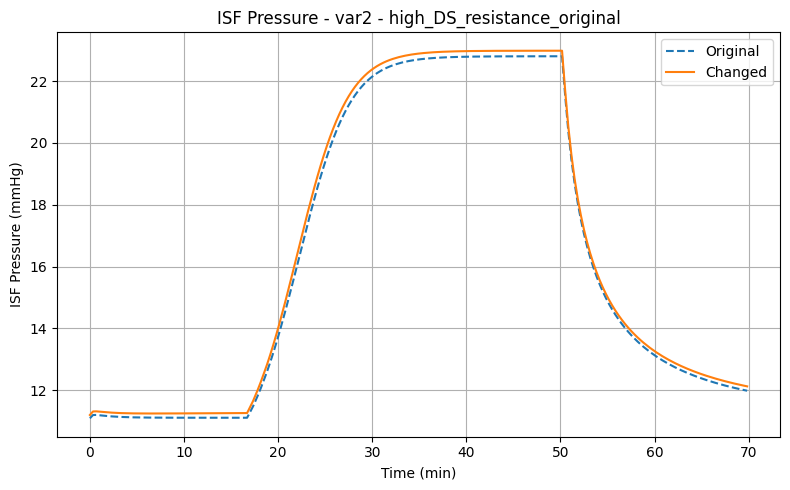

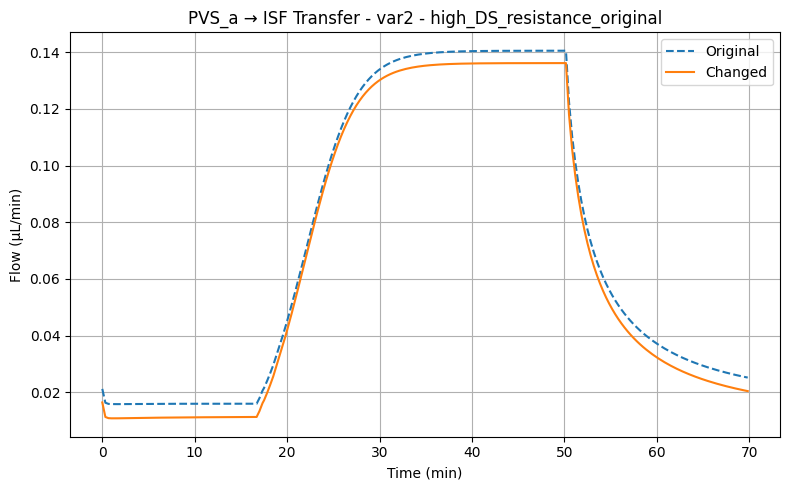

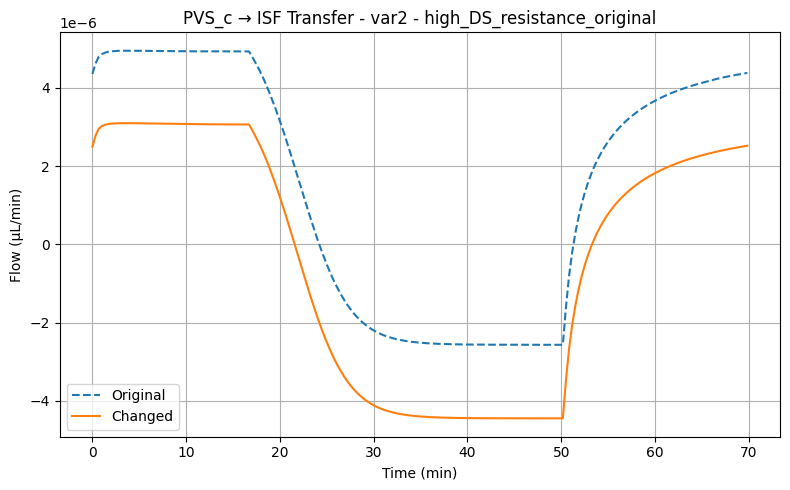

Error reading files:
  /content/drive/MyDrive/227 Final Project/Variation 2 Results/high_DS_resistance_original/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 2 Results/high_DS_resistance/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 2 Results/high_DS_resistance_original/transfer_capillary_ISF.txt not found.


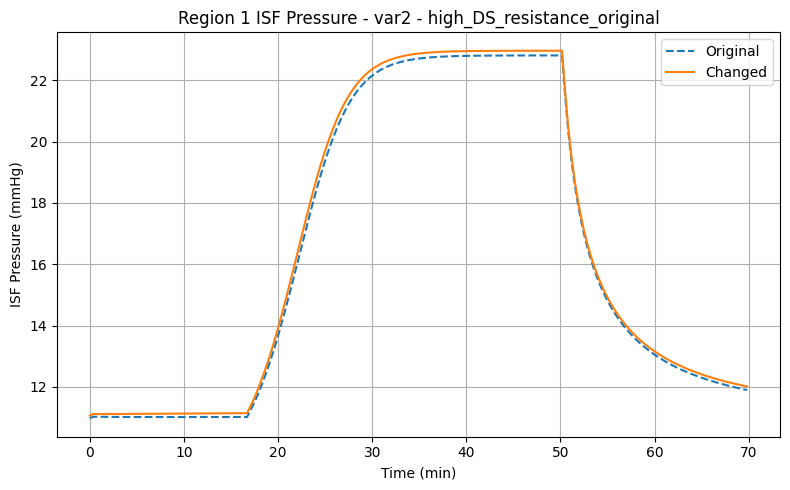

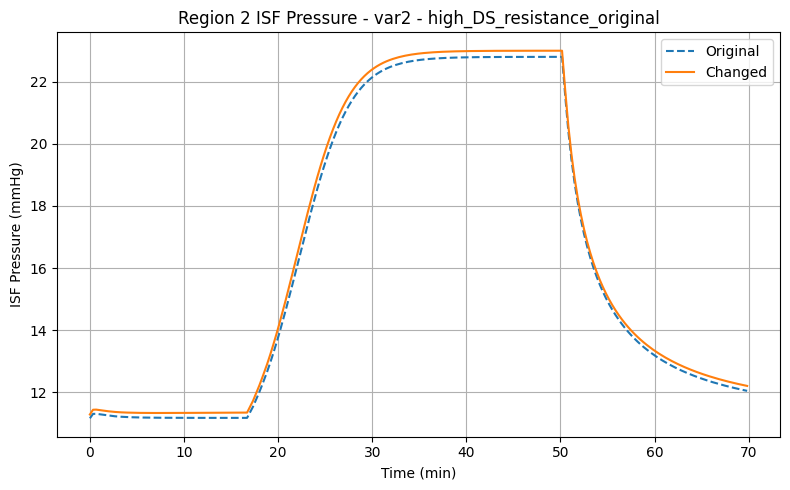

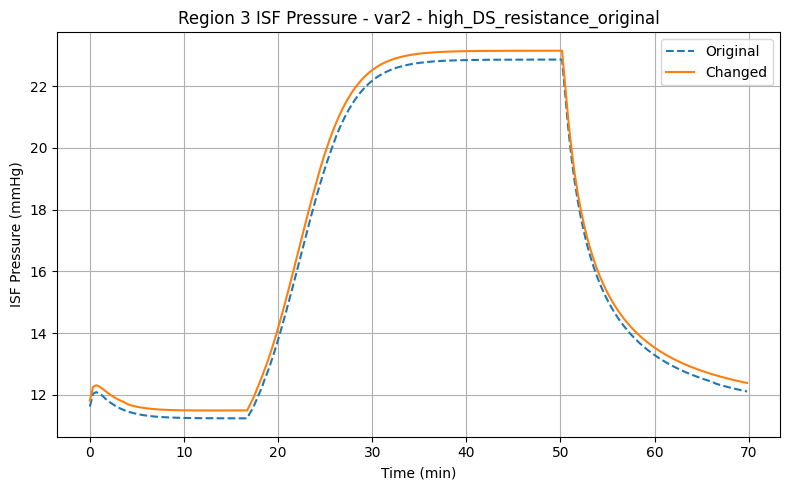


=== VAR2 | low_DS_resistance_original vs low_DS_resistance ===


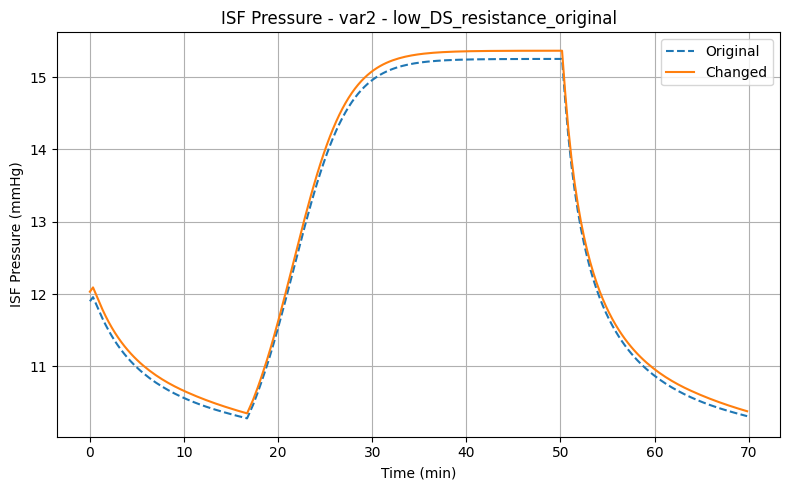

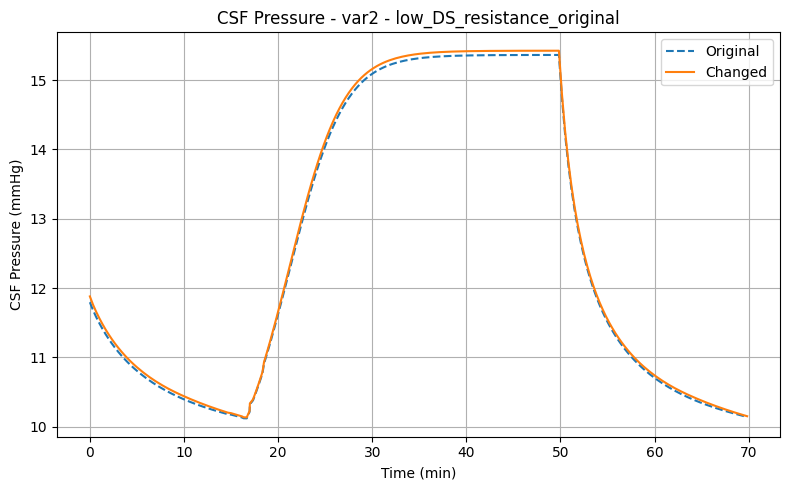

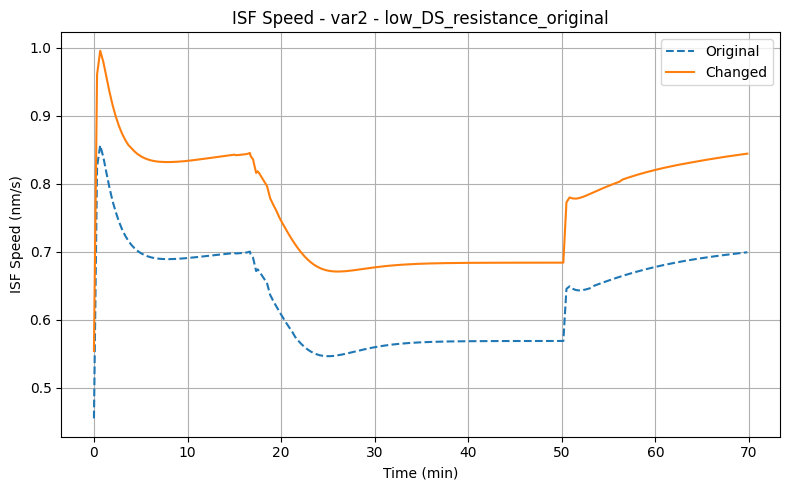

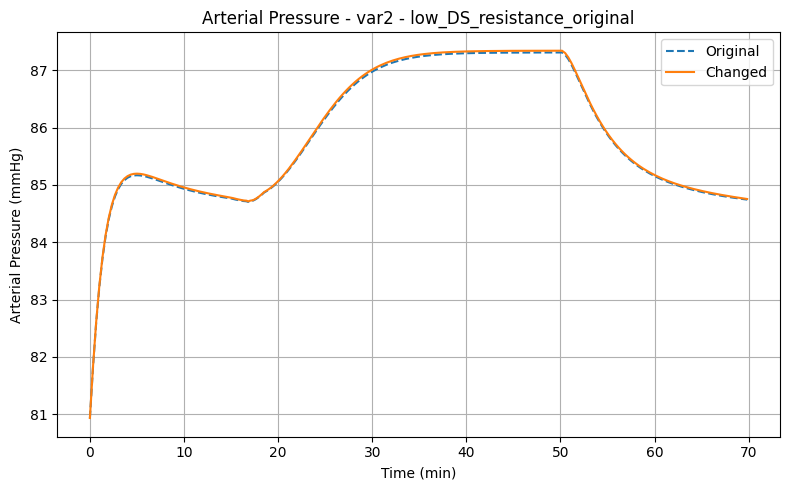

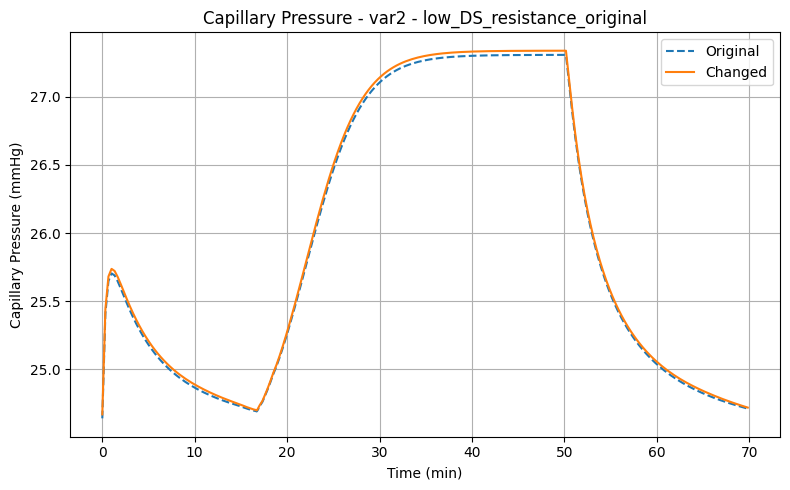

...

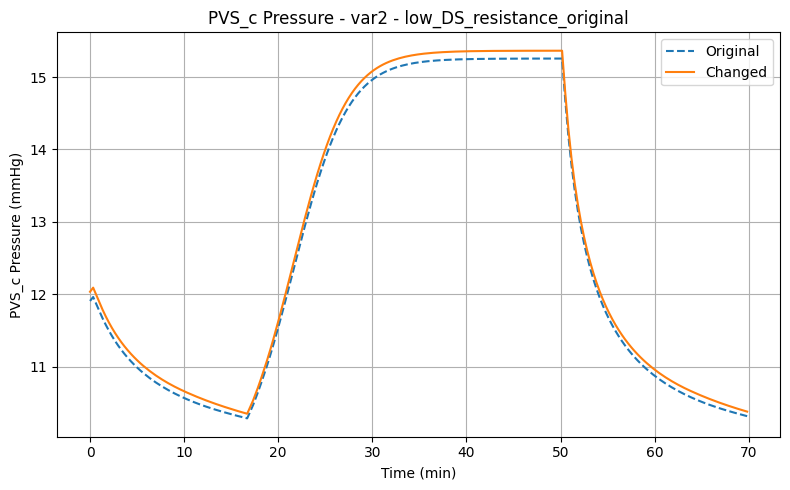

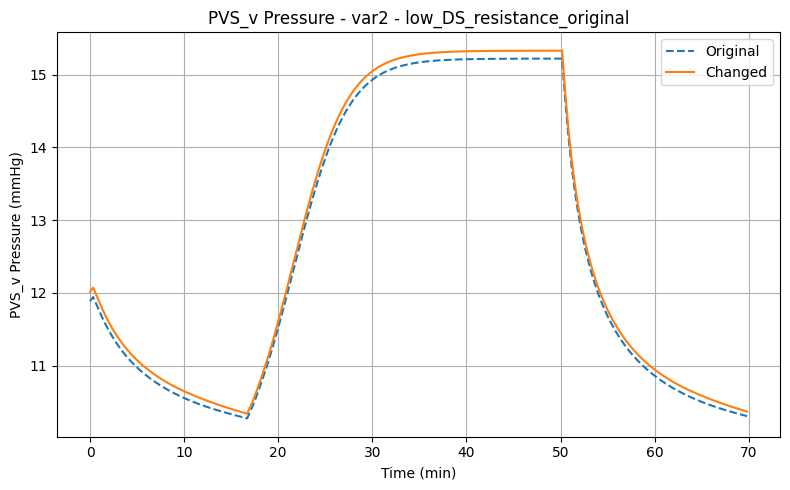

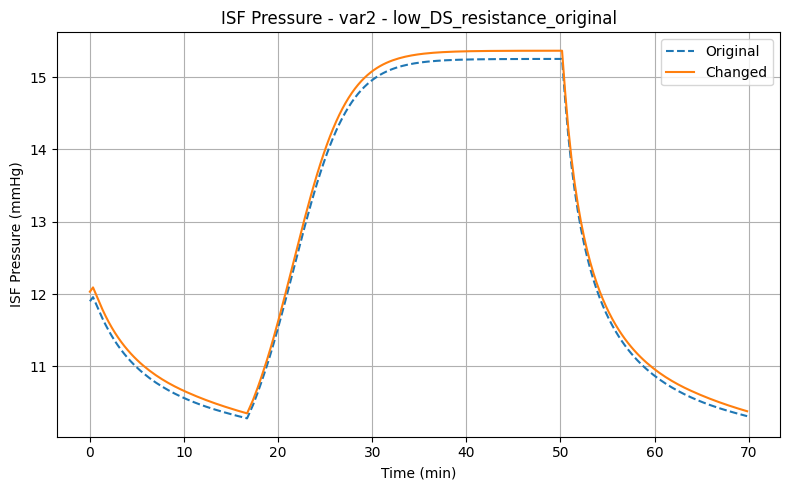

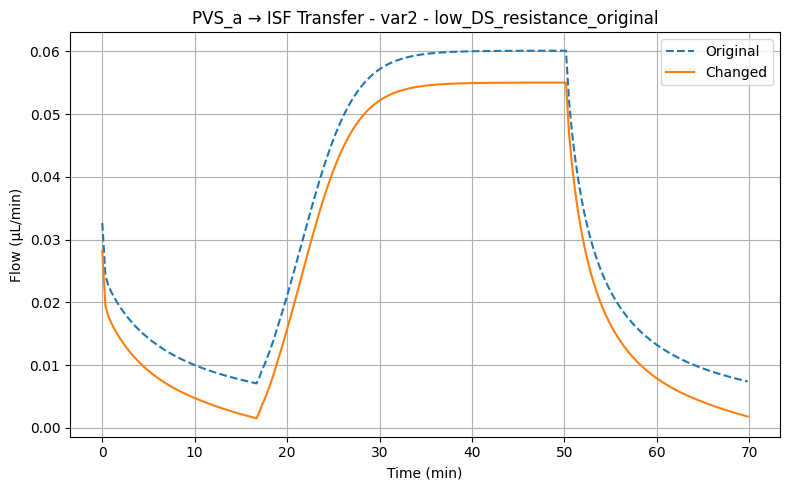

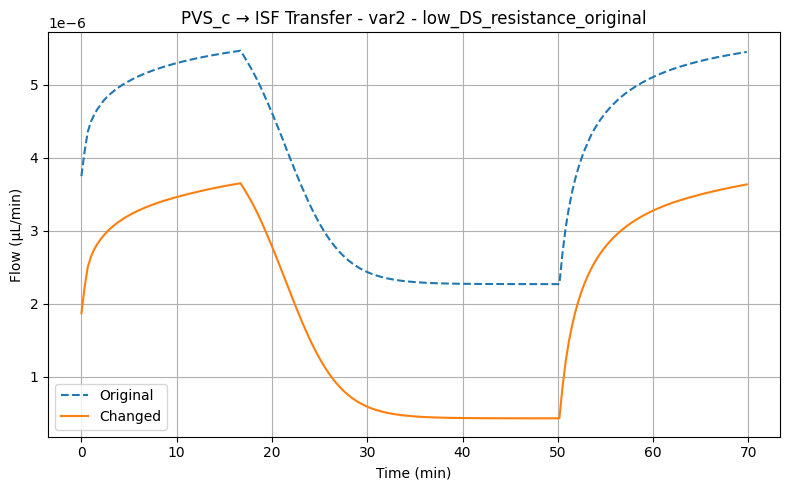

Error reading files:
  /content/drive/MyDrive/227 Final Project/Variation 2 Results/low_DS_resistance_original/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 2 Results/low_DS_resistance/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 2 Results/low_DS_resistance_original/transfer_capillary_ISF.txt not found.


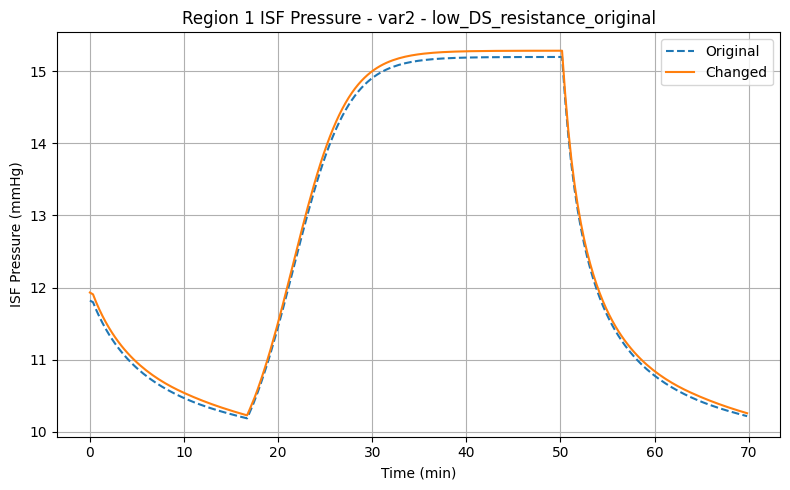

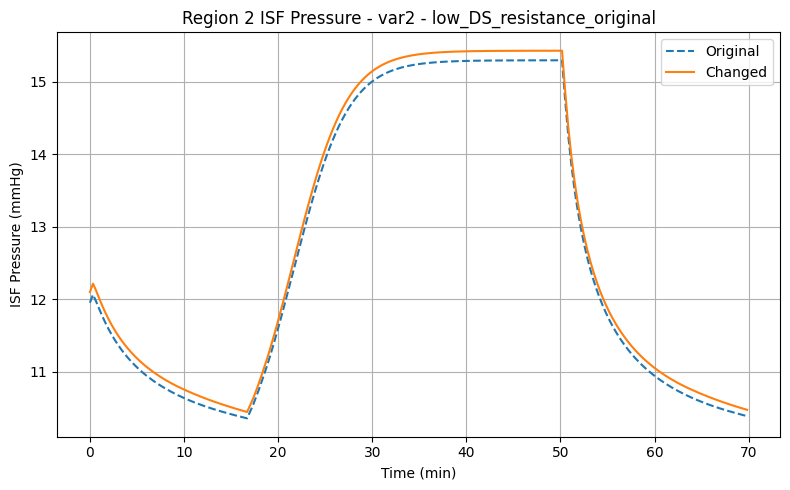

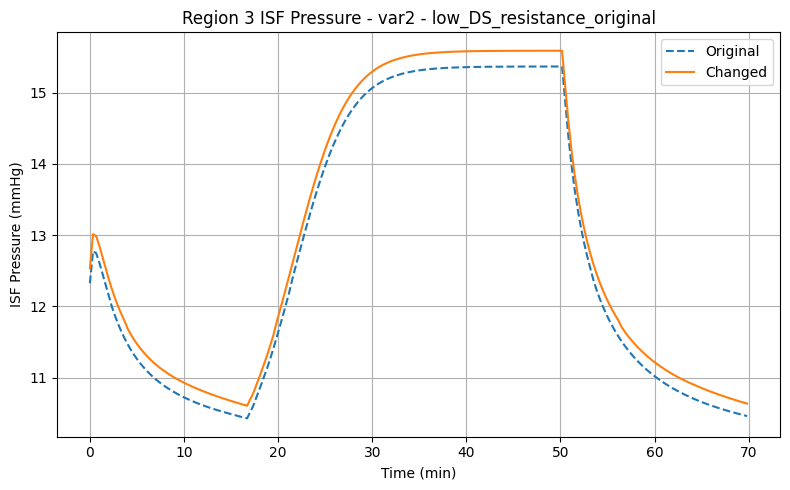


=== VAR3 | constant_filtration_original vs constant_filtration ===


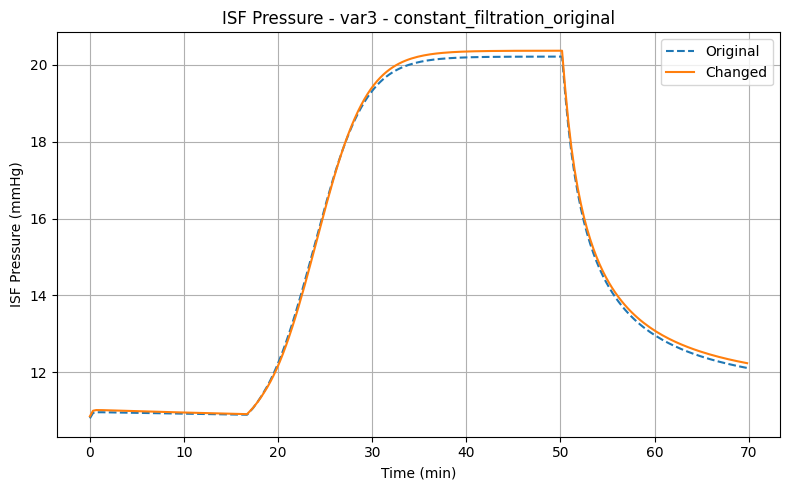

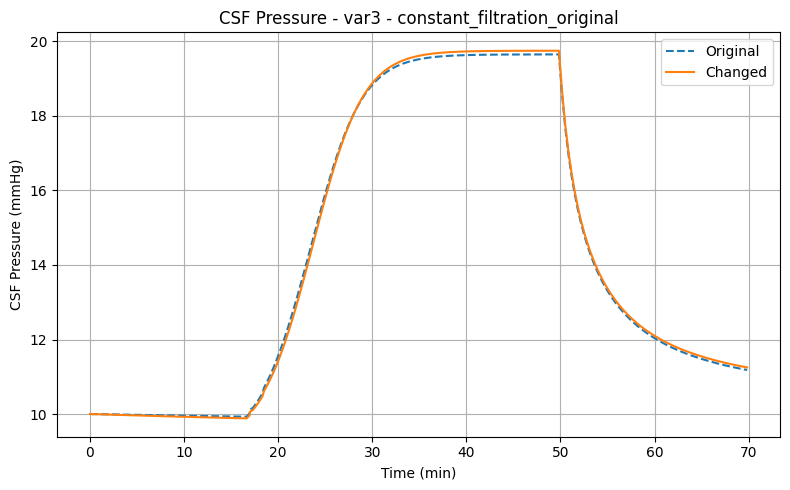

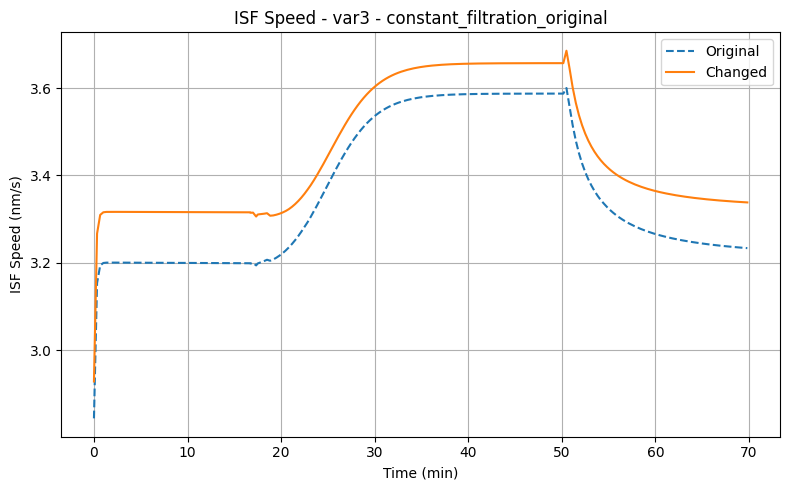

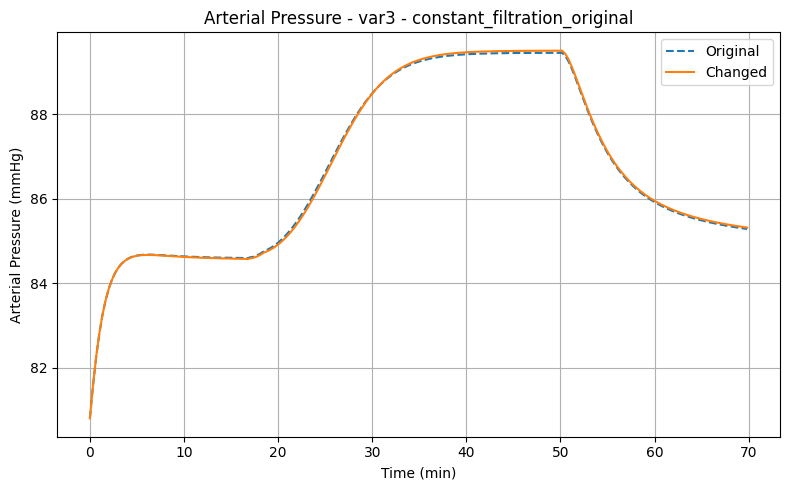

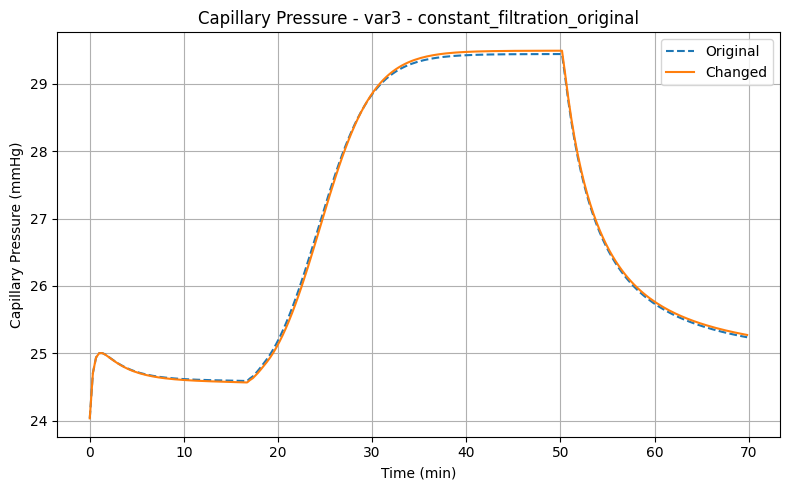

...

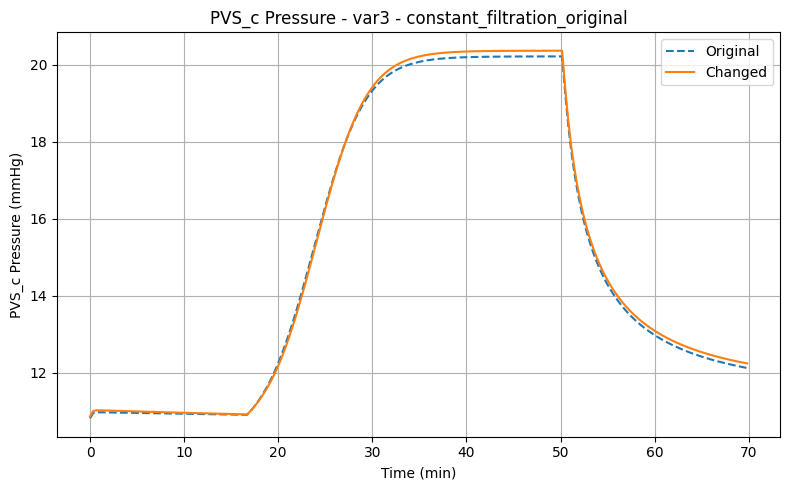

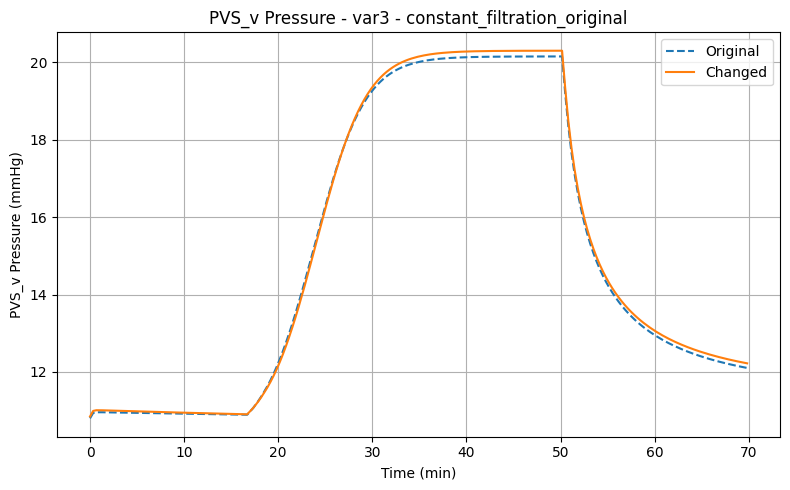

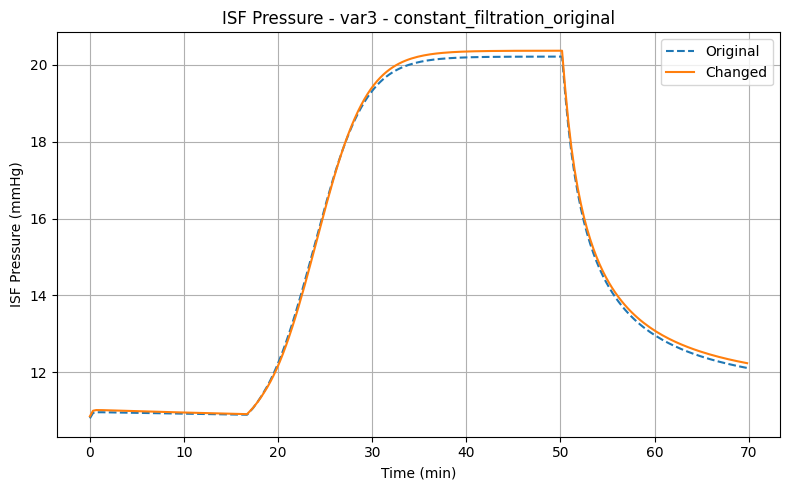

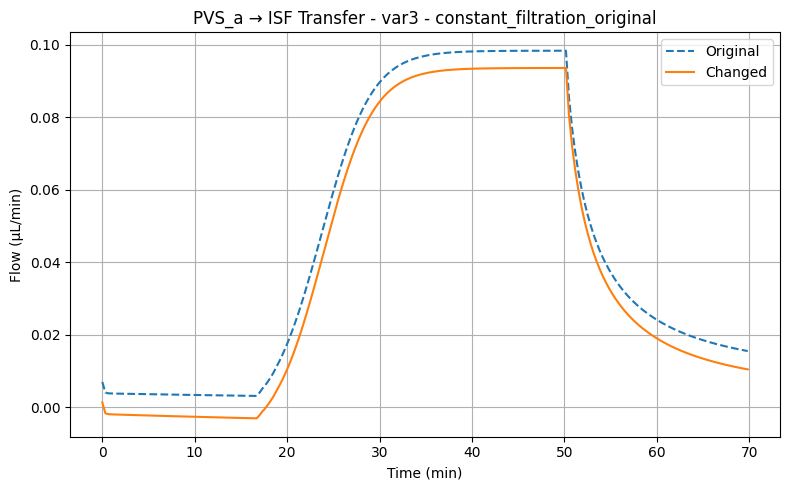

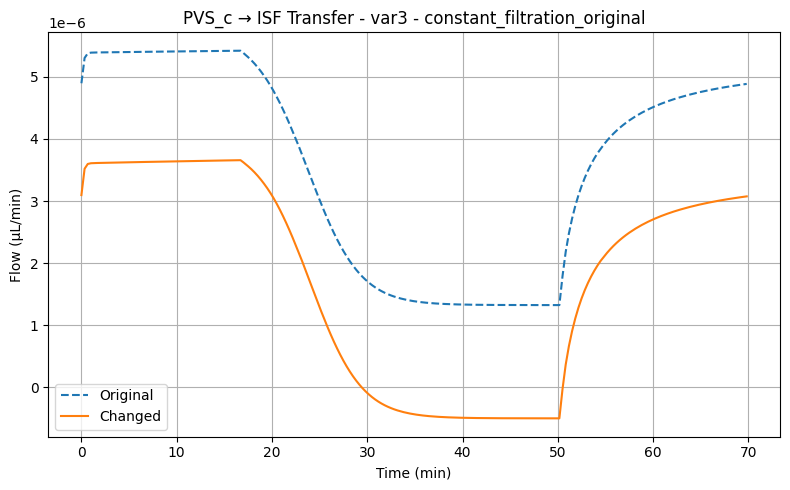

Error reading files:
  /content/drive/MyDrive/227 Final Project/Variation 3 Results/constant_filtration_original/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 3 Results/constant_filtration/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 3 Results/constant_filtration_original/transfer_capillary_ISF.txt not found.


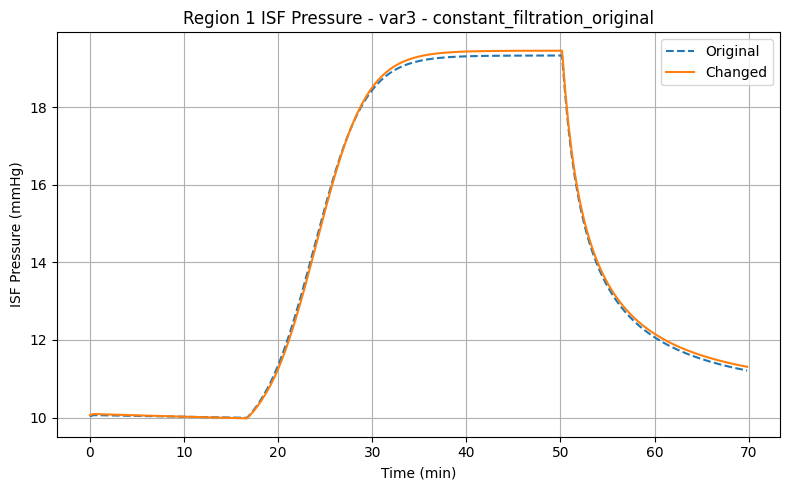

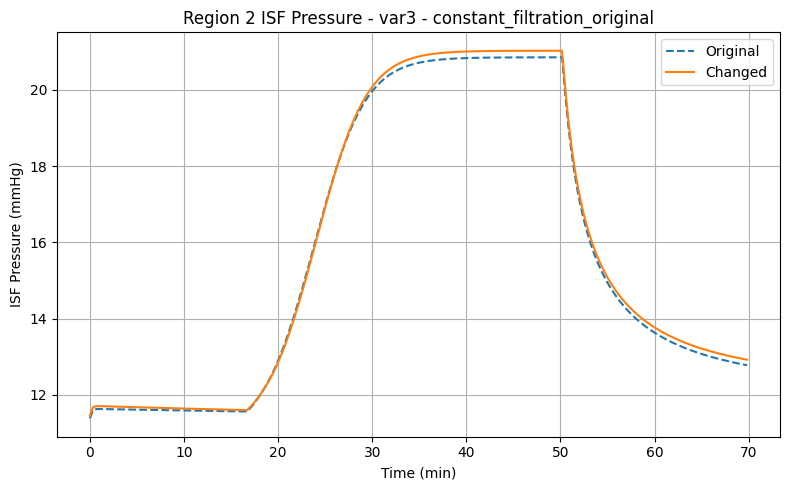

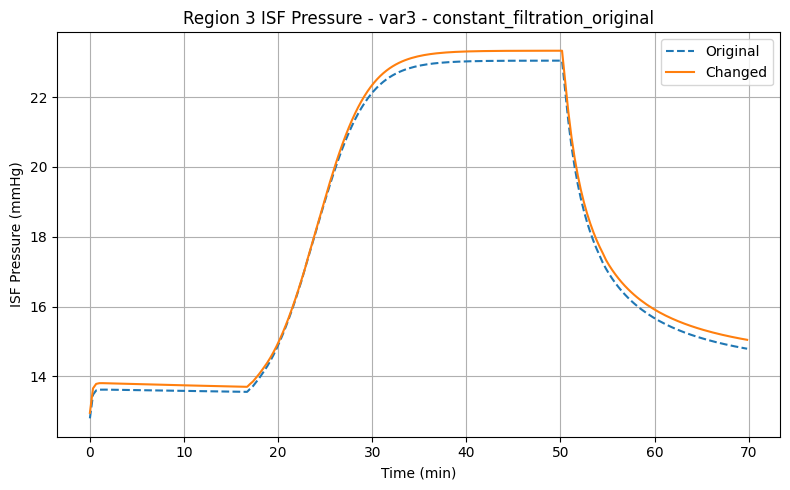


=== VAR3 | nonconstant_filtration_original vs nonconstant_filtration ===


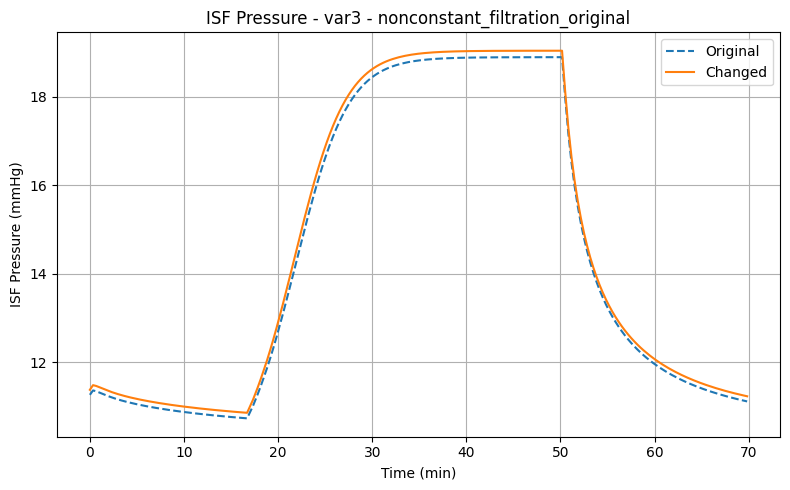

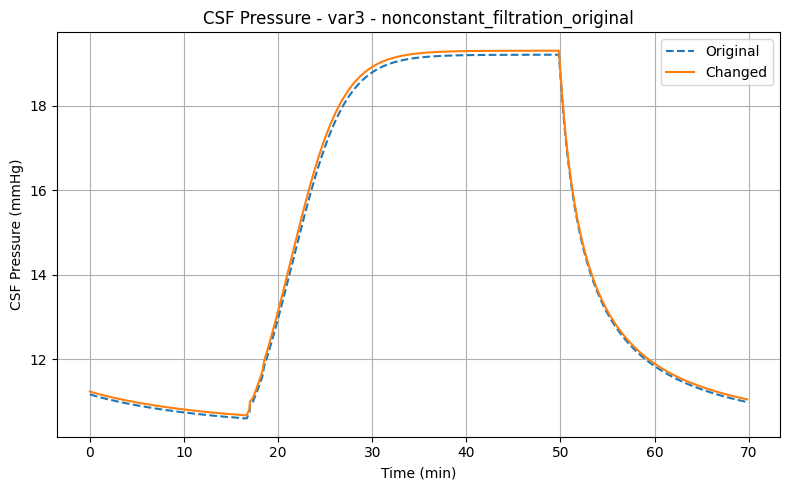

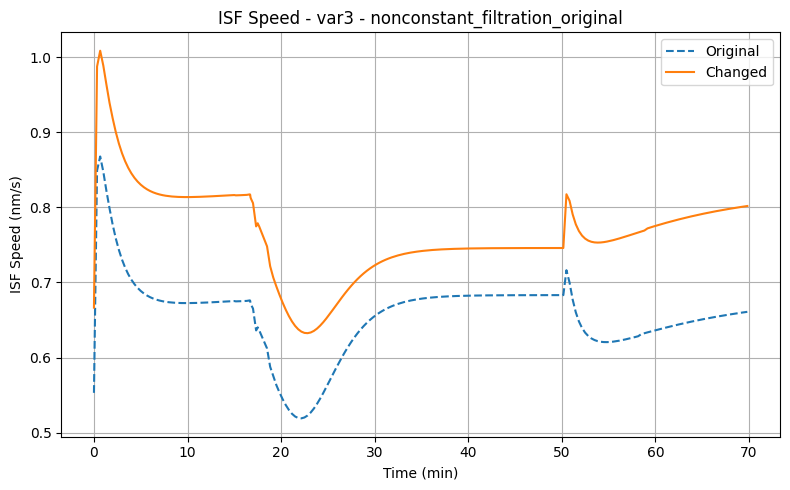

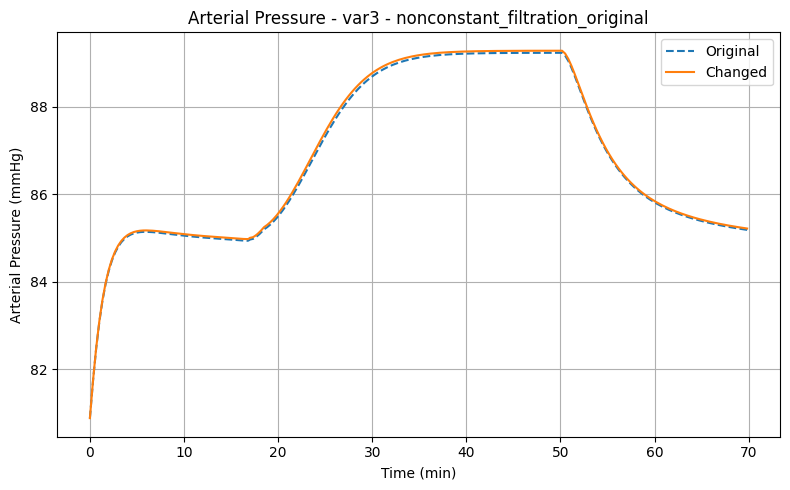

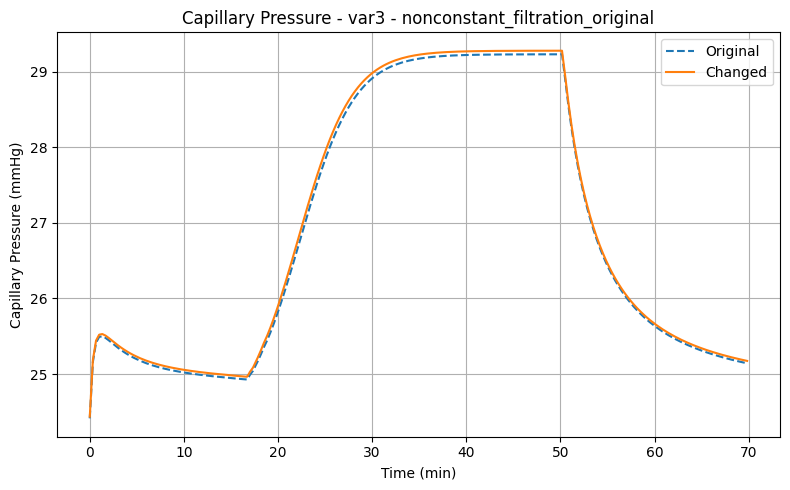

...

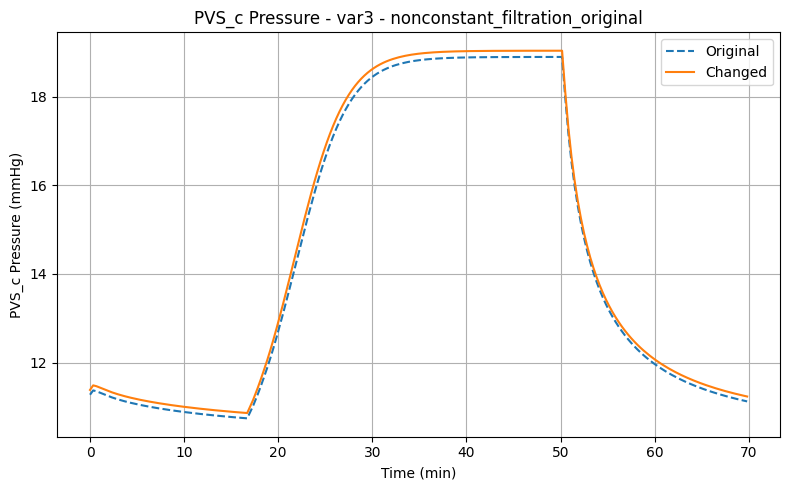

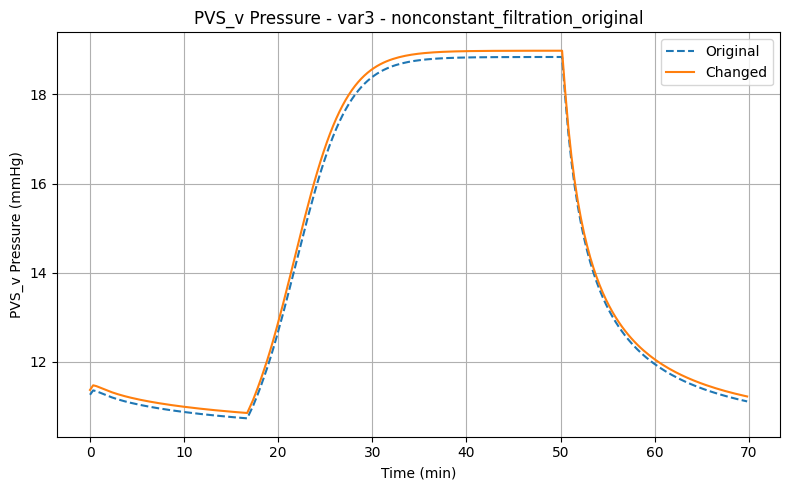

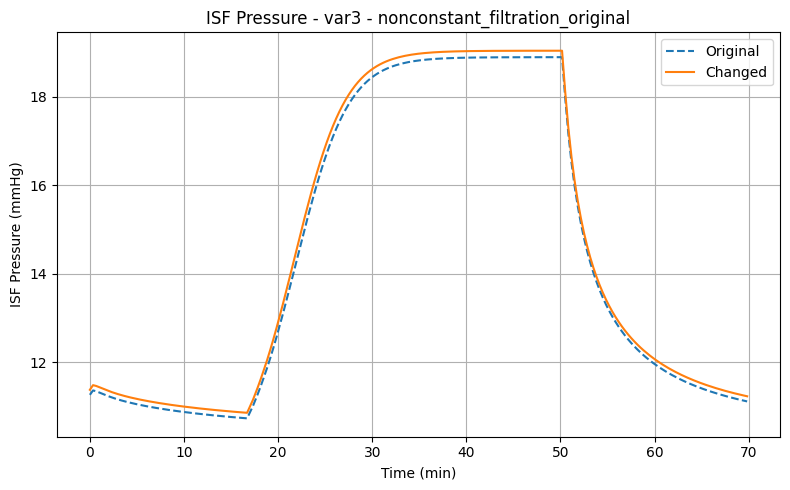

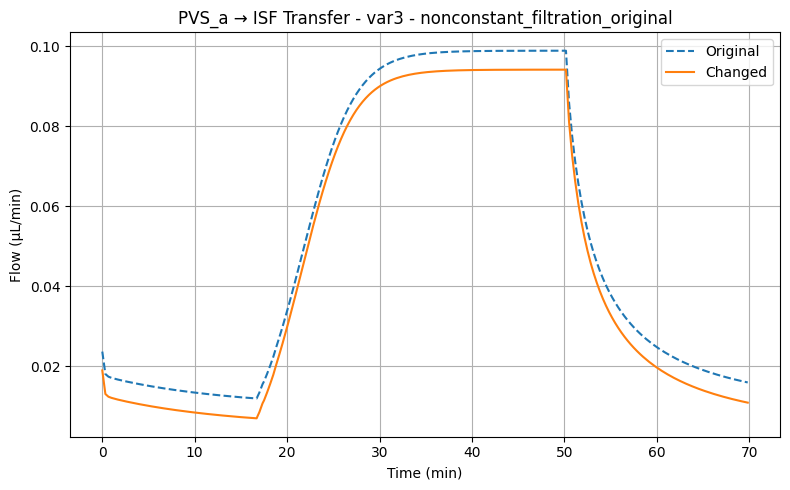

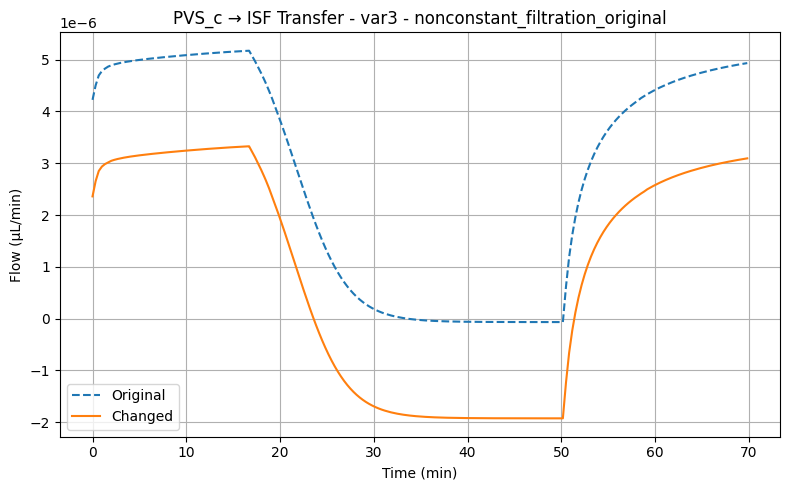

Error reading files:
  /content/drive/MyDrive/227 Final Project/Variation 3 Results/nonconstant_filtration_original/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 3 Results/nonconstant_filtration/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 3 Results/nonconstant_filtration_original/transfer_capillary_ISF.txt not found.


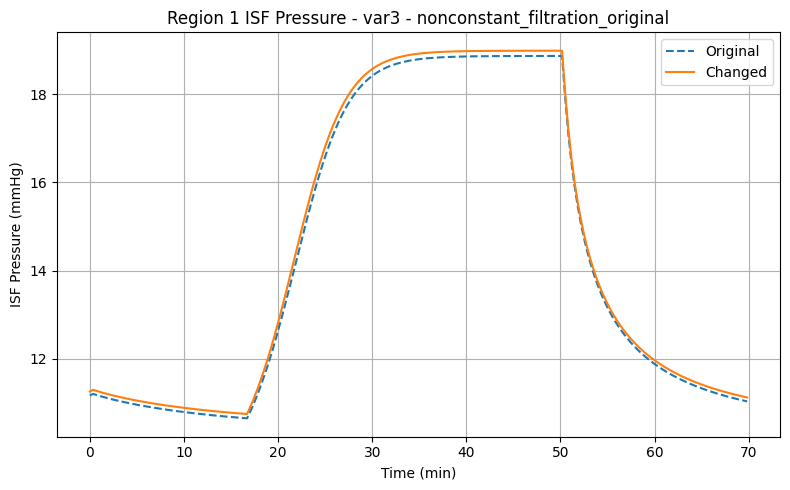

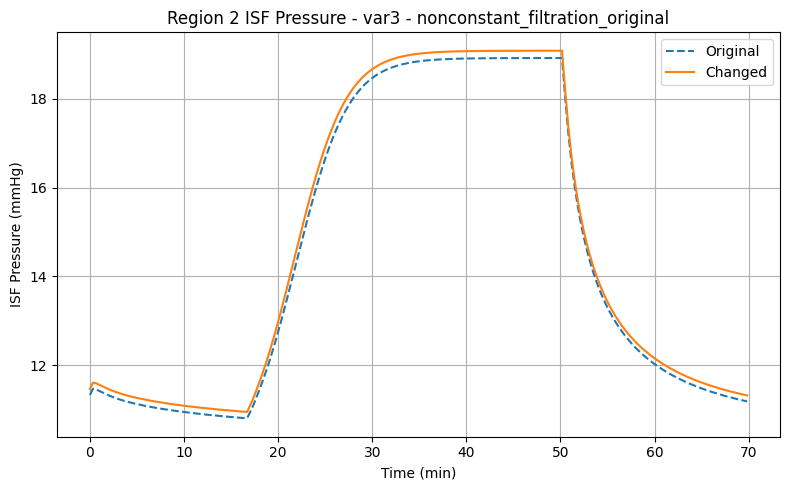

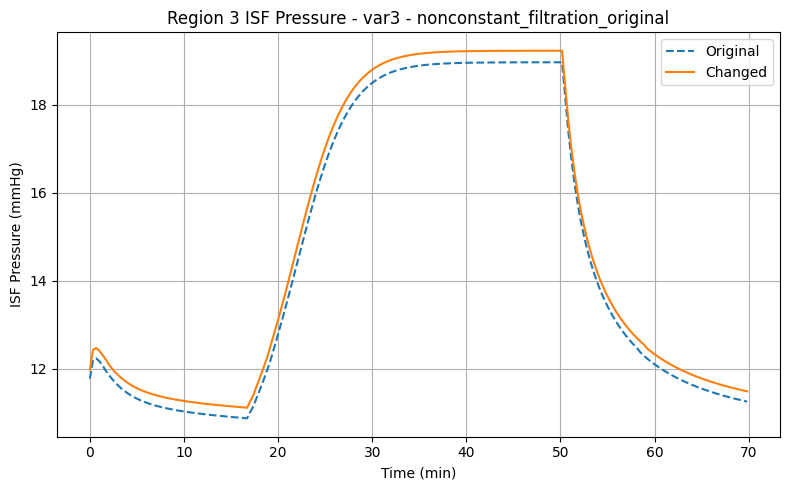


=== VAR4 | base4_original vs base ===


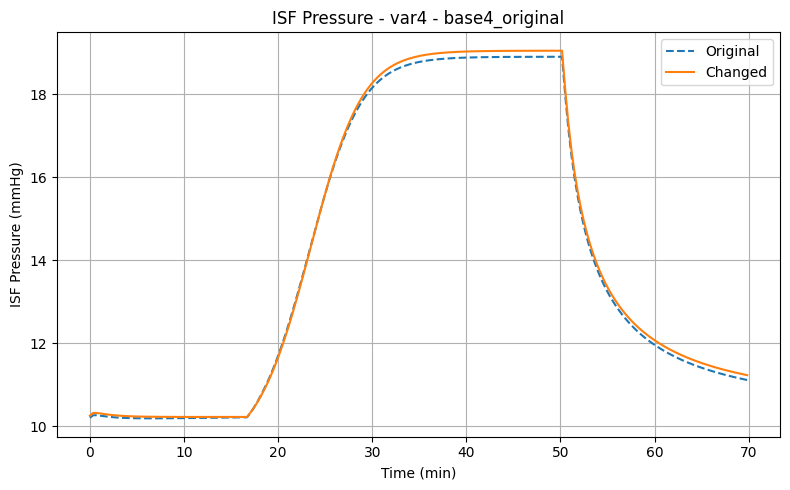

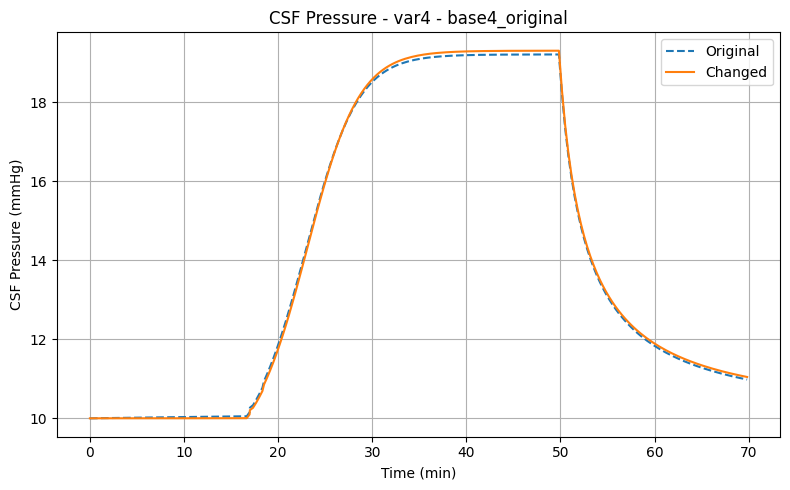

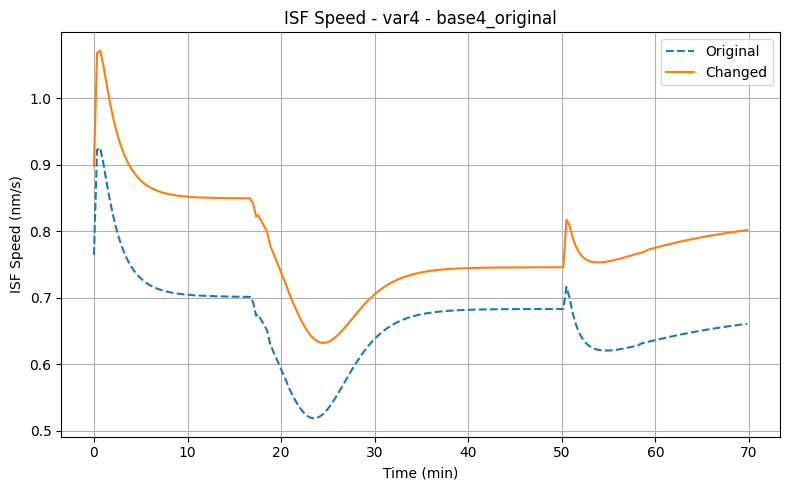

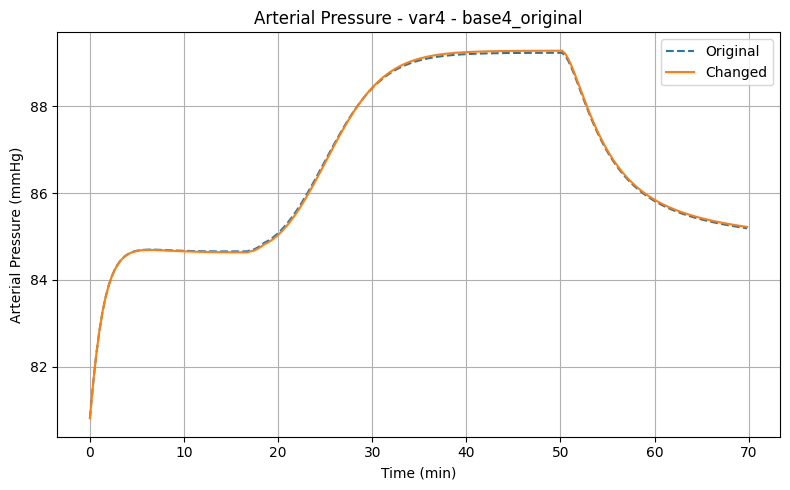

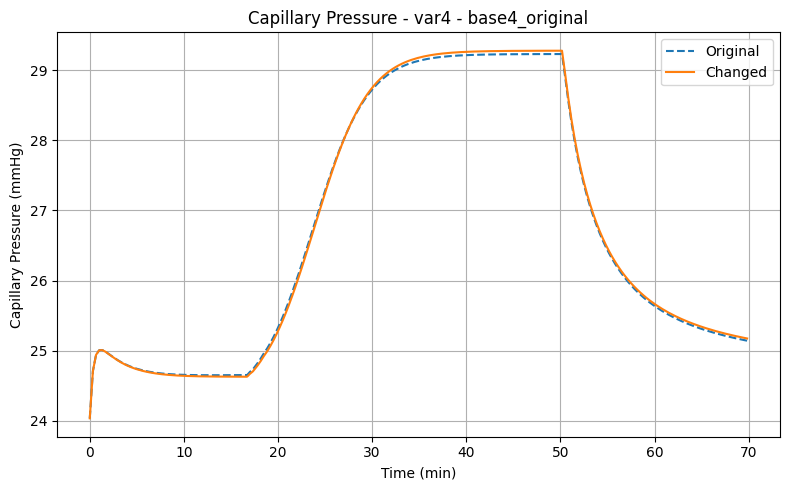

...

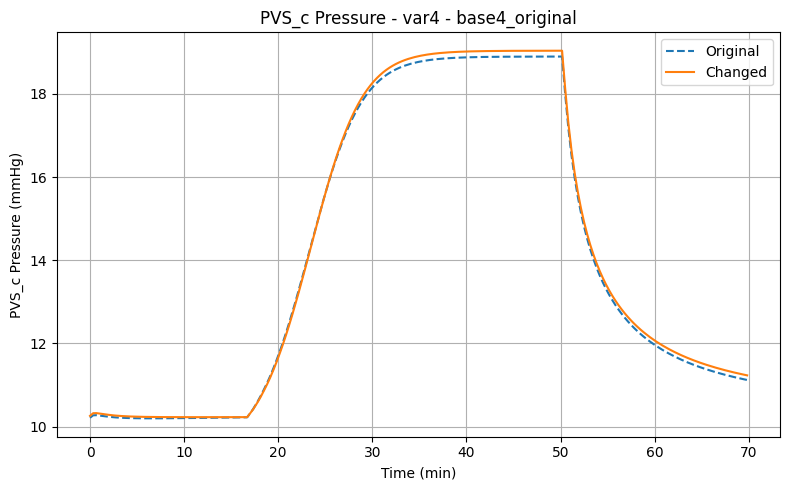

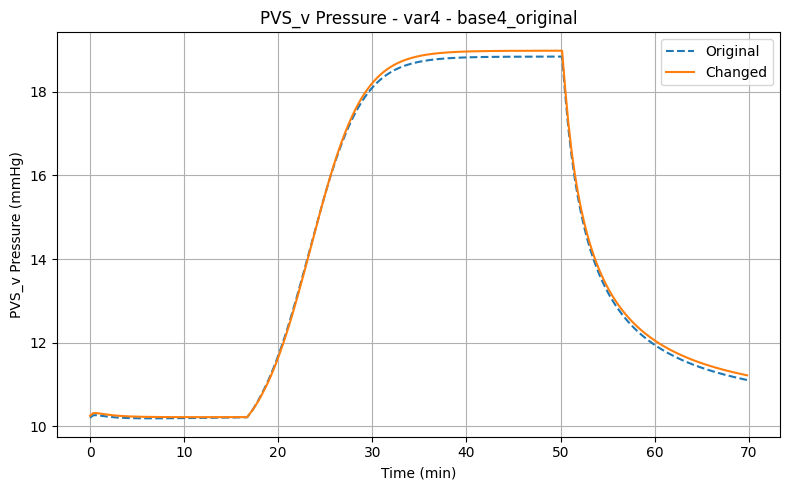

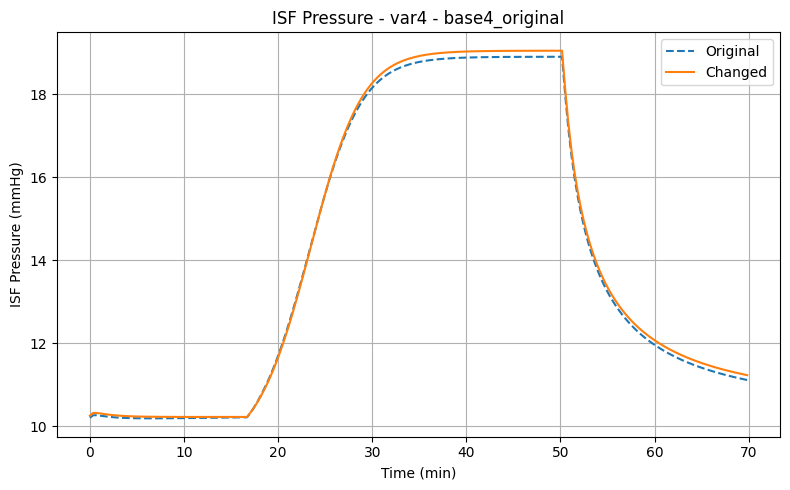

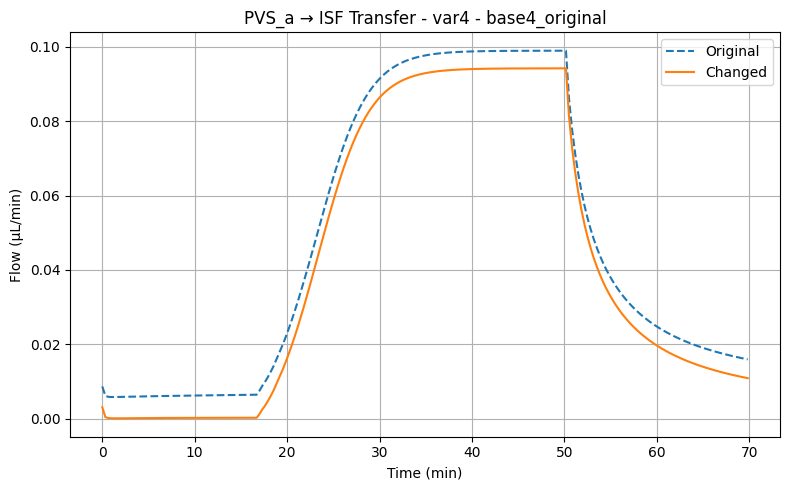

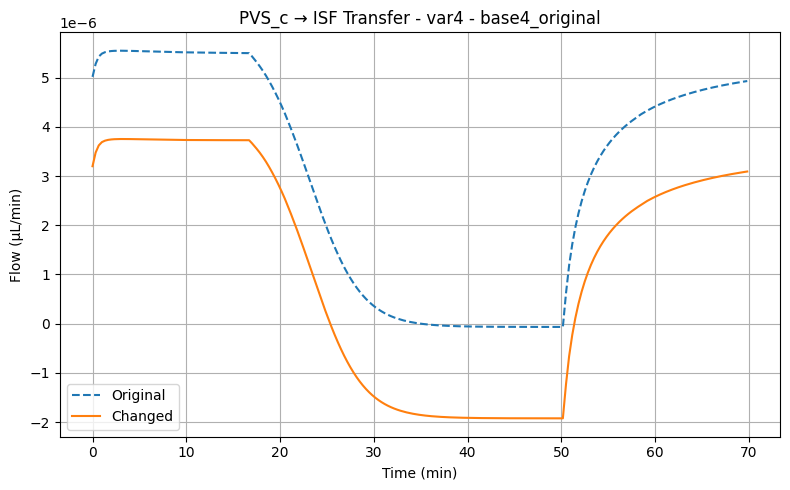

Error reading files:
  /content/drive/MyDrive/227 Final Project/Variation 4 Results/base4_original/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 4 Results/base/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 4 Results/base4_original/transfer_capillary_ISF.txt not found.


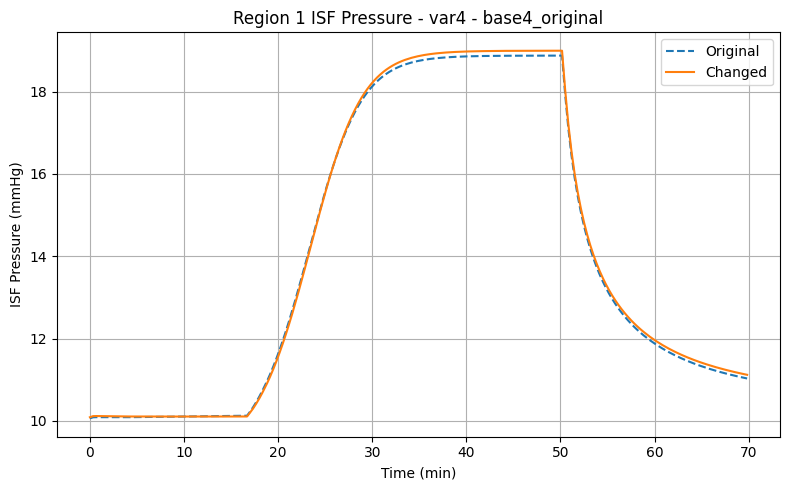

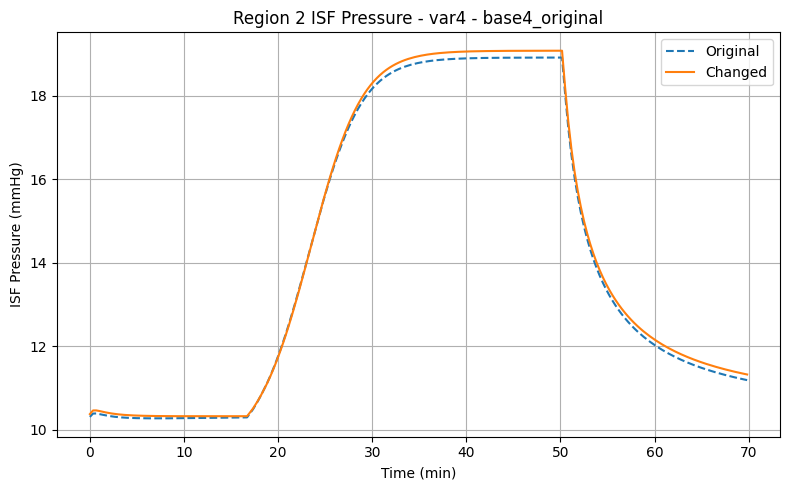

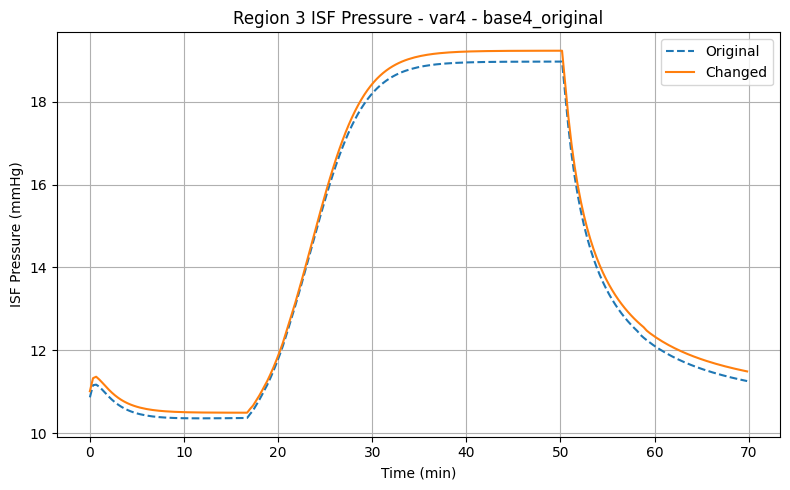


=== VAR4 | transfer_case1original vs transfer_case1 ===


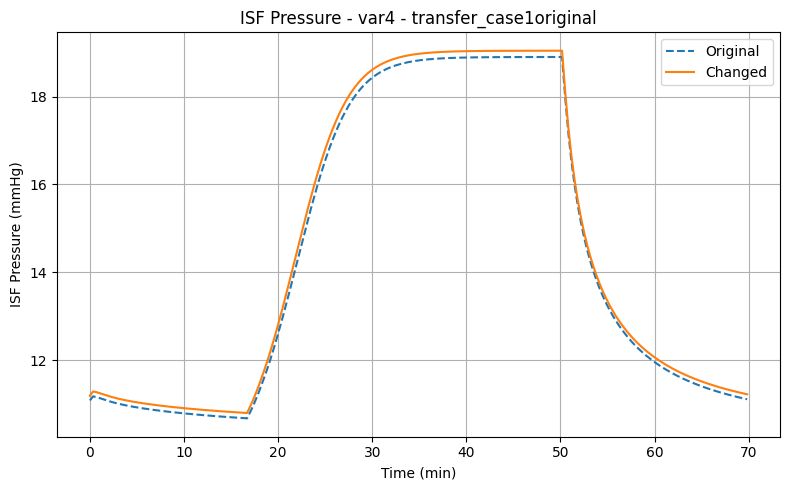

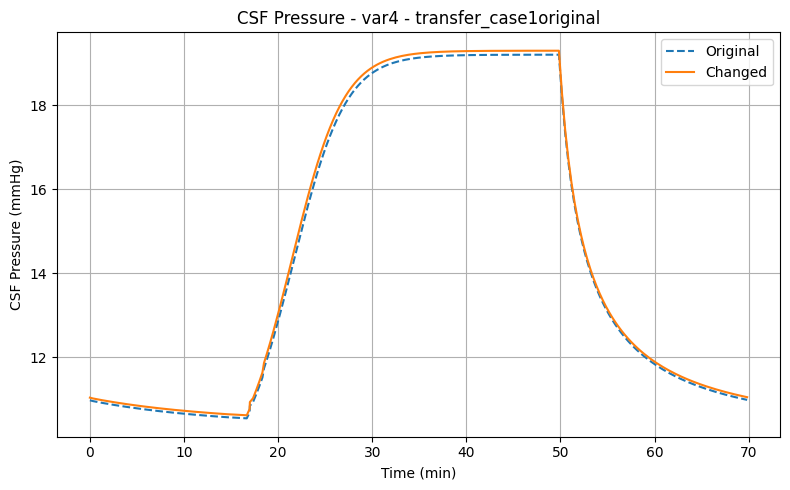

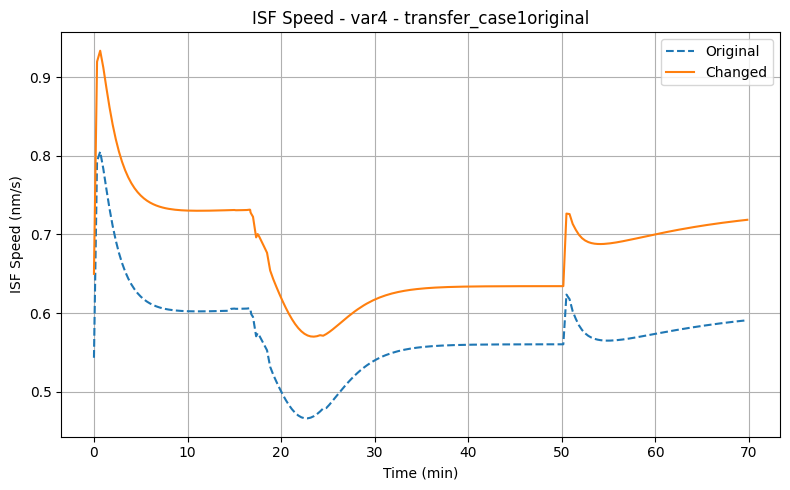

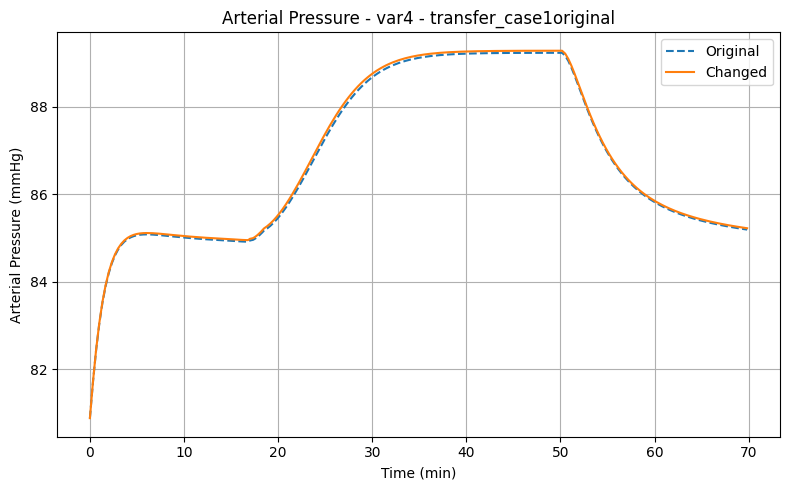

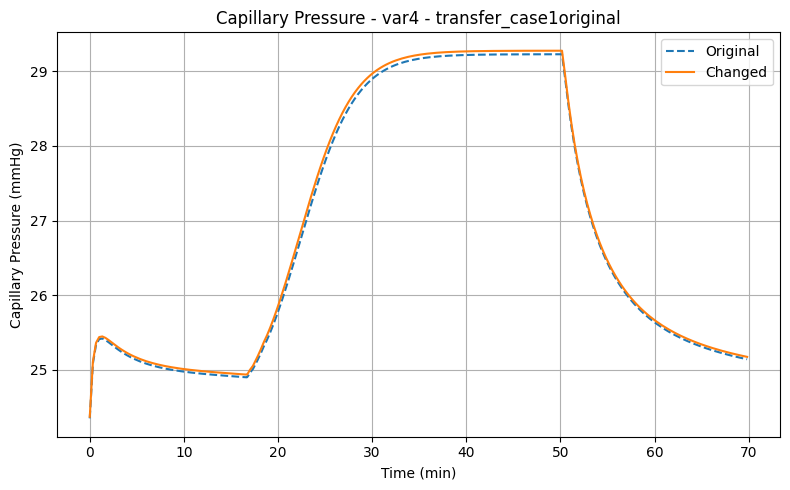

...

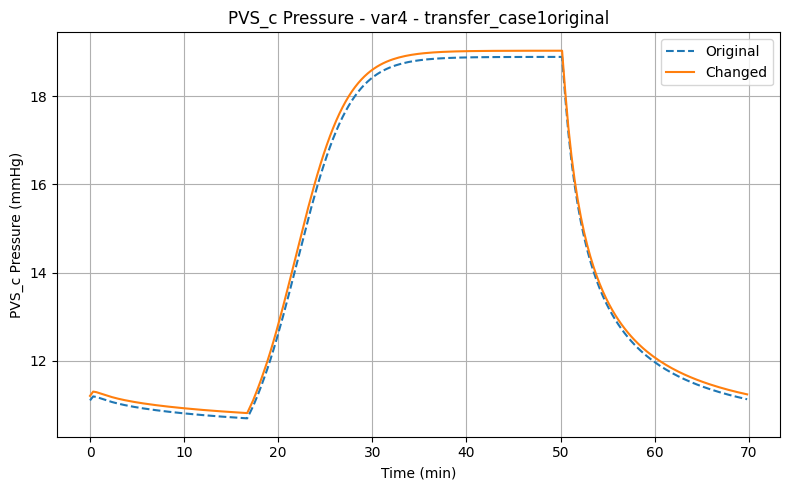

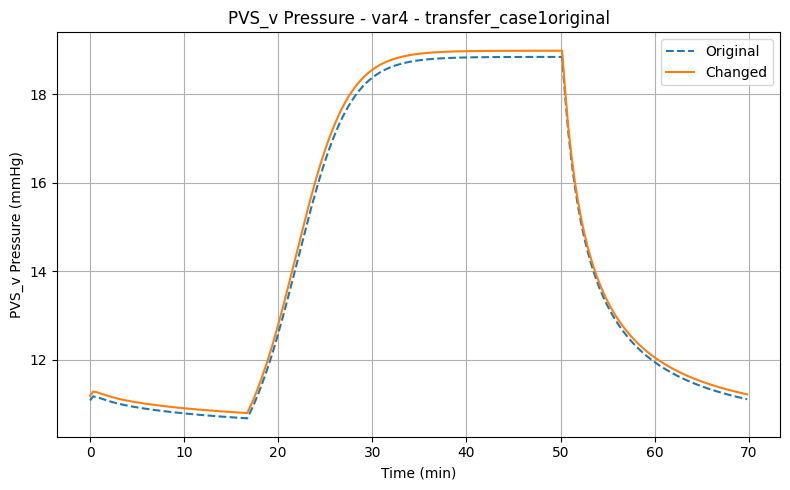

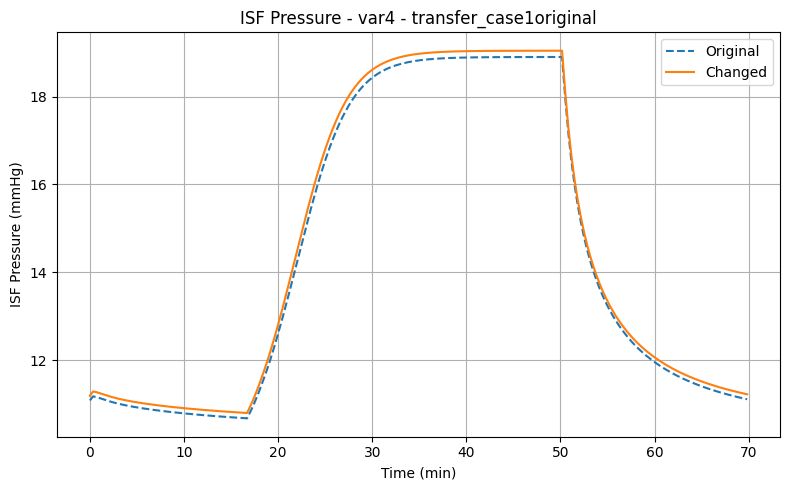

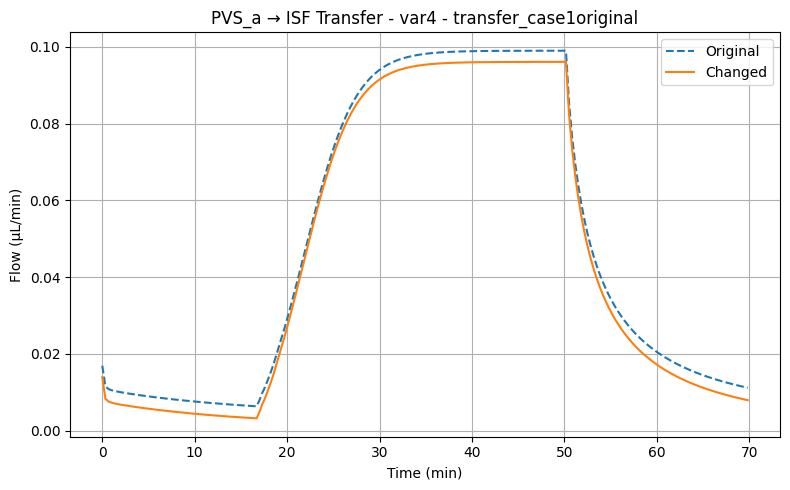

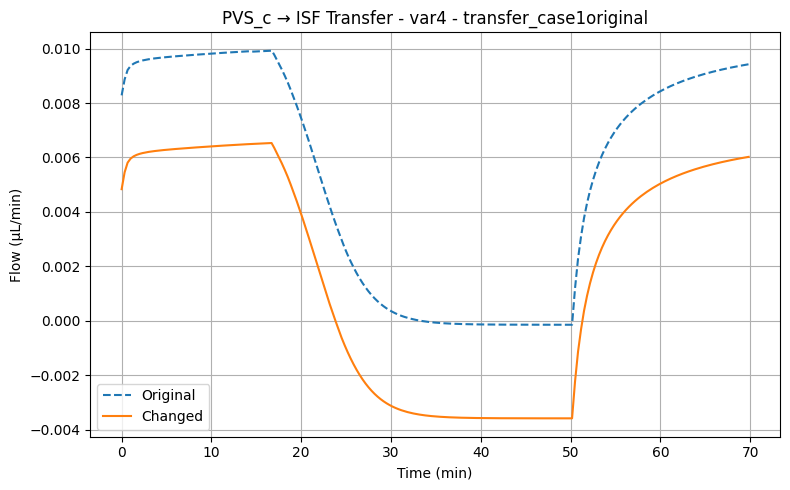

Error reading files:
  /content/drive/MyDrive/227 Final Project/Variation 4 Results/transfer_case1original/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 4 Results/transfer_case1/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 4 Results/transfer_case1original/transfer_capillary_ISF.txt not found.


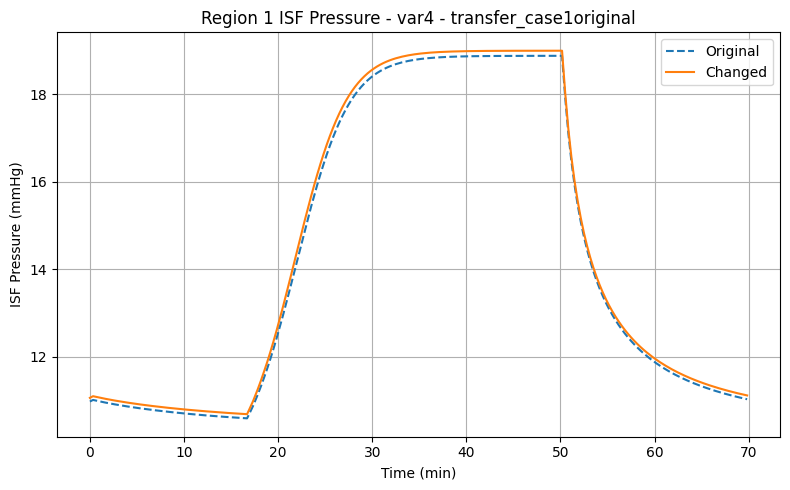

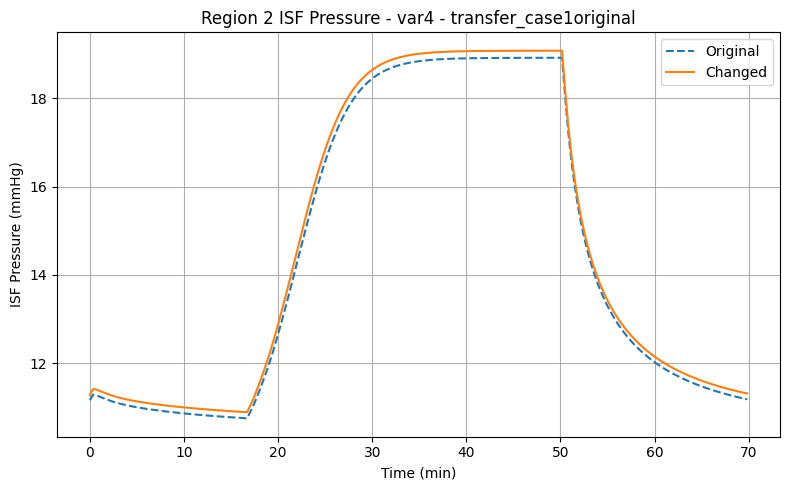

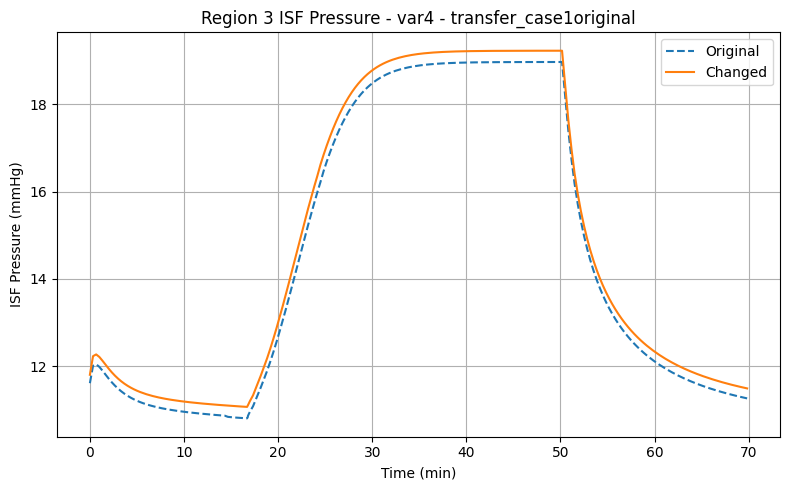


=== VAR4 | transfer_case2original vs transfer_case2 ===


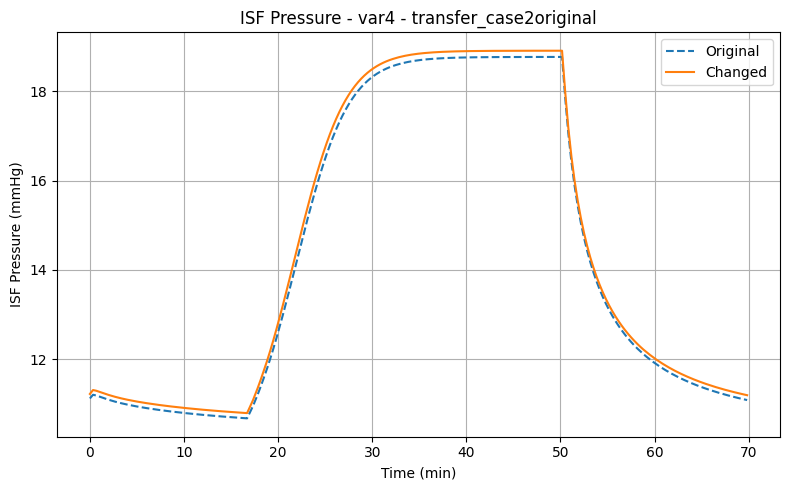

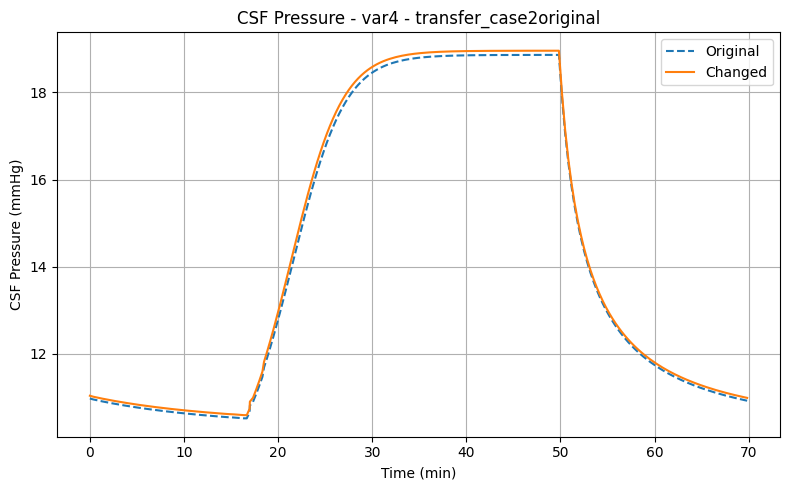

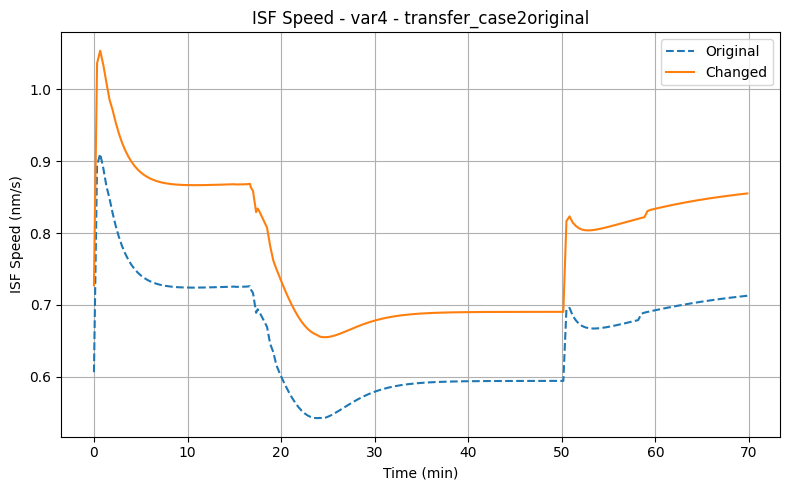

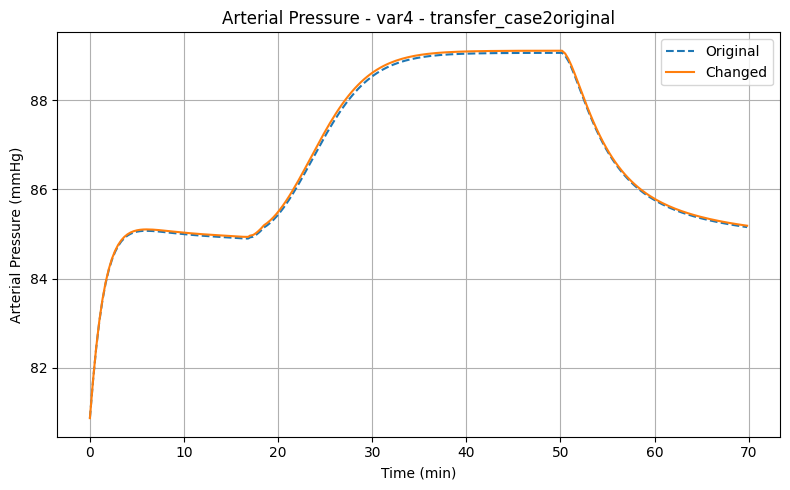

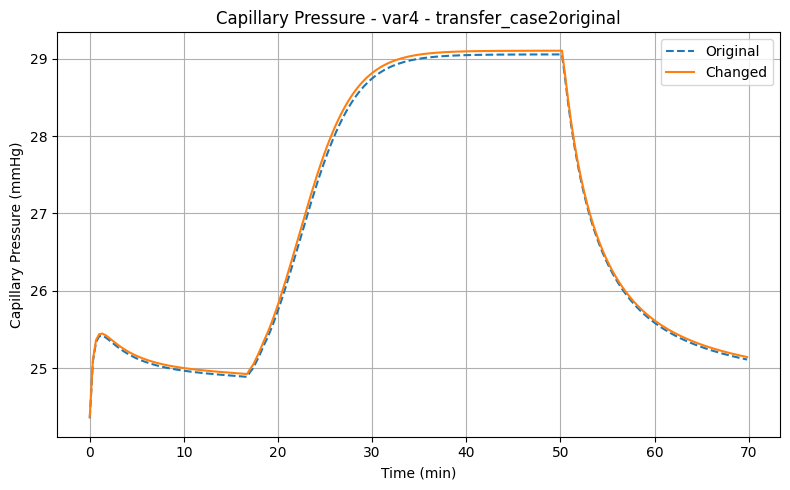

...

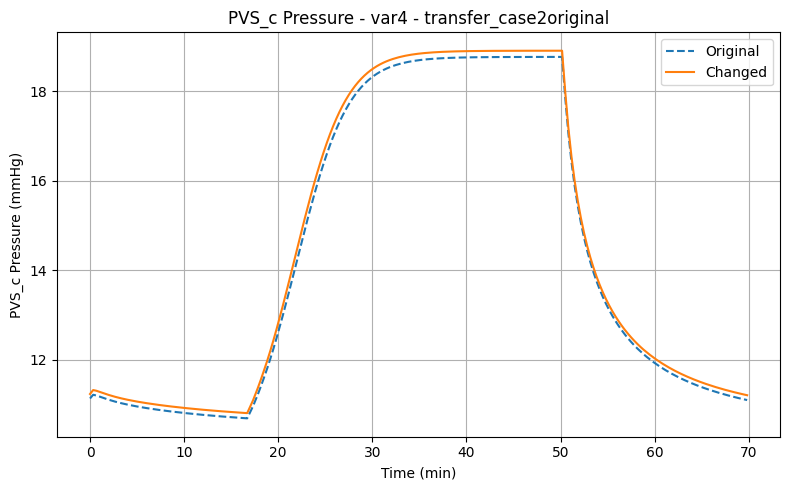

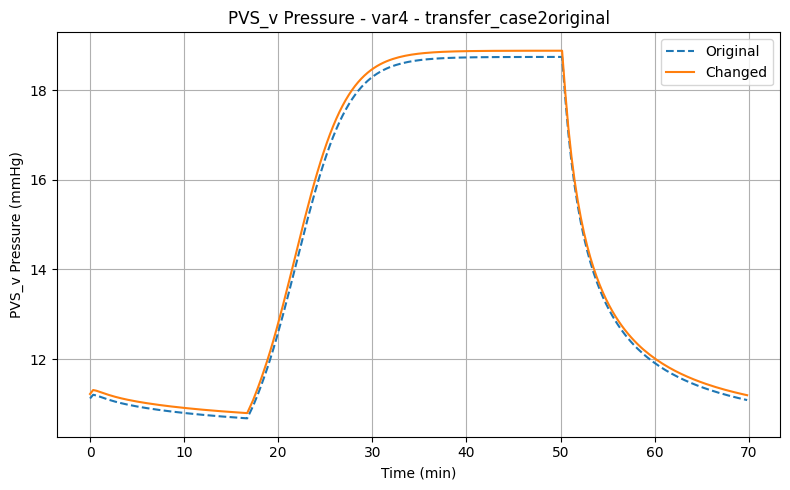

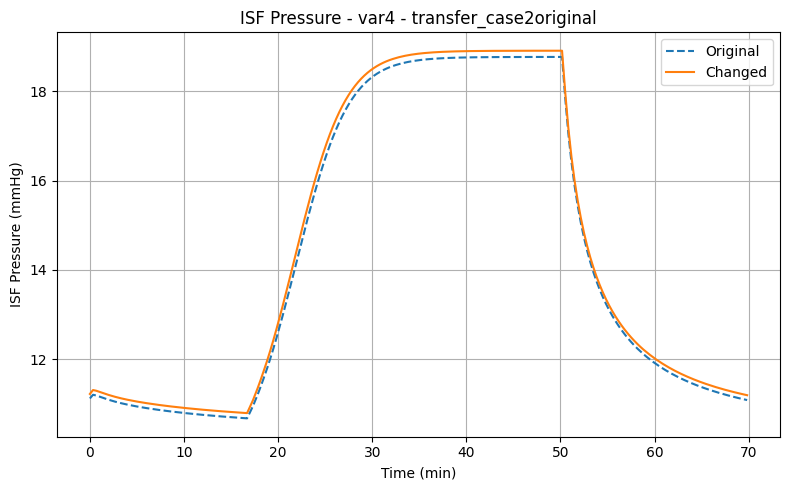

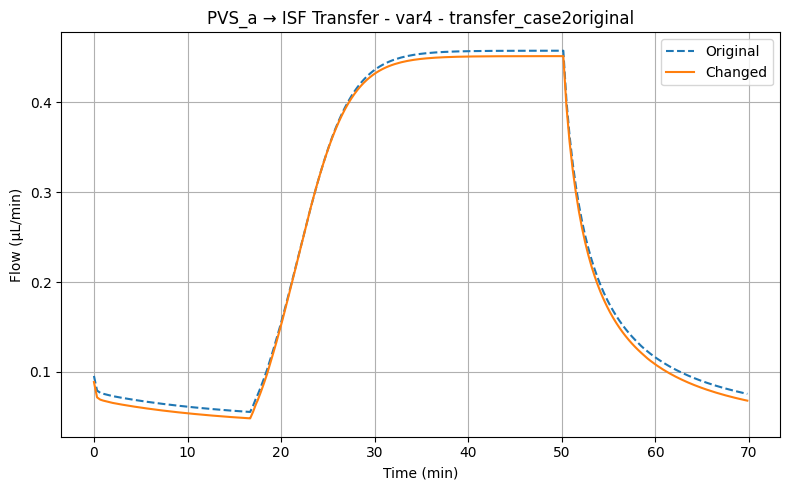

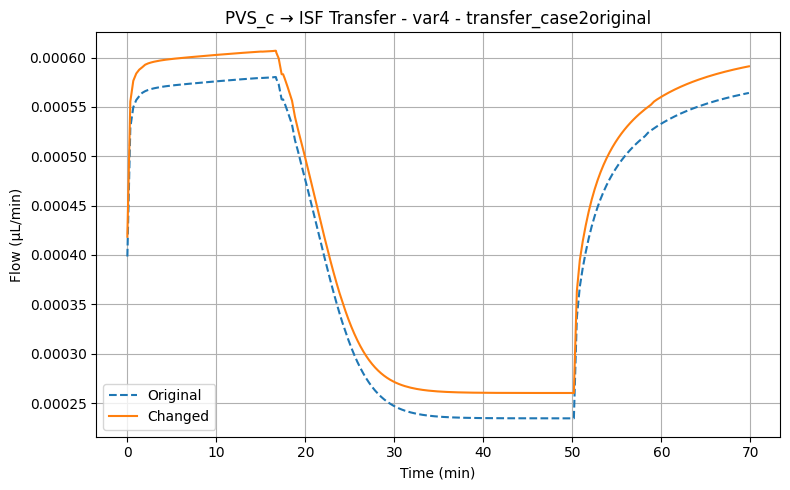

Error reading files:
  /content/drive/MyDrive/227 Final Project/Variation 4 Results/transfer_case2original/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 4 Results/transfer_case2/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 4 Results/transfer_case2original/transfer_capillary_ISF.txt not found.


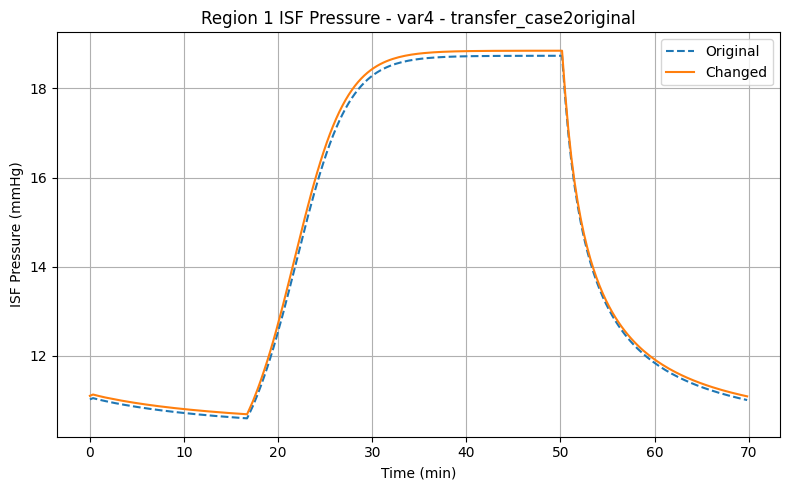

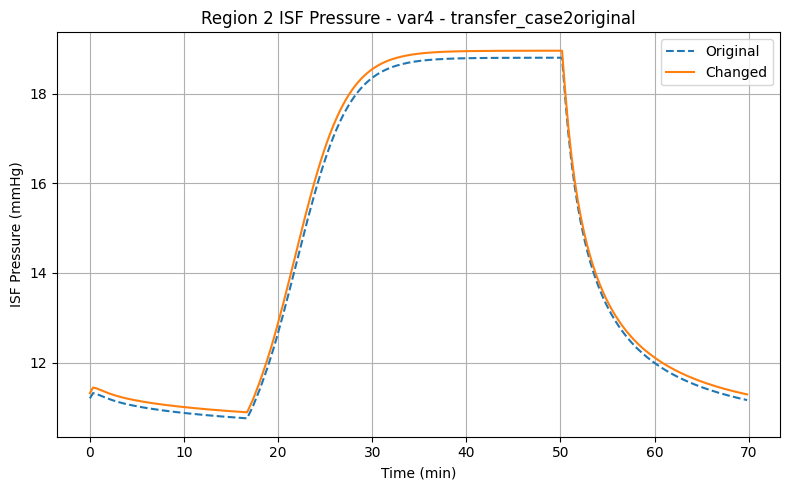

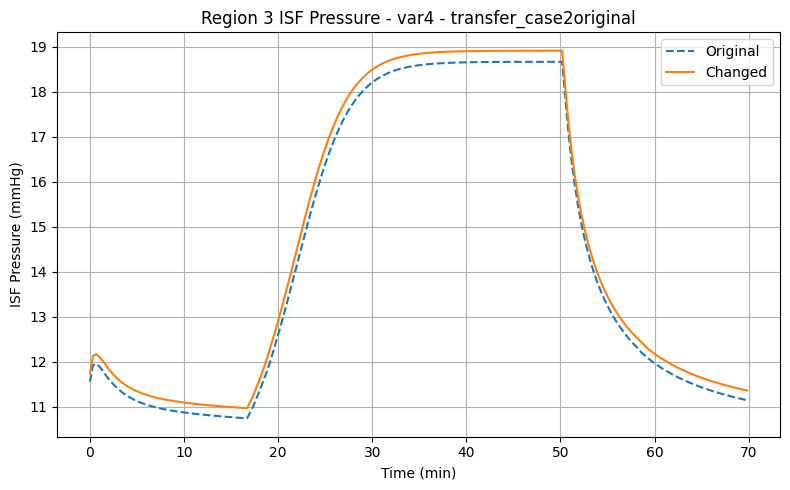


=== VAR4 | transfer_case3original vs transfer_case3 ===


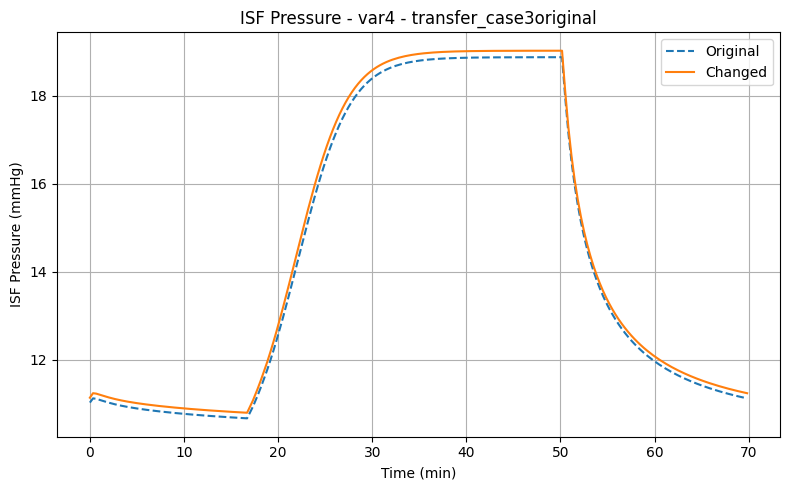

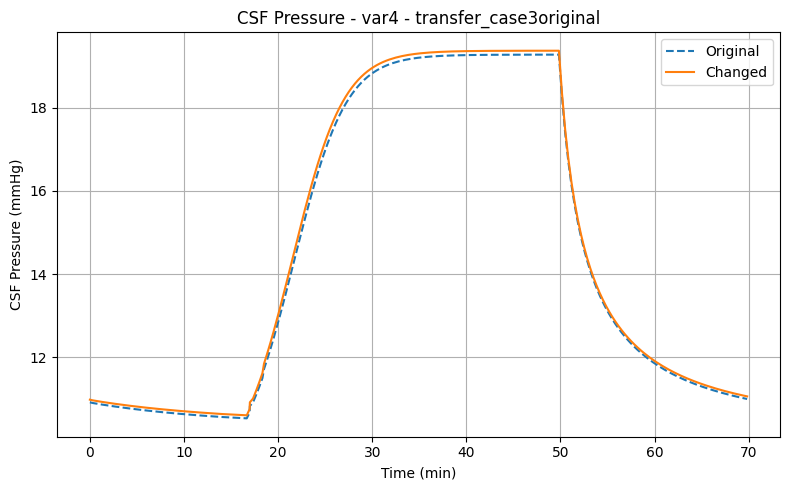

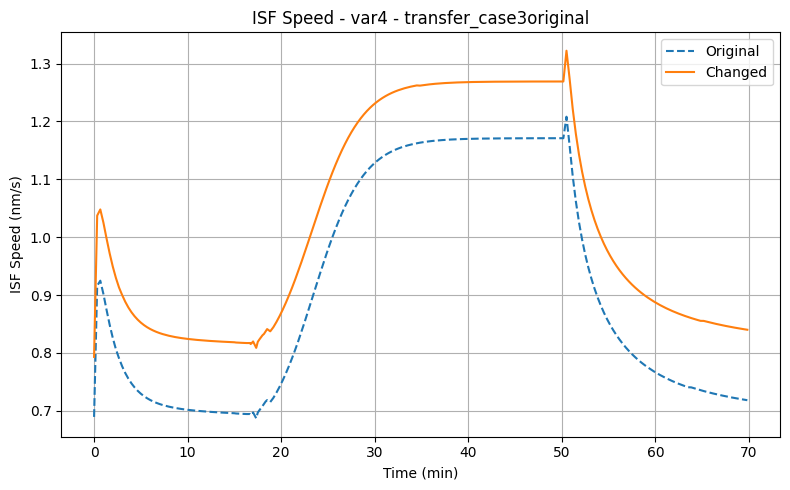

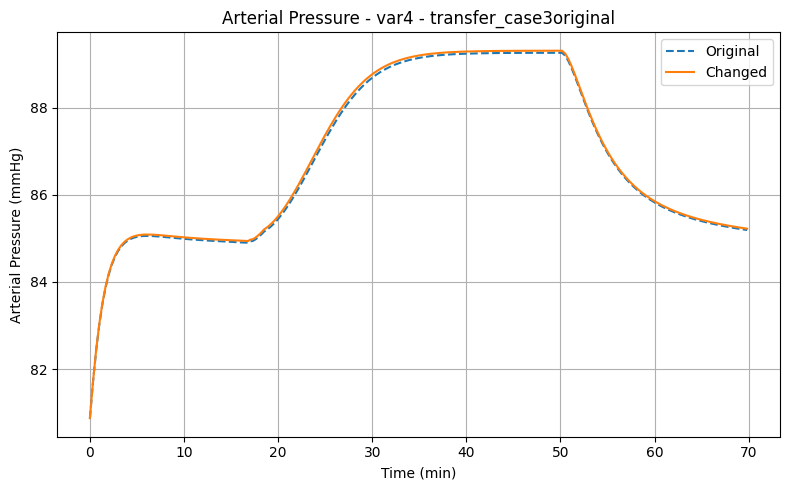

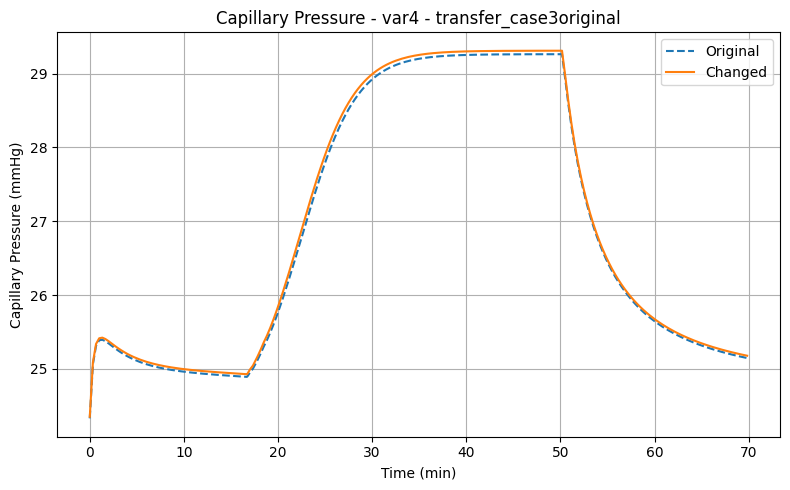

...

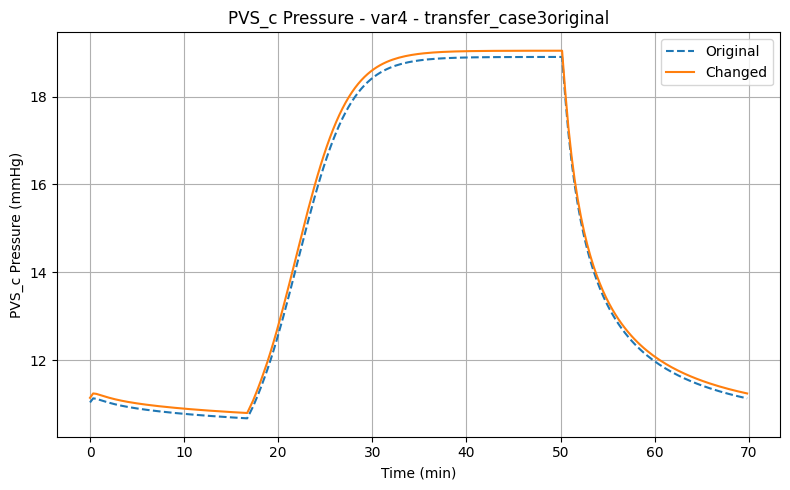

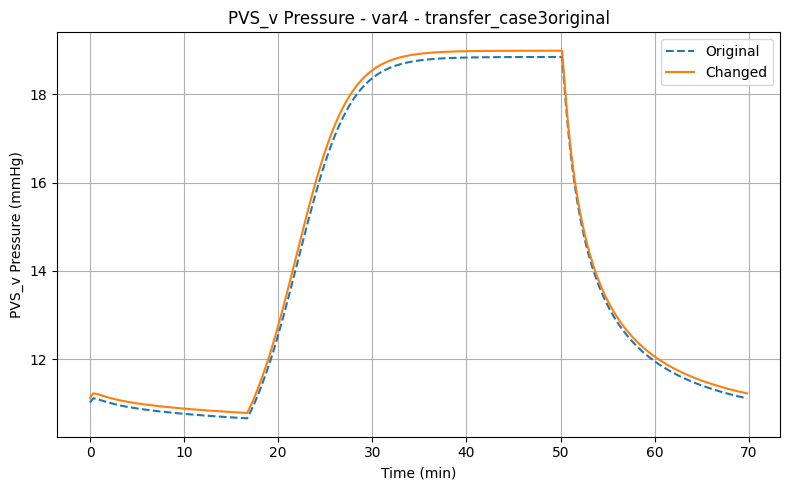

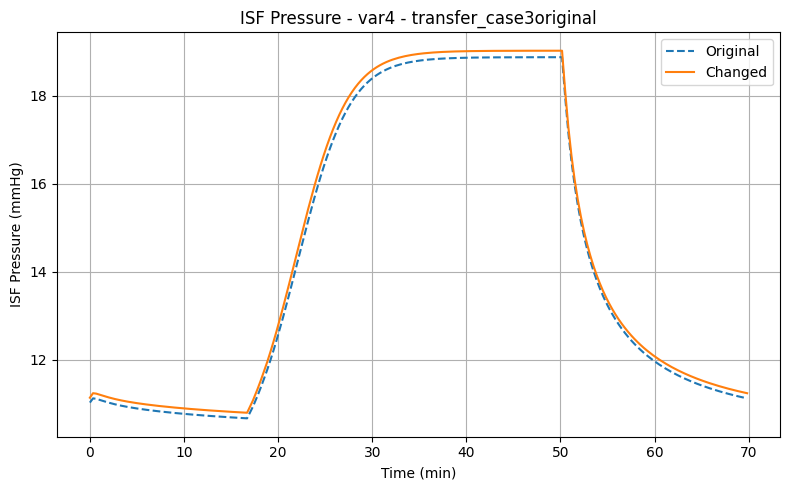

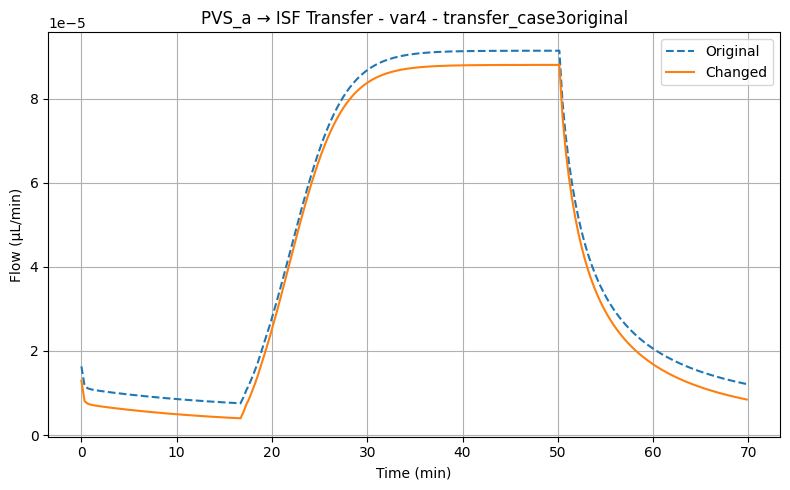

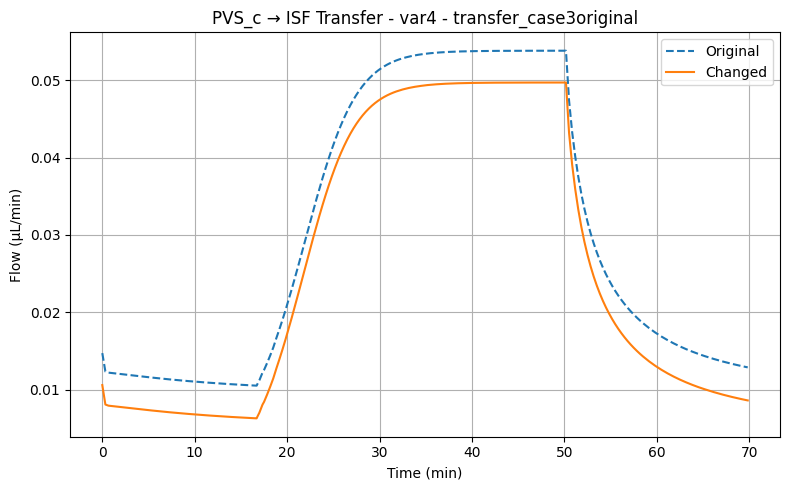

Error reading files:
  /content/drive/MyDrive/227 Final Project/Variation 4 Results/transfer_case3original/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 4 Results/transfer_case3/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 4 Results/transfer_case3original/transfer_capillary_ISF.txt not found.


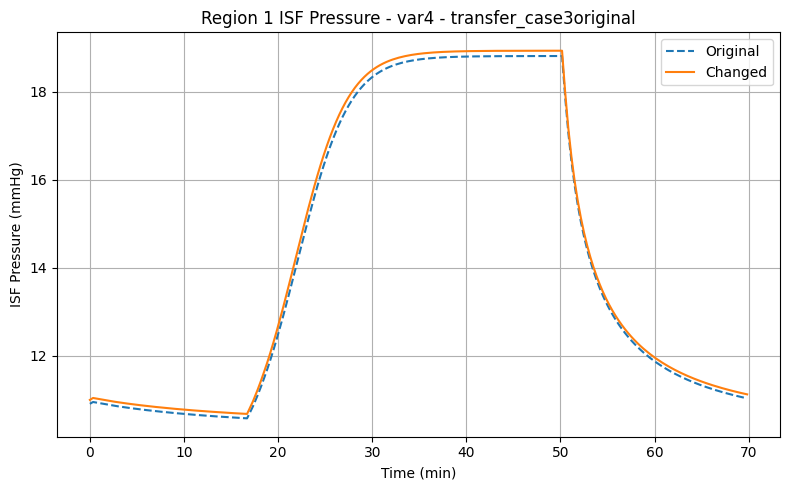

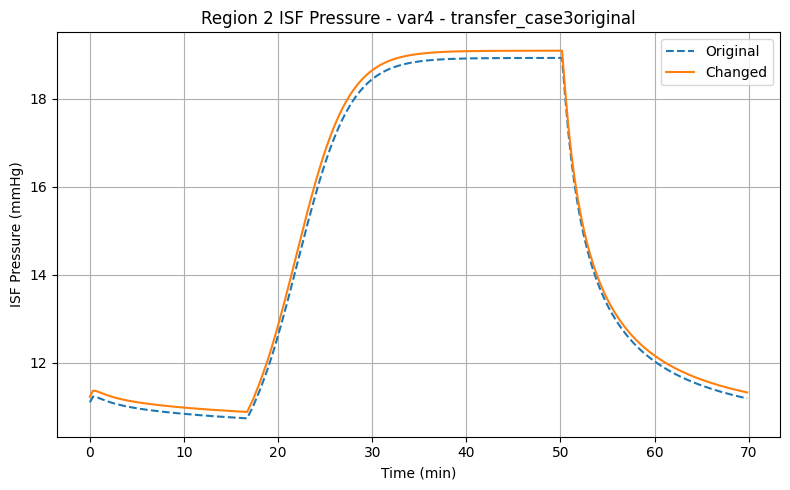

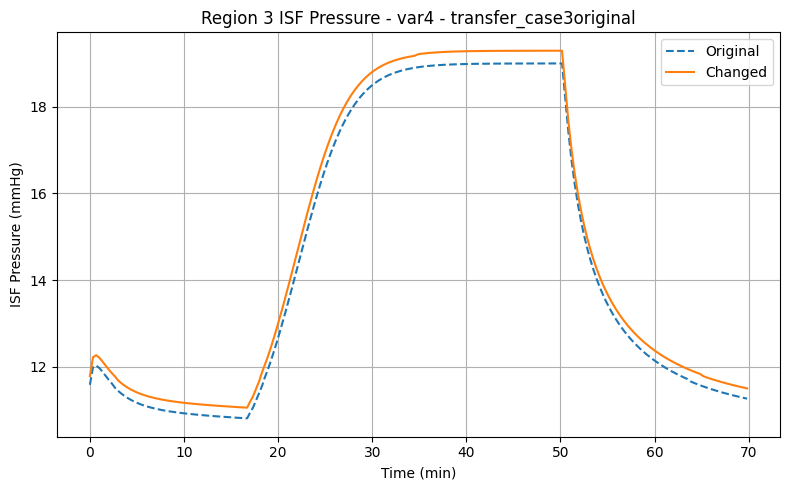


=== VAR4 | transfer_case4original vs transfer_case4 ===


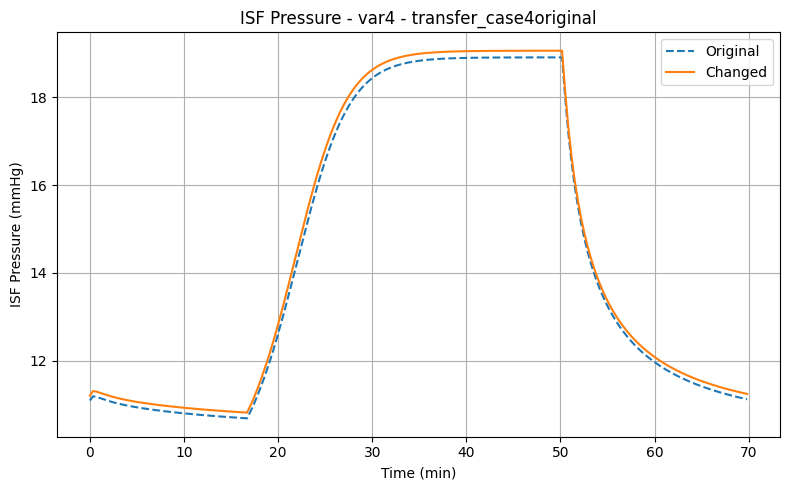

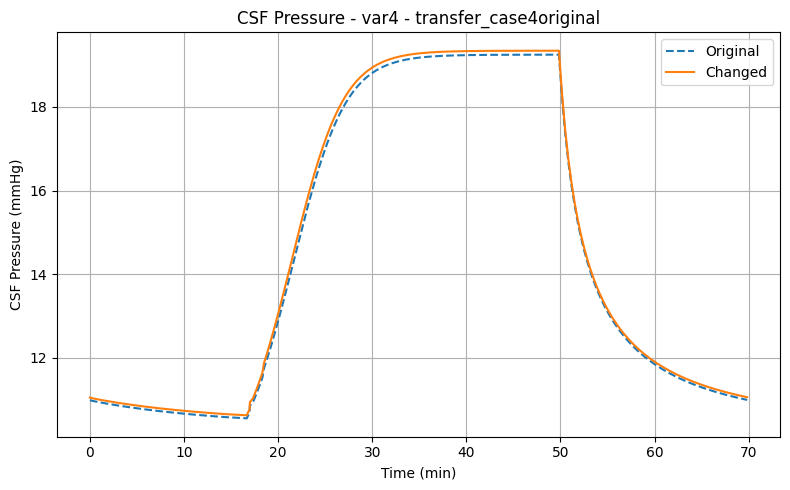

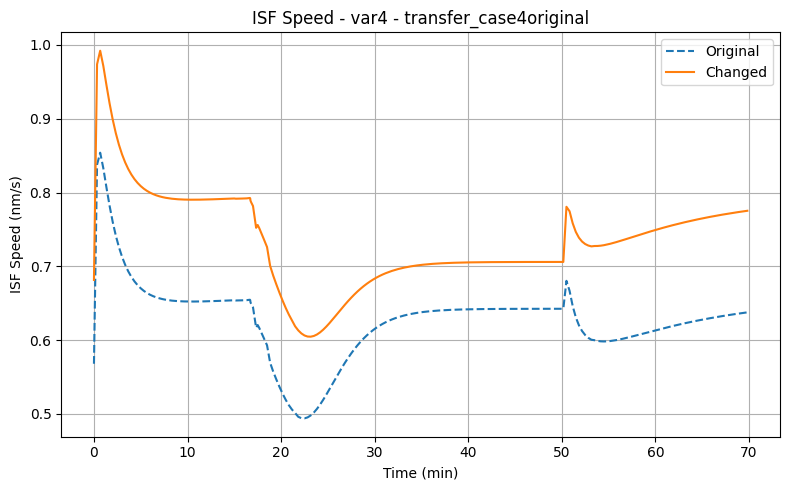

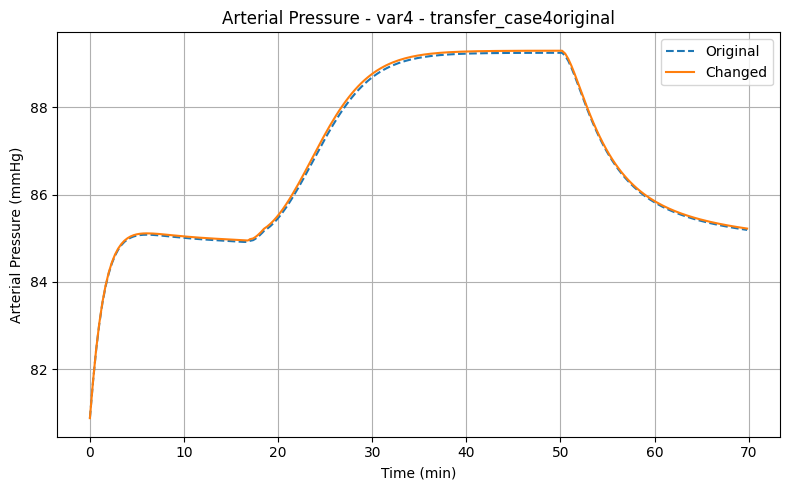

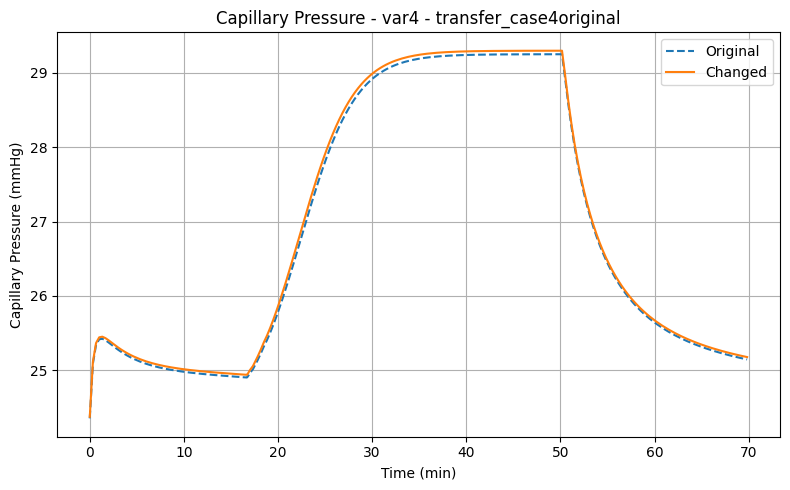

...

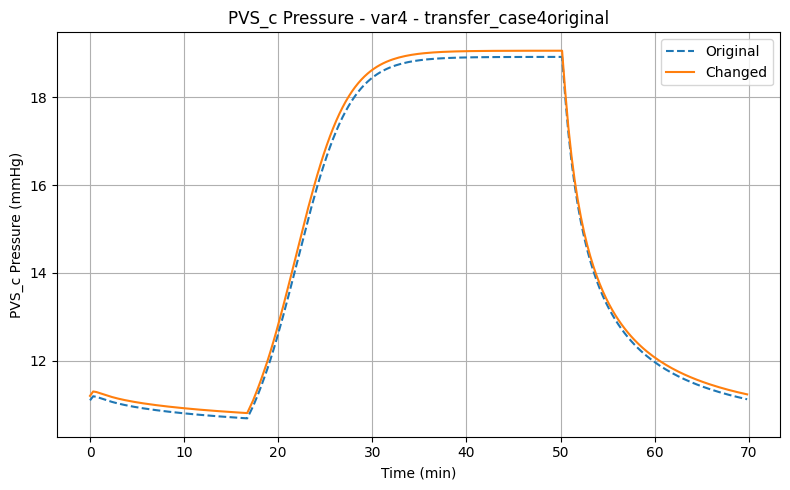

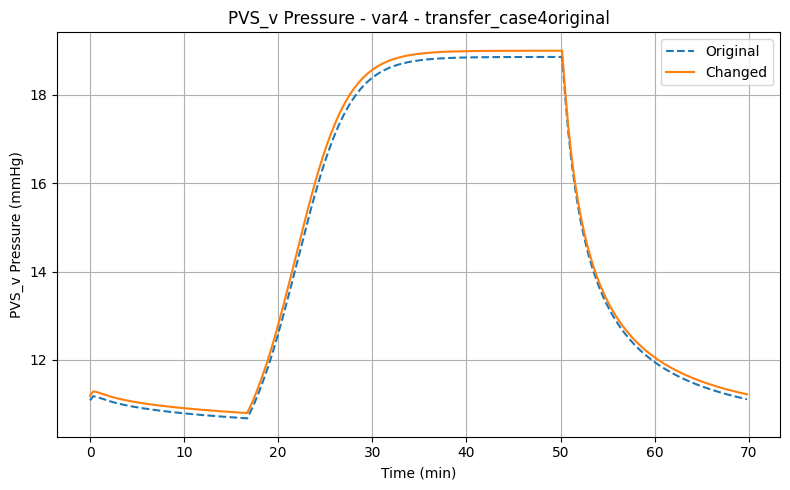

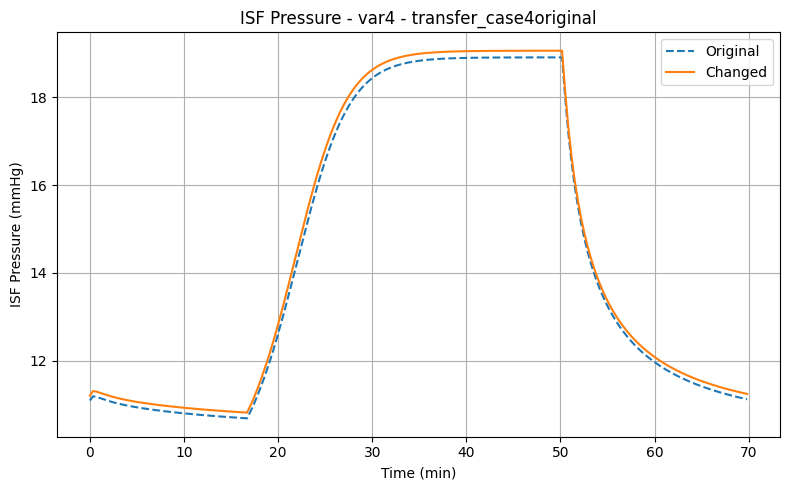

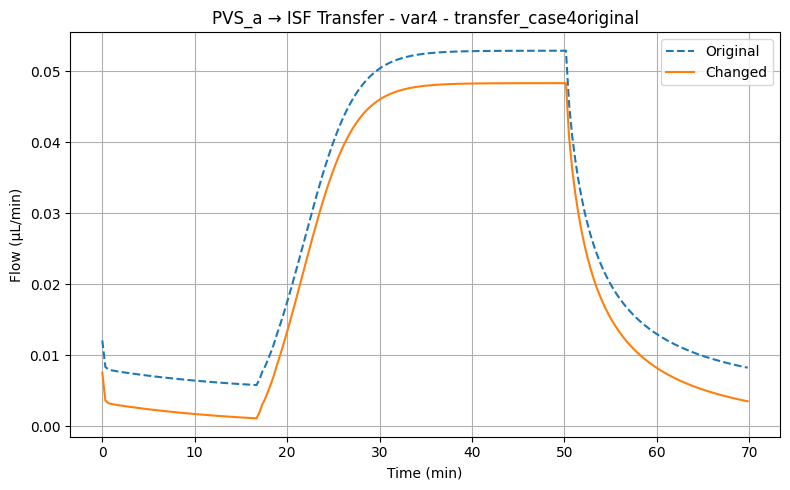

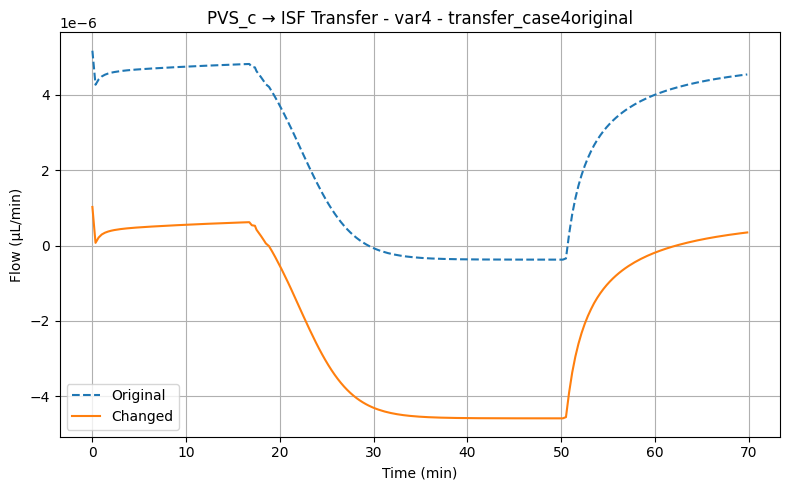

Error reading files:
  /content/drive/MyDrive/227 Final Project/Variation 4 Results/transfer_case4original/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 4 Results/transfer_case4/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 4 Results/transfer_case4original/transfer_capillary_ISF.txt not found.


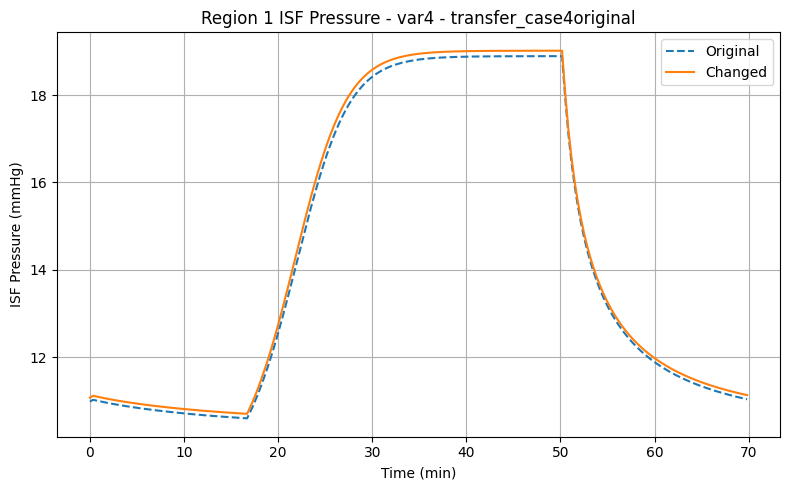

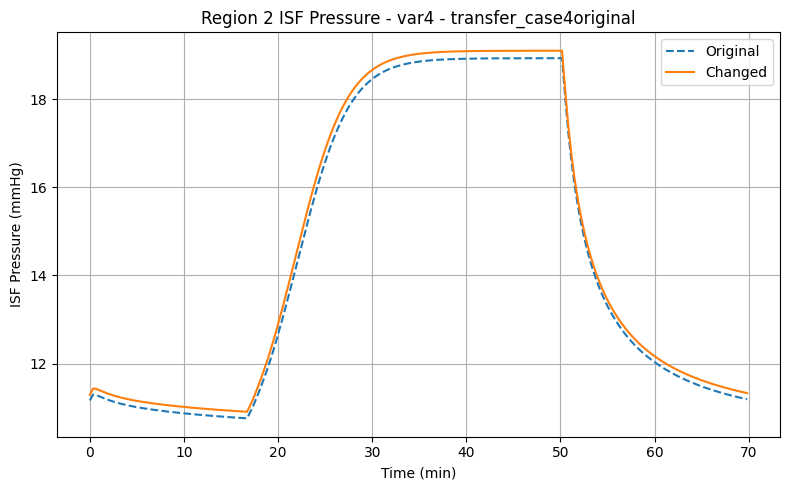

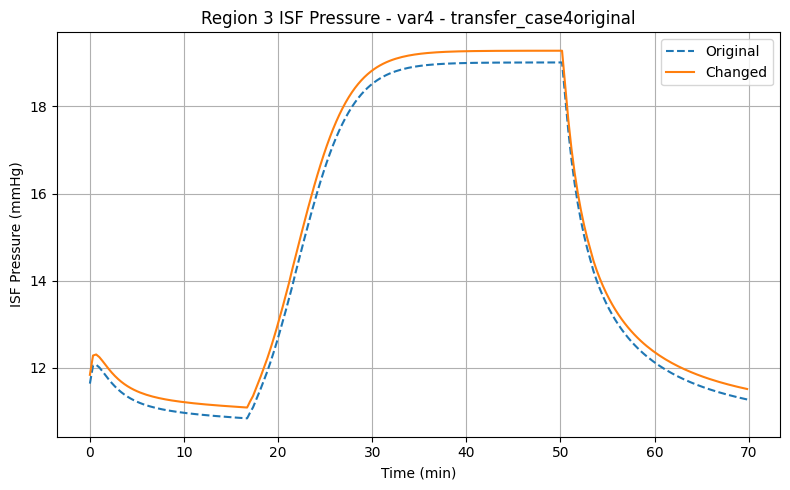


=== VAR5 | base5_original vs base ===


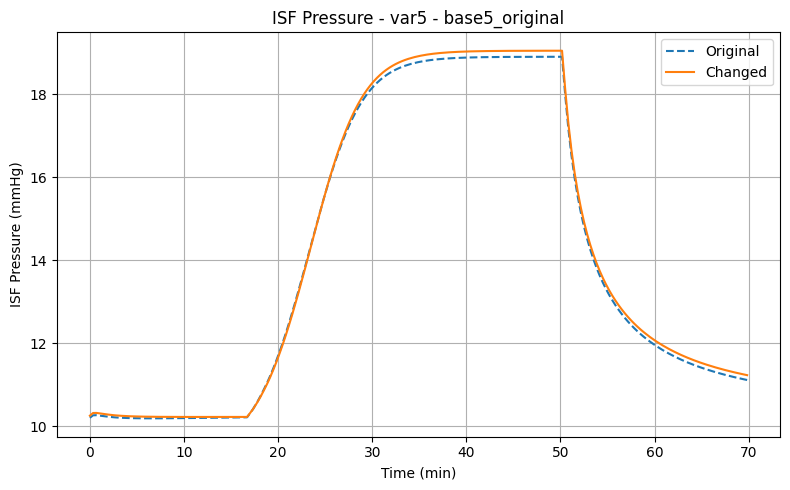

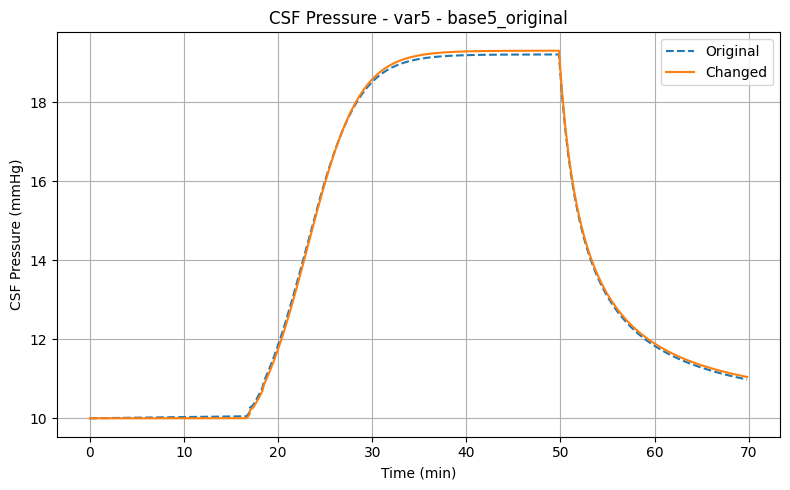

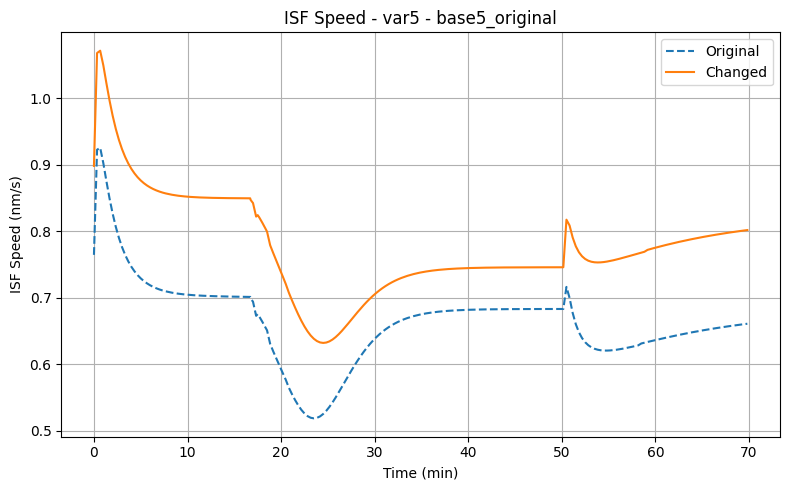

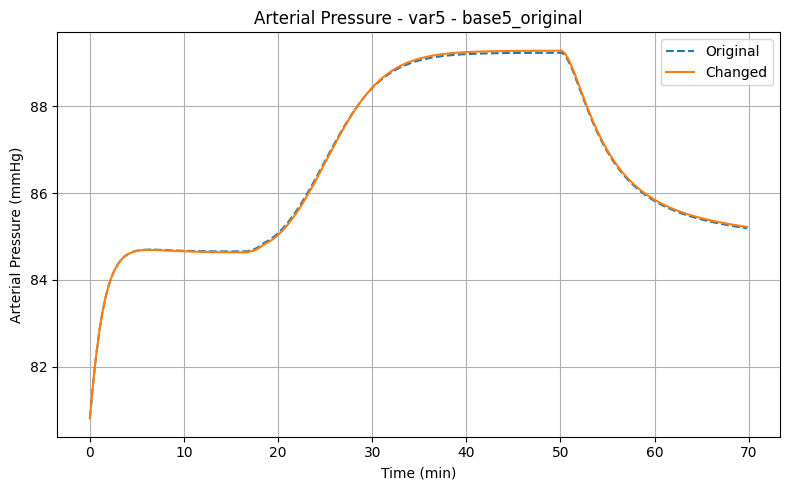

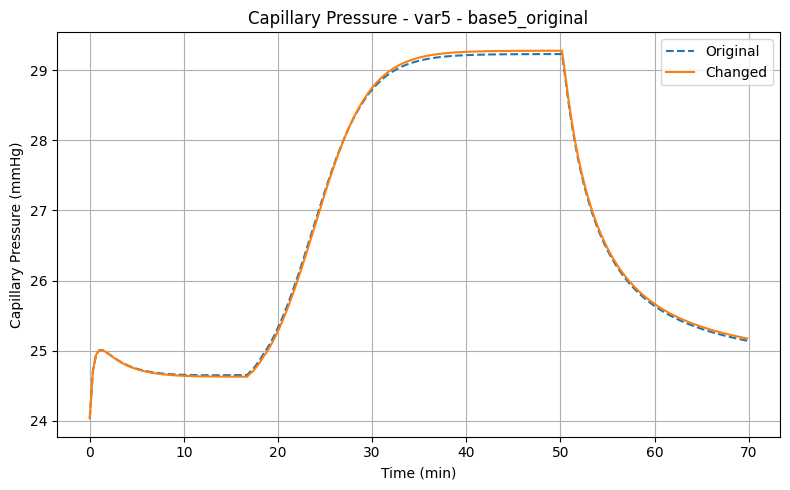

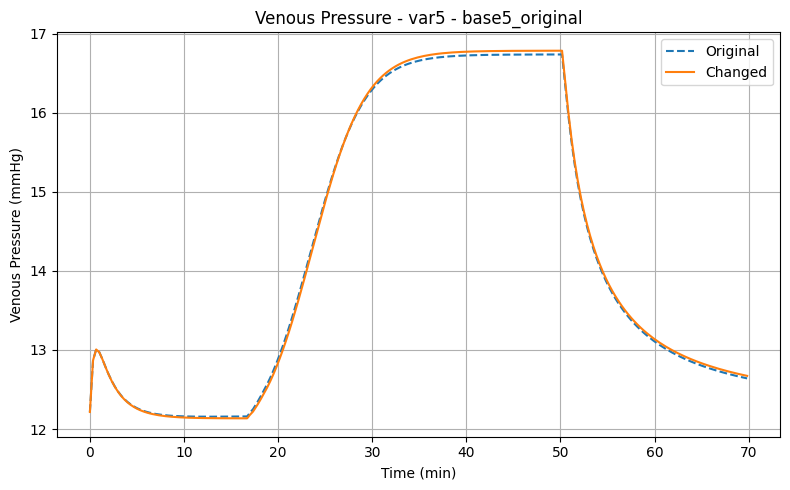

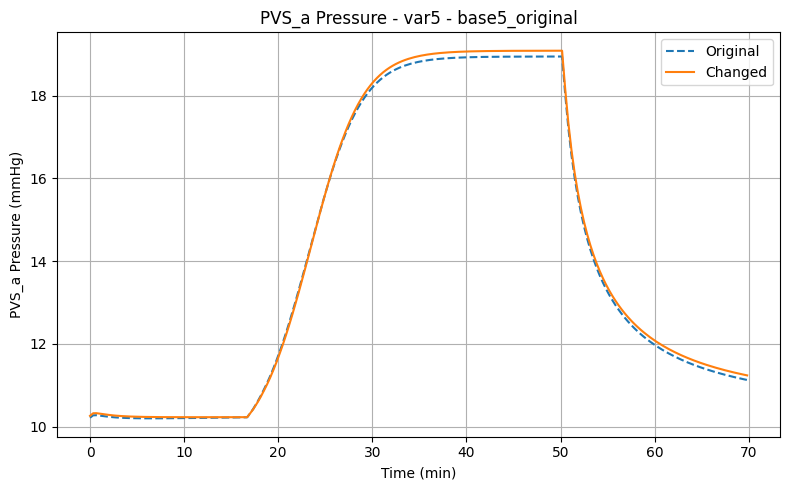

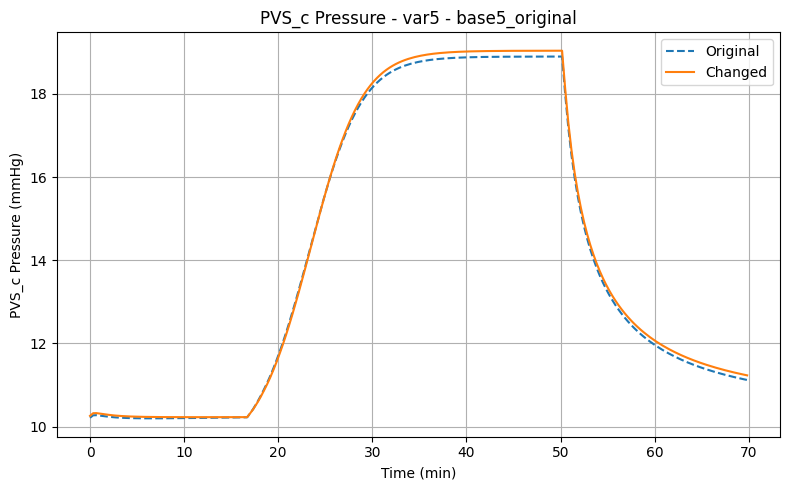

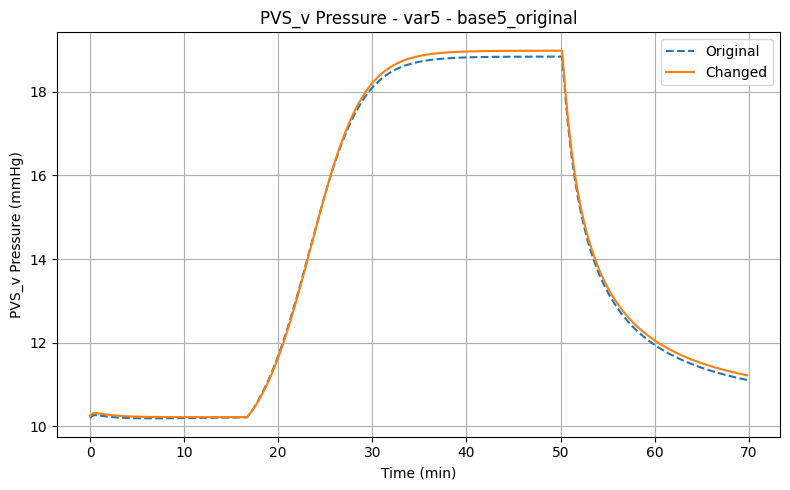

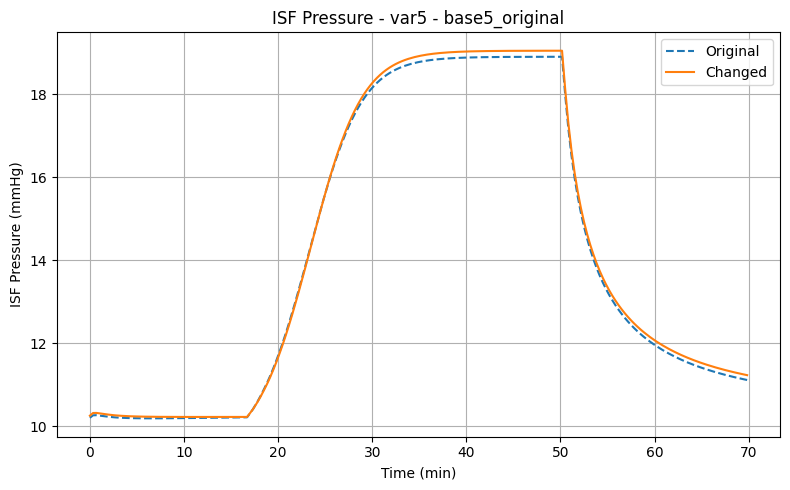

Error reading files:
  /content/drive/MyDrive/227 Final Project/Variation 5/base5_original/transfer_PVS_a_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 5/base/transfer_PVS_a_ISF.txt
  could not convert string 'Time' to float64 at row 112, column 1.
Error reading files:
  /content/drive/MyDrive/227 Final Project/Variation 5/base5_original/transfer_PVS_c_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 5/base/transfer_PVS_c_ISF.txt
  could not convert string 'Time' to float64 at row 112, column 1.
Error reading files:
  /content/drive/MyDrive/227 Final Project/Variation 5/base5_original/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 5/base/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 5/base5_original/transfer_capillary_ISF.txt not found.


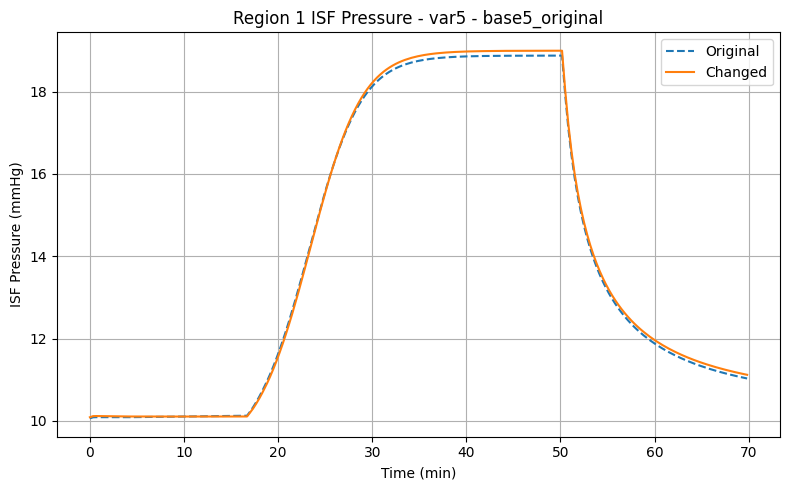

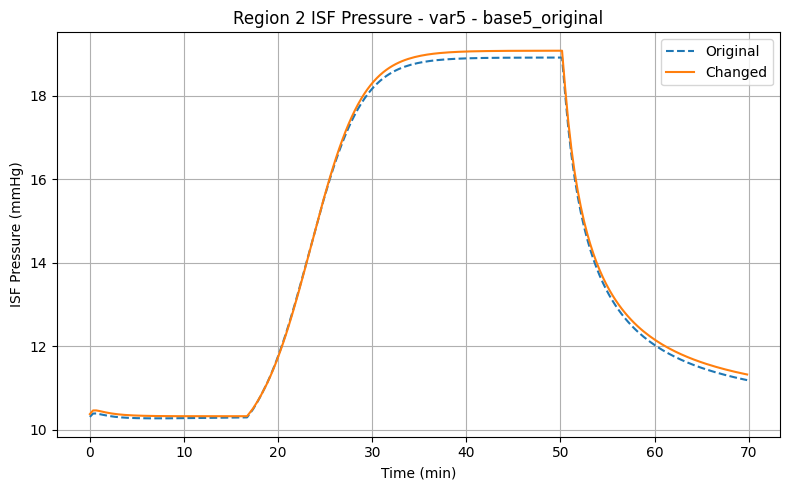

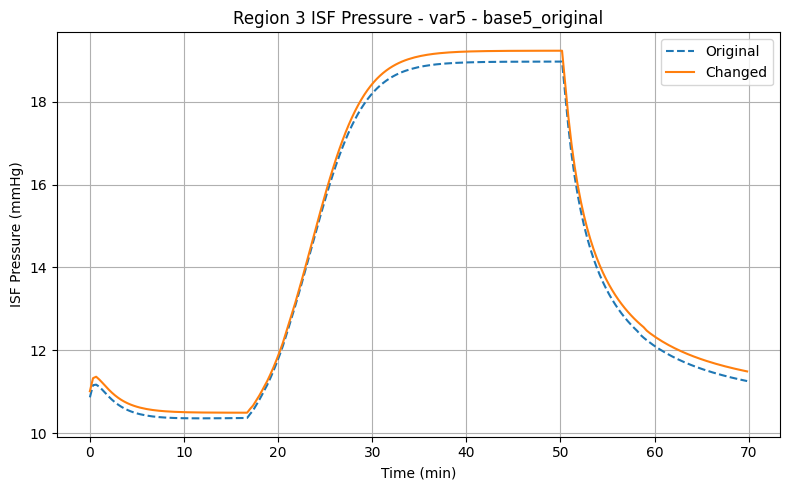


=== VAR5 | high_kECS_original vs high_kECS ===


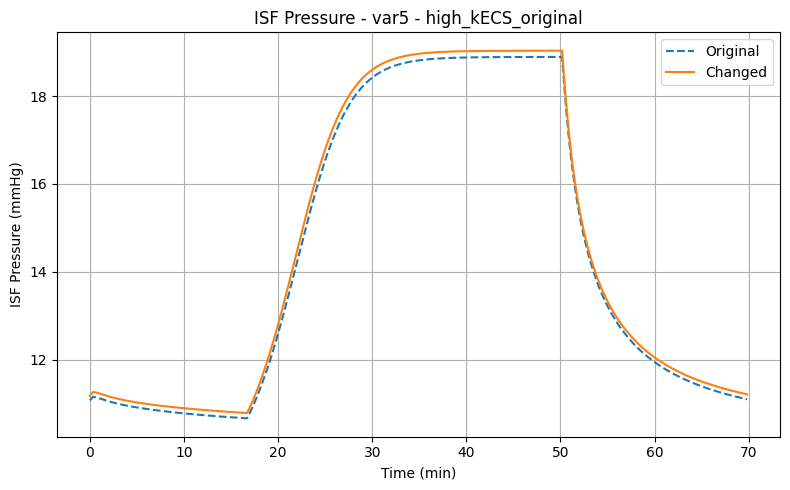

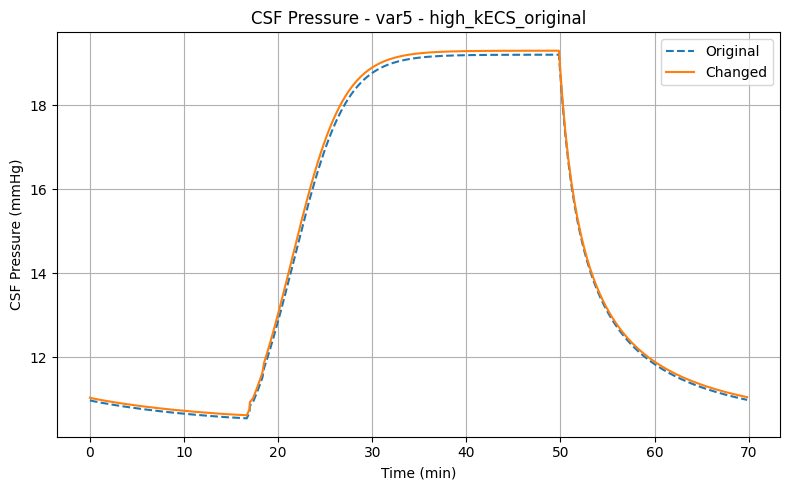

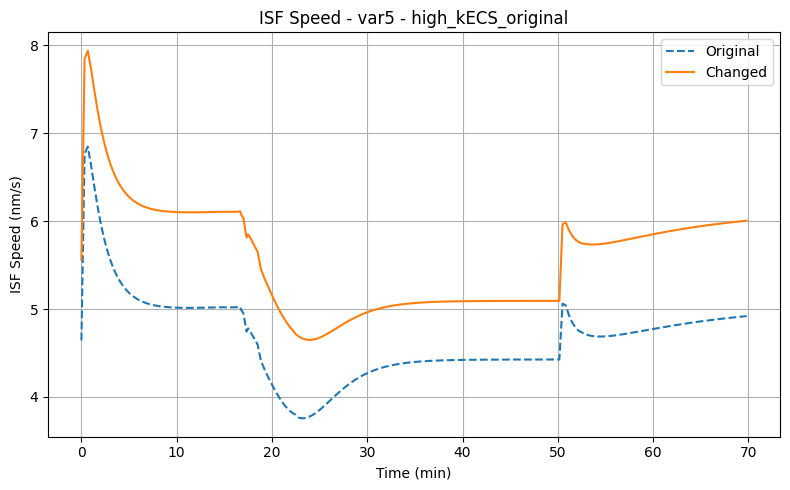

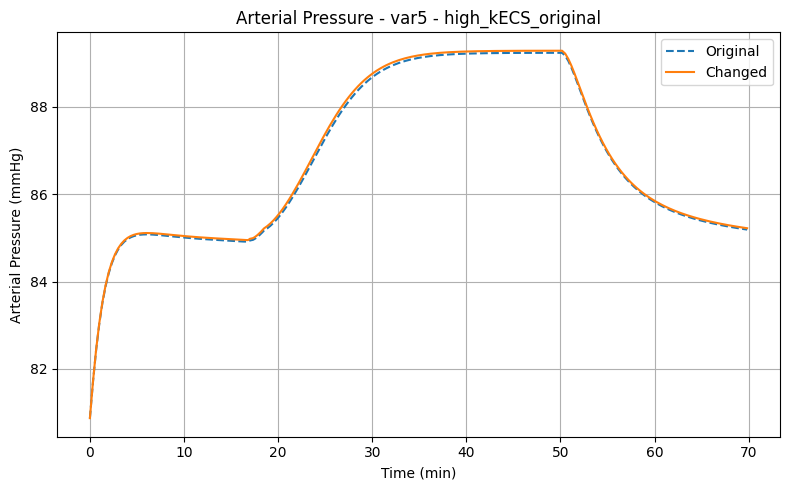

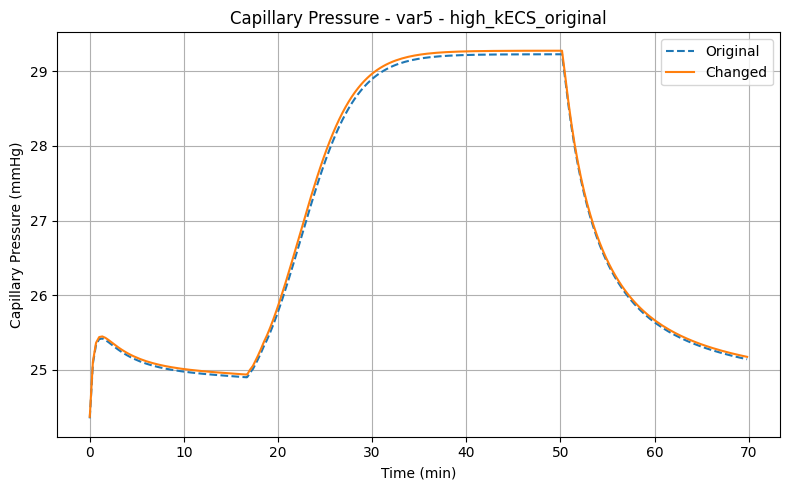

...

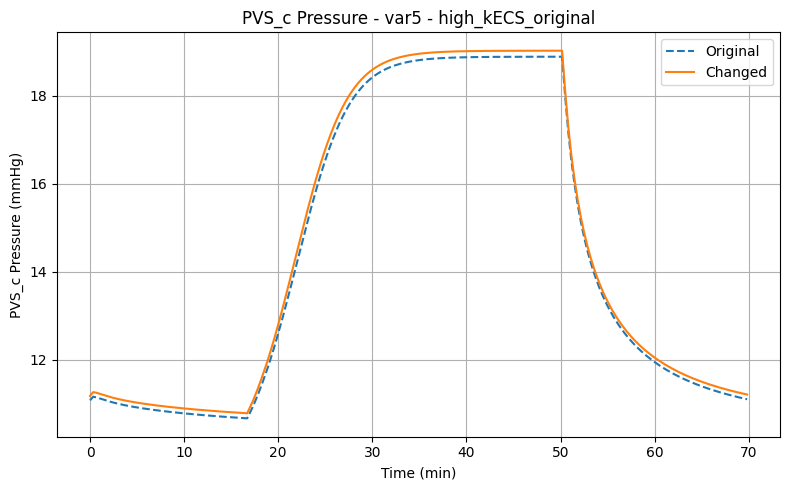

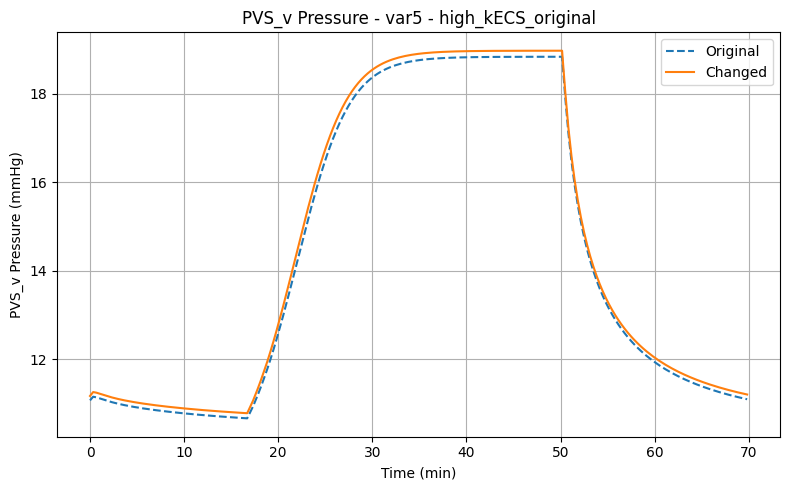

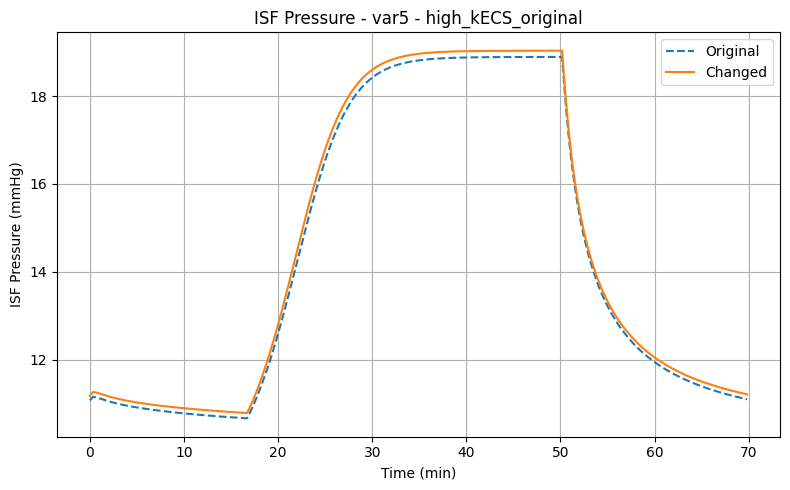

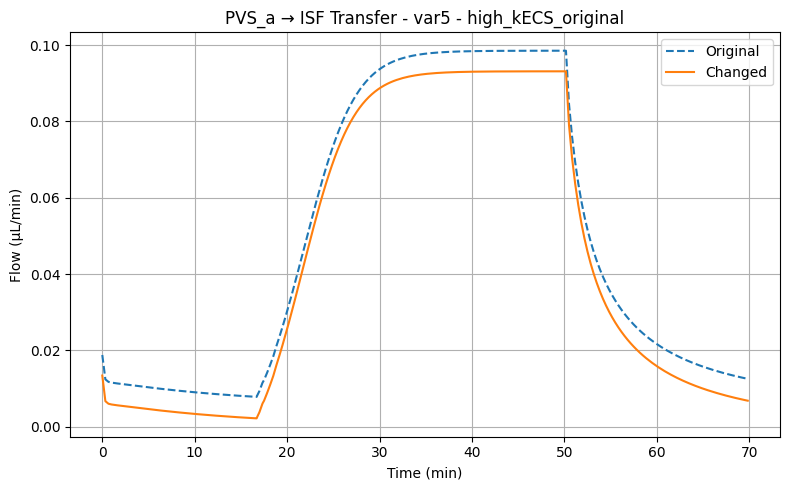

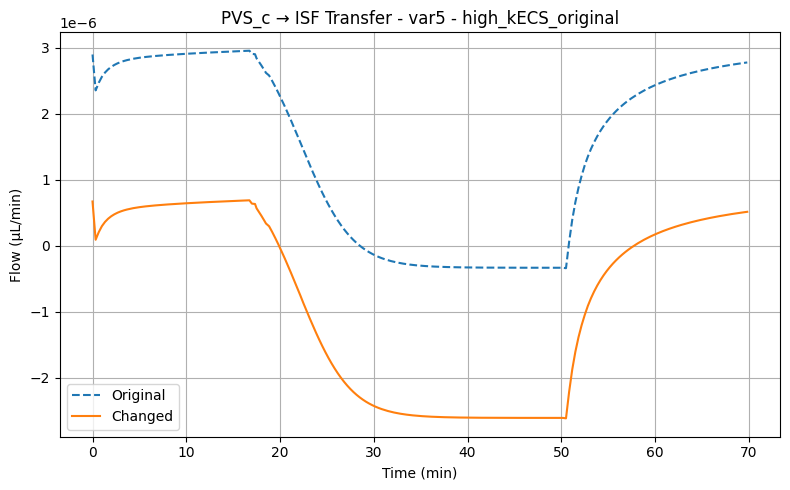

Error reading files:
  /content/drive/MyDrive/227 Final Project/Variation 5/high_kECS_original/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 5/high_kECS/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 5/high_kECS_original/transfer_capillary_ISF.txt not found.


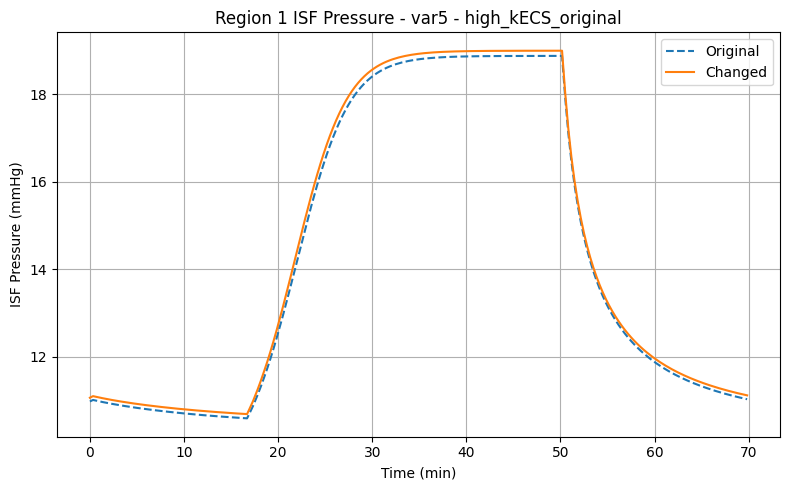

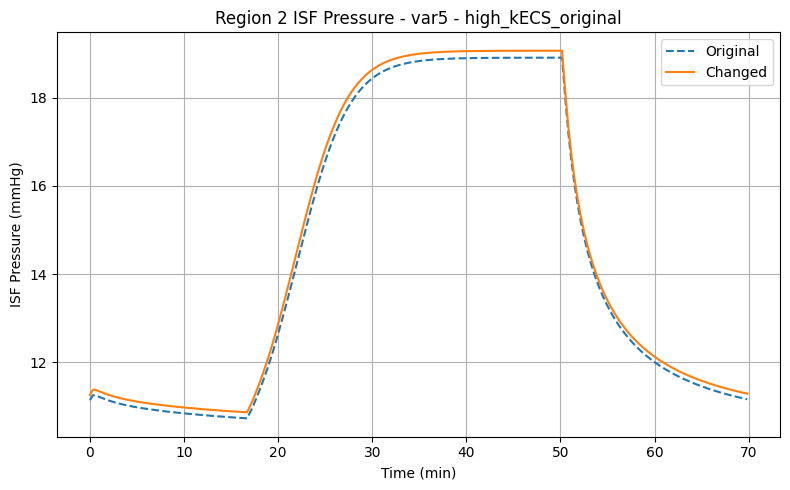

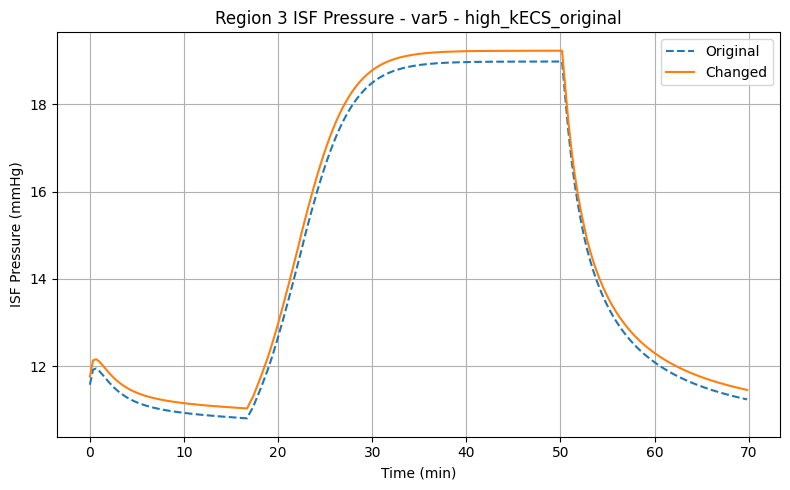


=== VAR5 | very_high_kECS_original vs very_high_kECS ===


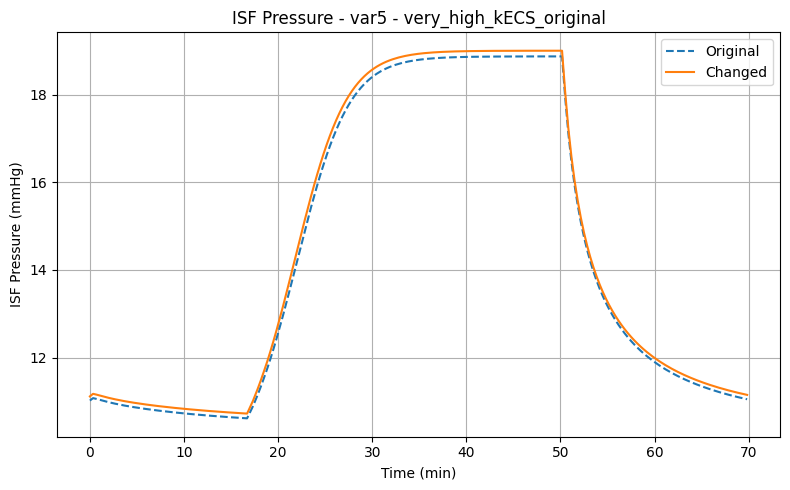

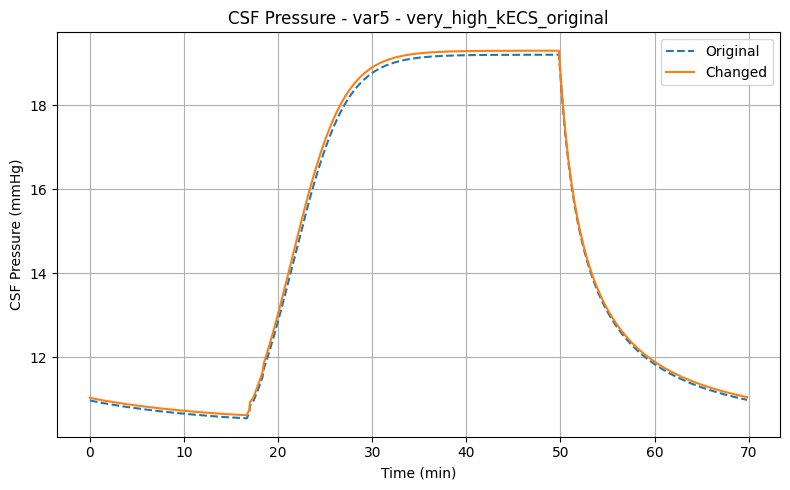

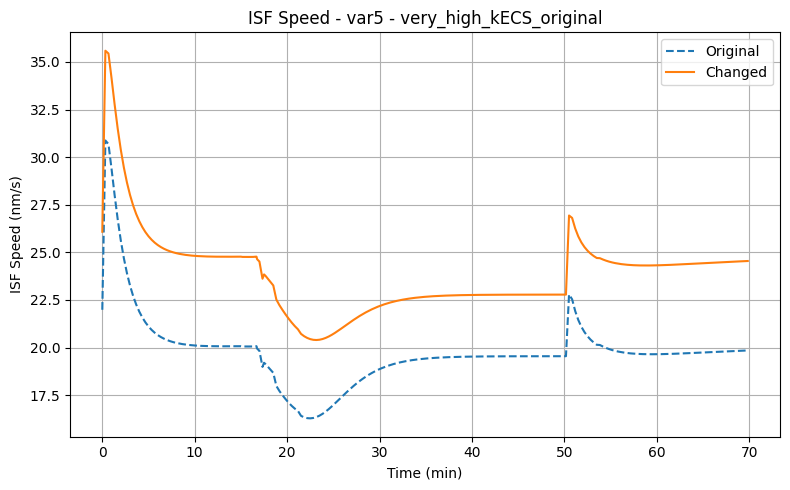

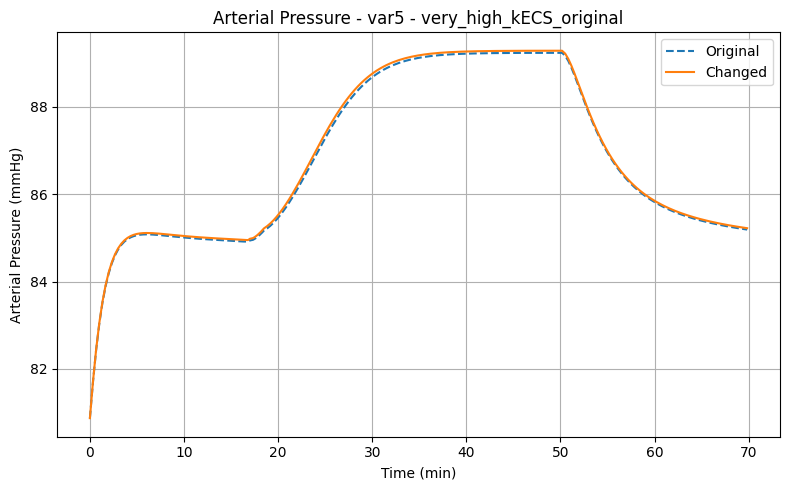

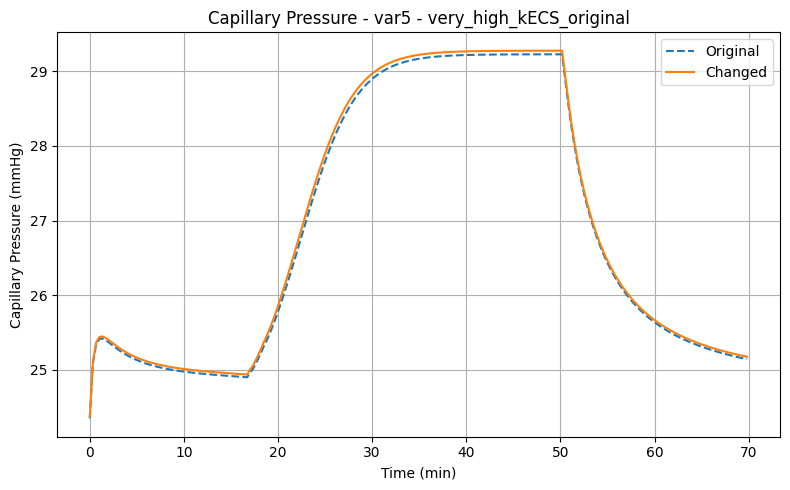

...

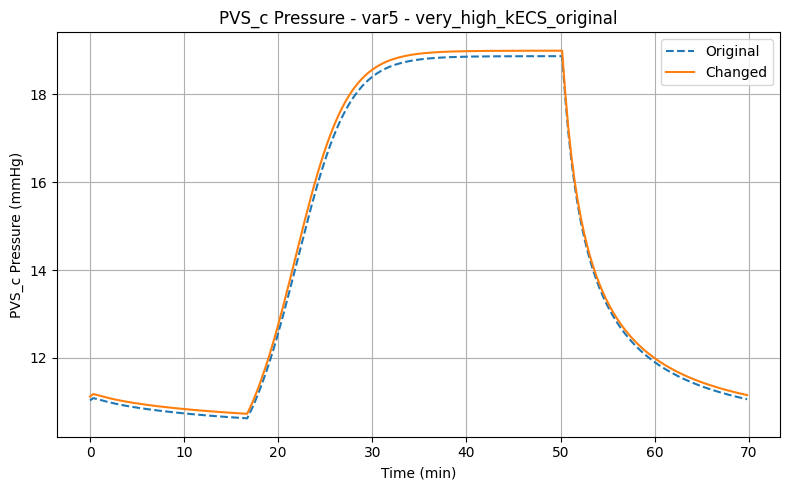

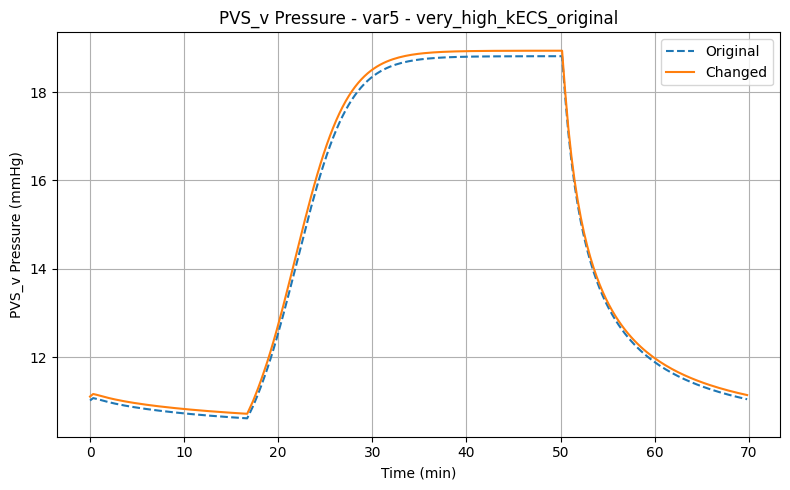

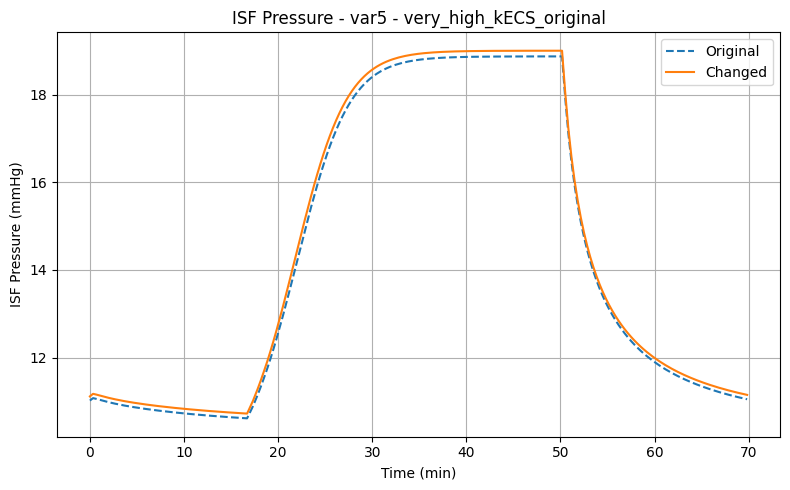

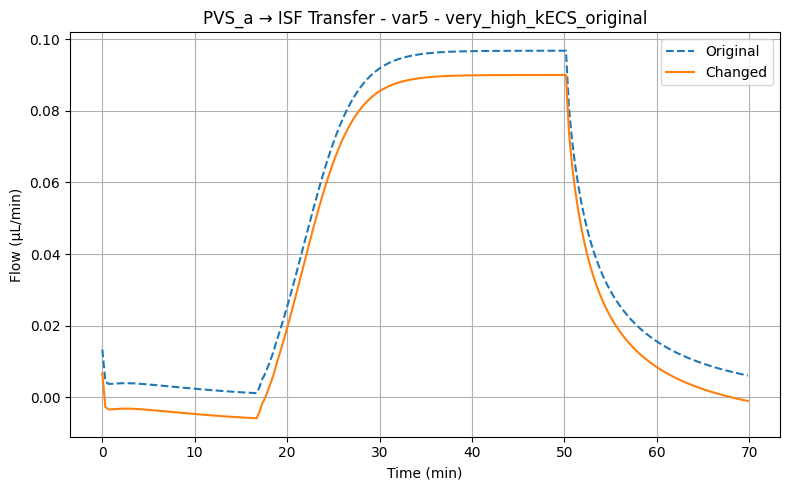

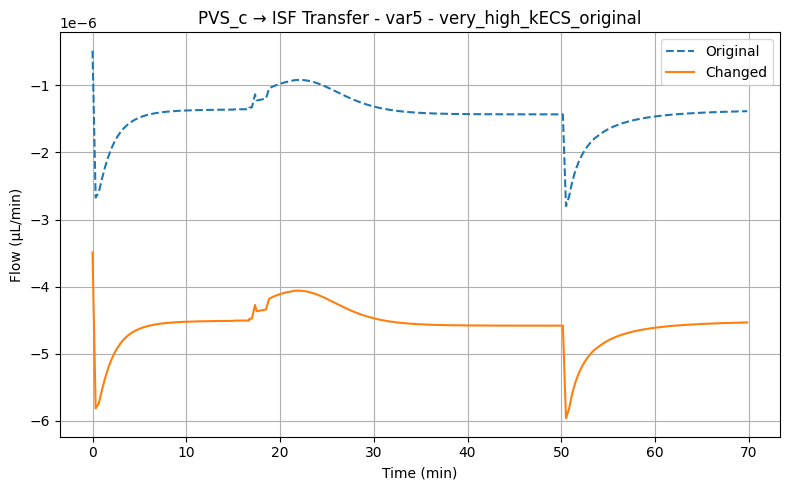

Error reading files:
  /content/drive/MyDrive/227 Final Project/Variation 5/very_high_kECS_original/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 5/very_high_kECS/transfer_capillary_ISF.txt
  /content/drive/MyDrive/227 Final Project/Variation 5/very_high_kECS_original/transfer_capillary_ISF.txt not found.


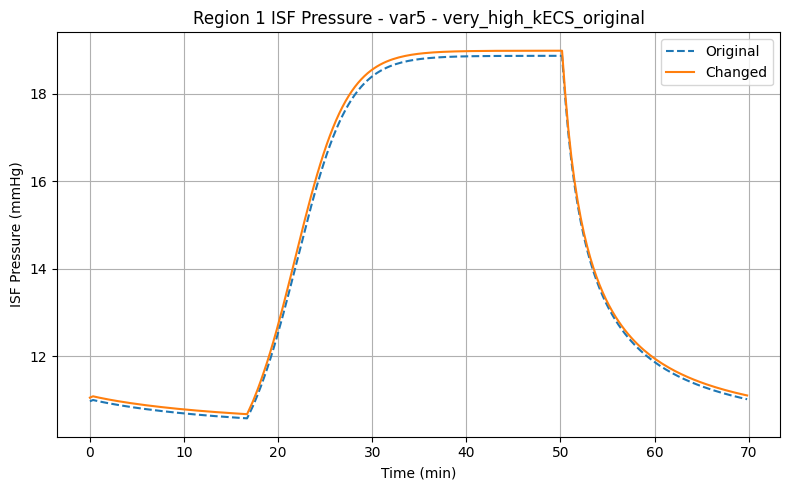

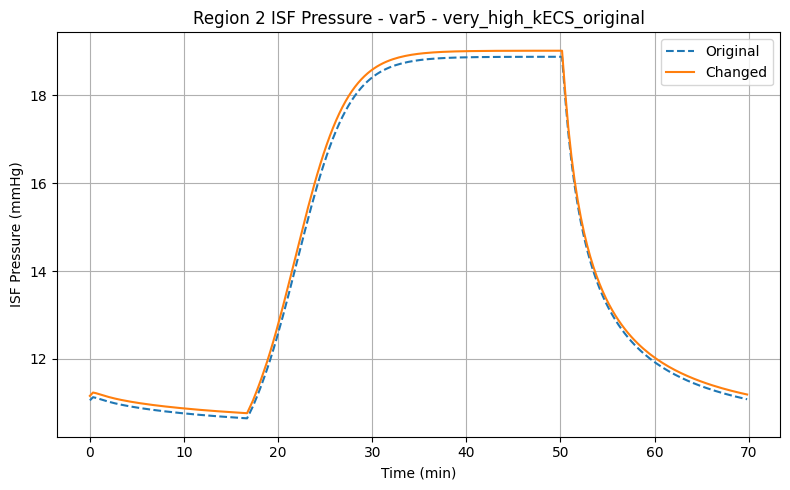

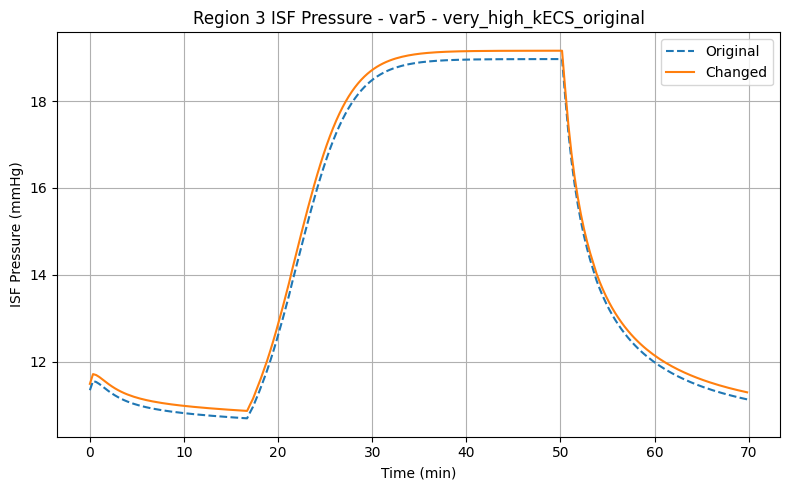

In [ ]:
run_all_plots()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

# === Load data ===
def load_time_series(file_path, column_index, time_unit='min', scale=1.0):
    try:
        data = np.loadtxt(file_path, skiprows=1)
        time = data[:, 0] / 60 if time_unit == 'min' else data[:, 0]
        values = data[:, column_index + 1] * scale
        return time, values
    except Exception as e:
        print(f"Failed to load {file_path}: {e}")
        return None, None

# === Plot all subcases for one variation and one metric ===
def plot_combined_variation(metric_name, file_name, column_index, ylabel, base_path, variation_subcases, time_unit='min'):
    plt.figure(figsize=(14, 6))  # Wider figure to compensate for external legend
    color_cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']

    for i, (orig_folder, chng_folder) in enumerate(variation_subcases):
        color = color_cycle[i % len(color_cycle)]
        path_orig = os.path.join(base_path, orig_folder, file_name)
        path_chng = os.path.join(base_path, chng_folder, file_name)

        time_orig, val_orig = load_time_series(path_orig, column_index, time_unit)
        time_chng, val_chng = load_time_series(path_chng, column_index, time_unit)

        if time_orig is not None and time_chng is not None:
            label_base = orig_folder.replace("_original", "")
            plt.plot(time_orig, val_orig, linestyle='--', color=color, label=f"{label_base} (Original)")
            plt.plot(time_chng, val_chng, linestyle='-', color=color, label=f"{label_base} (Changed)")

    plt.xlabel(f"Time ({time_unit})")
    plt.ylabel(ylabel)
    plt.title(f"{metric_name}")
    plt.grid(True)

    # External legend
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)
    plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust for new figure width
    plt.show()


# === Loop over all variations ===
def run_combined_plots_per_variation():
    base_dirs = {
        "var1": "/content/drive/MyDrive/227 Final Project/Variation 1 Results",
        "var2": "/content/drive/MyDrive/227 Final Project/Variation 2 Results",
        "var3": "/content/drive/MyDrive/227 Final Project/Variation 3 Results",
        "var4": "/content/drive/MyDrive/227 Final Project/Variation 4 Results",
        "var5": "/content/drive/MyDrive/227 Final Project/Variation 5"
    }

    variation_subcases = {
        "var1": [
            ("base1_original", "base1"),
            ("Res_FaghihSharp_original", "Res_FaghihSharp"),
            ("Res_Pizzo_original", "Res_Pizzo")
        ],
        "var2": [
            ("high_DS_resistance_original", "high_DS_resistance"),
            ("low_DS_resistance_original", "low_DS_resistance")
        ],
        "var3": [
            ("constant_filtration_original", "constant_filtration"),
            ("nonconstant_filtration_original", "nonconstant_filtration")
        ],
        "var4": [
            ("base4_original", "base"),
            ("transfer_case1original", "transfer_case1"),
            ("transfer_case2original", "transfer_case2"),
            ("transfer_case3original", "transfer_case3"),
            ("transfer_case4original", "transfer_case4")
        ],
        "var5": [
            ("base5_original", "base"),
            ("high_kECS_original", "high_kECS"),
            ("very_high_kECS_original", "very_high_kECS")
        ]
    }

    metrics = {
        "ISF Pressure": ("pressure_average.dat", 6, "ISF Pressure (mmHg)"),
        "CSF Pressure": ("pressure_average.dat", 7, "CSF Pressure (mmHg)"),
        "ISF Speed": ("speed_average.dat", 6, "ISF Speed (nm/s)")
    }

    for var, subcases in variation_subcases.items():
        base_path = base_dirs[var]
        print(f"\n=== Combined Plot for {var.upper()} ===")
        for metric_name, (fname, col, ylabel) in metrics.items():
            plot_combined_variation(
                metric_name=f"{metric_name} - {var.upper()}",
                file_name=fname,
                column_index=col,
                ylabel=ylabel,
                base_path=base_path,
                variation_subcases=subcases
            )



=== Combined Plot for VAR1 ===


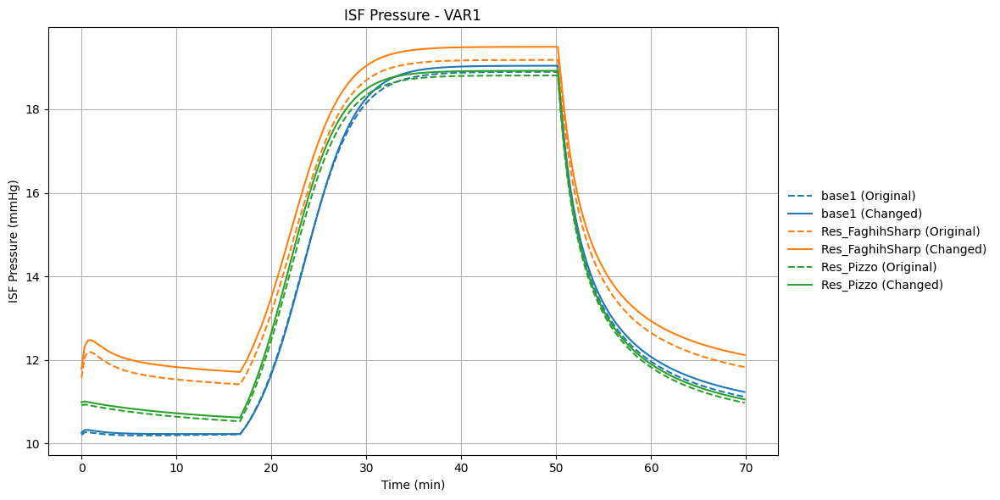

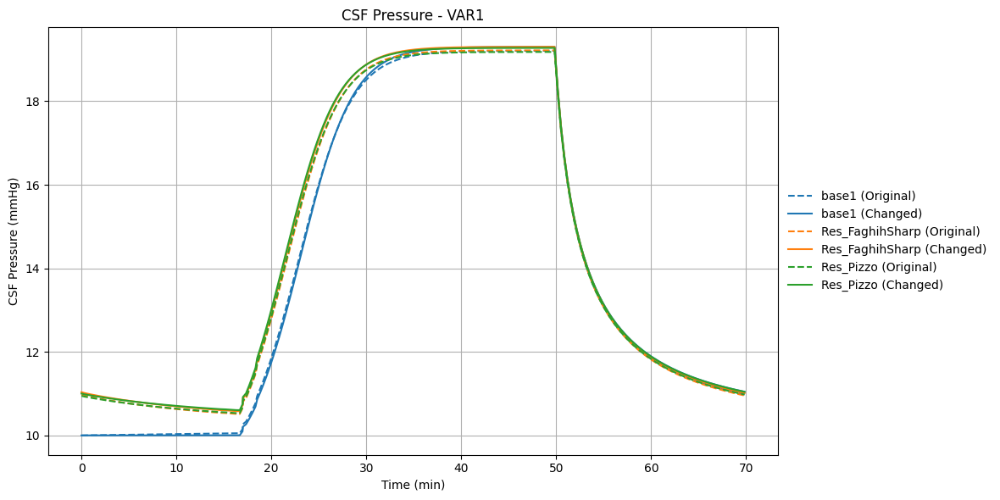

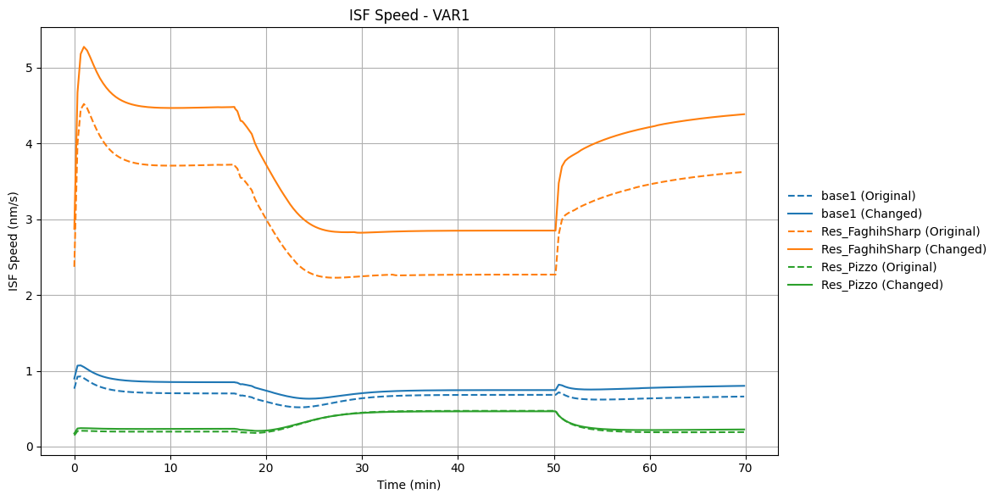


=== Combined Plot for VAR2 ===


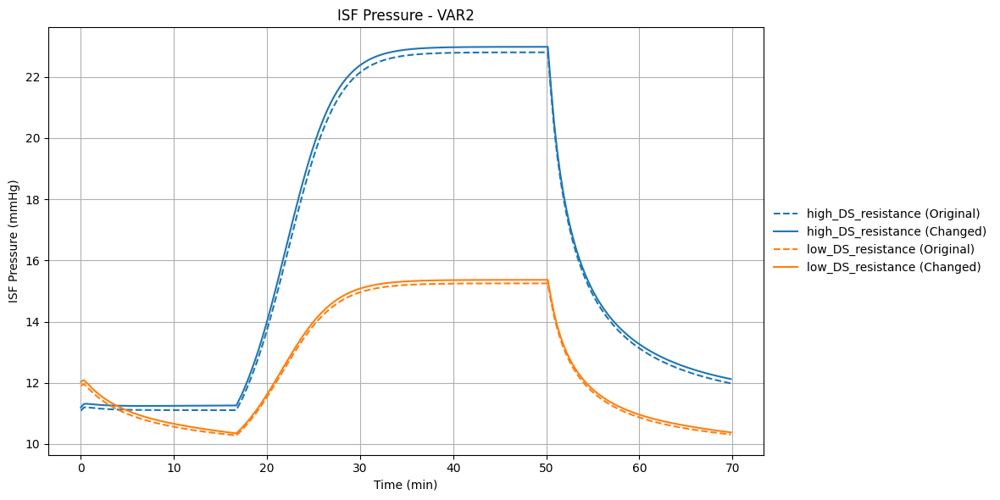

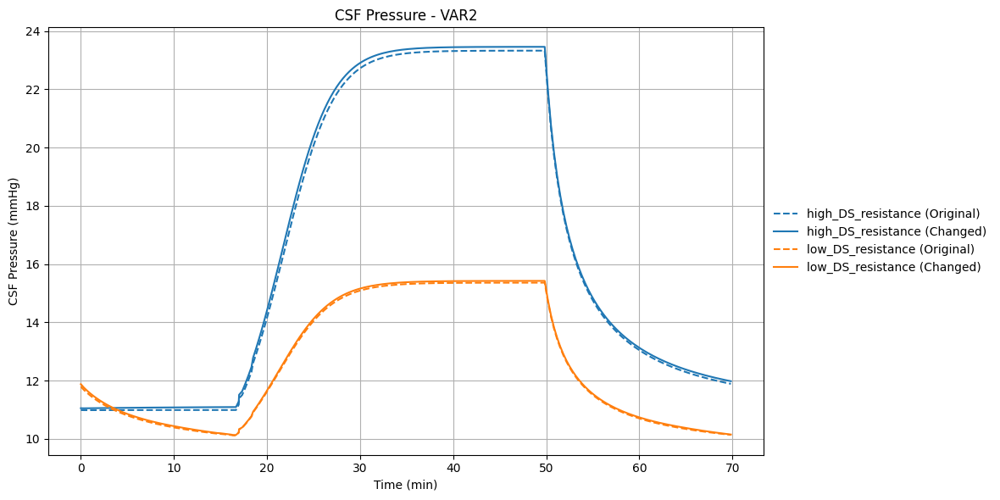

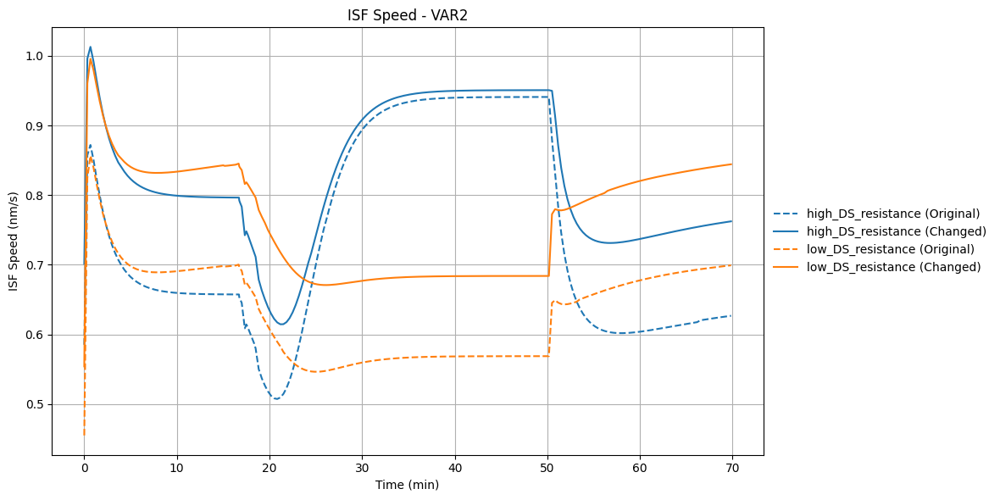


=== Combined Plot for VAR3 ===


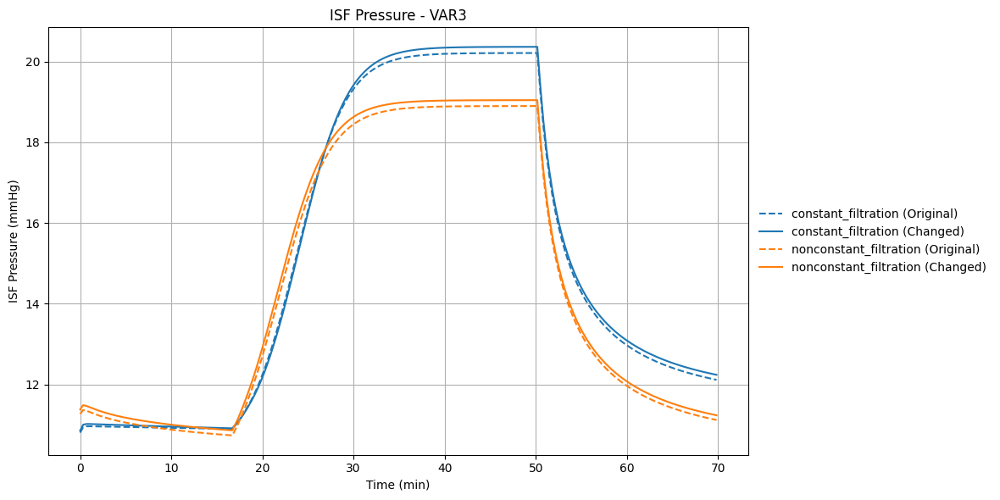

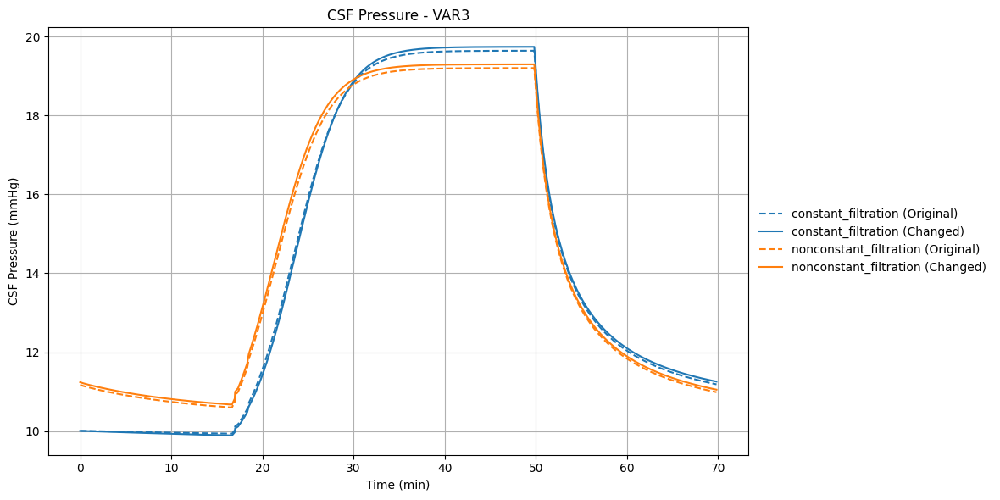

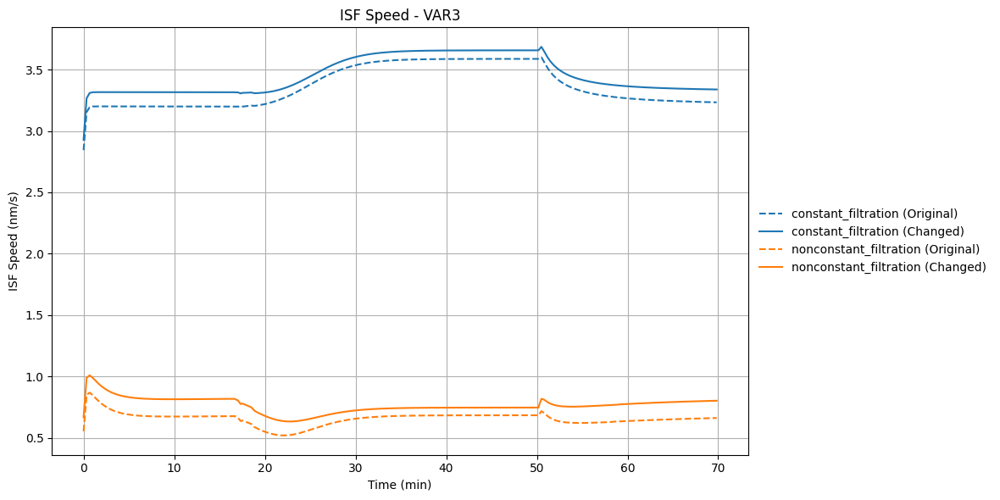


=== Combined Plot for VAR4 ===


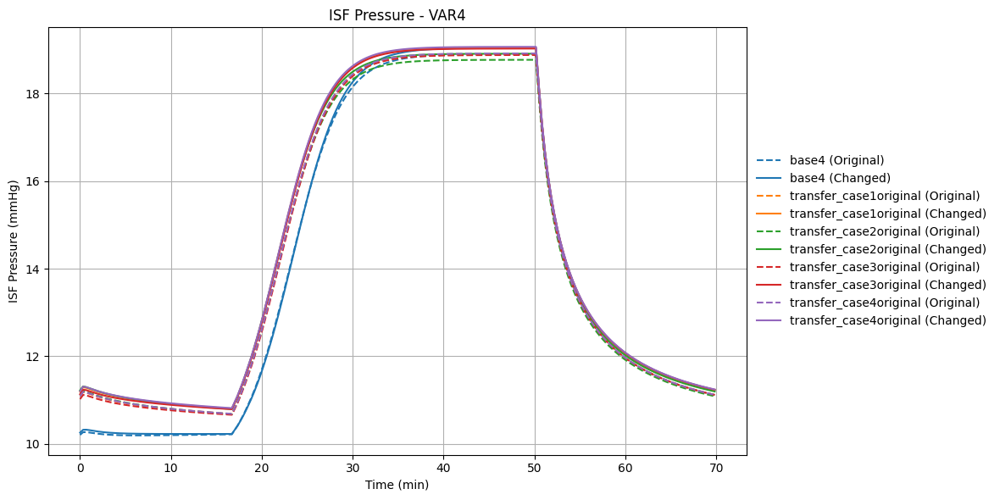

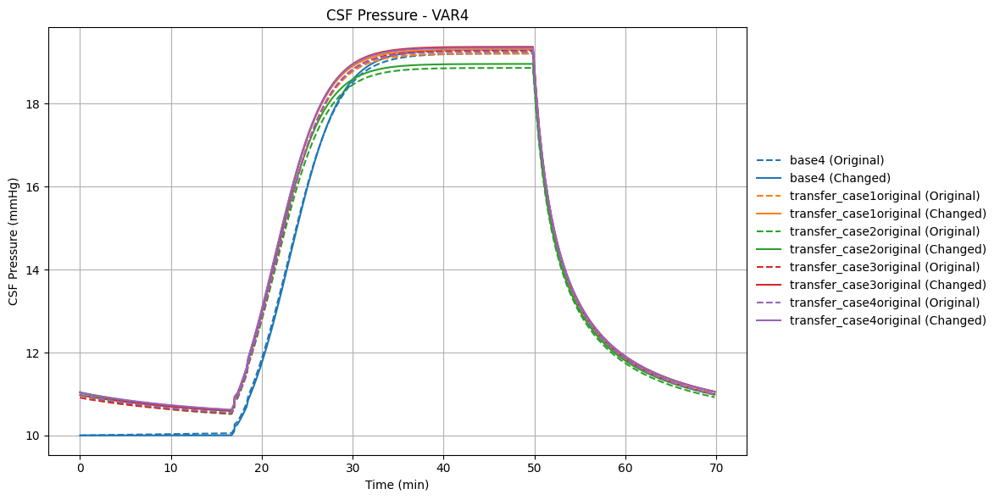

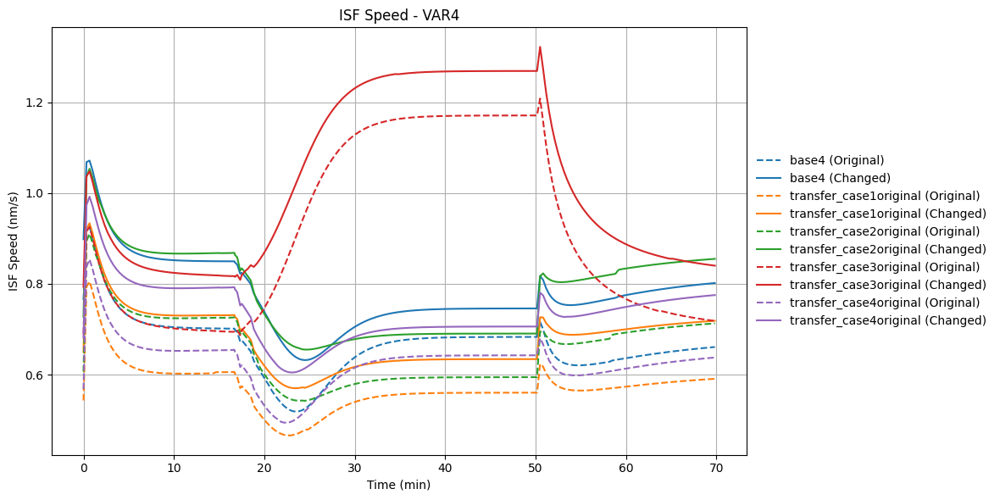


=== Combined Plot for VAR5 ===


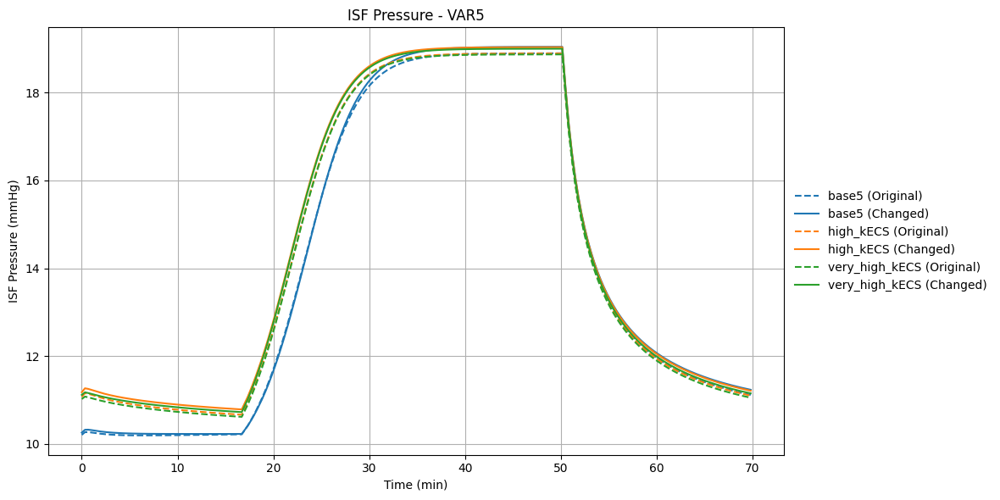

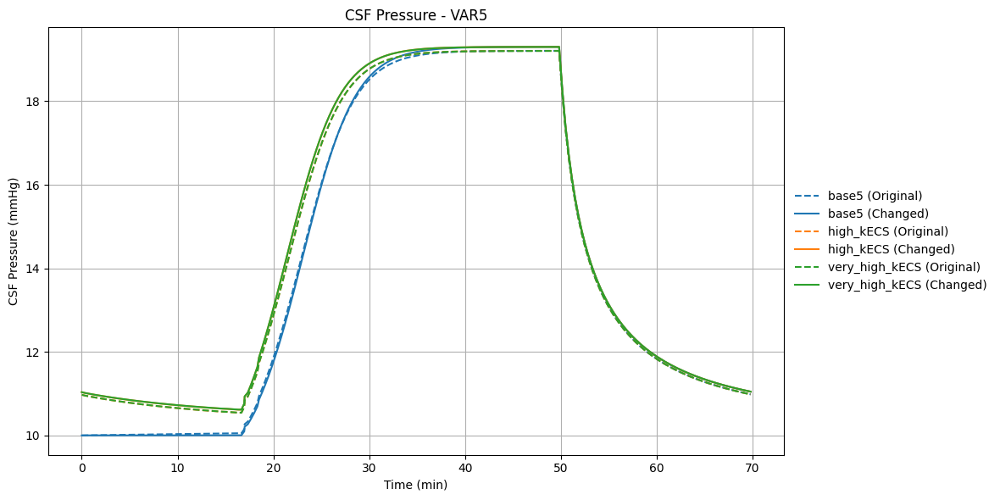

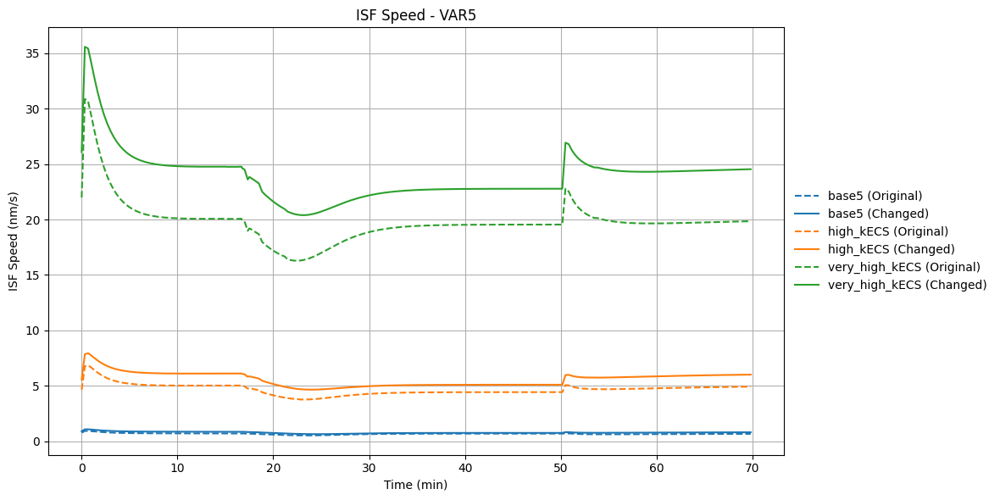

In [ ]:
run_combined_plots_per_variation()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

def load_pressure_columns(file_path, pvs_c_idx=4, isf_idx=6):
    """
    Load time and compute pressure difference (ΔP) between PVS_c and ISF compartments.
    """
    try:
        data = np.loadtxt(file_path, skiprows=1)
        time = data[:, 0] / 60  # seconds → minutes
        pvs_c = data[:, pvs_c_idx + 1]
        isf = data[:, isf_idx + 1]
        gradient = pvs_c - isf
        return time, gradient
    except Exception as e:
        print(f"Error reading {file_path}: {e}")
        return None, None

def plot_var1_pressure_gradient(var1_base_path):
    """
    Plot ΔP = P_PVS_c - P_ISF for each subvariation in VAR1.
    Dashed lines = original model, solid lines = changed model.
    """
    subcases = [
        ("Res_Pizzo_original", "Res_Pizzo"),
        ("Res_FaghihSharp_original", "Res_FaghihSharp"),
        ("base1_original", "base1")
    ]

    plt.figure(figsize=(12, 6))
    colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

    for i, (orig_folder, chng_folder) in enumerate(subcases):
        f_orig = os.path.join(var1_base_path, orig_folder, "pressure_average.dat")
        f_chng = os.path.join(var1_base_path, chng_folder, "pressure_average.dat")

        time_o, grad_o = load_pressure_columns(f_orig)
        time_c, grad_c = load_pressure_columns(f_chng)

        label_base = orig_folder.replace("_original", "")
        color = colors[i % len(colors)]

        if time_o is not None and time_c is not None:
            plt.plot(time_o, grad_o, linestyle='--', color=color, label=f"{label_base} (Original)")
            plt.plot(time_c, grad_c, linestyle='-', color=color, label=f"{label_base} (Changed)")

    plt.title("PVS → ECS Pressure Gradient (ΔP = P_PVS_c - P_ISF) — VAR1")
    plt.xlabel("Time (min)")
    plt.ylabel("ΔP (mmHg)")
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()


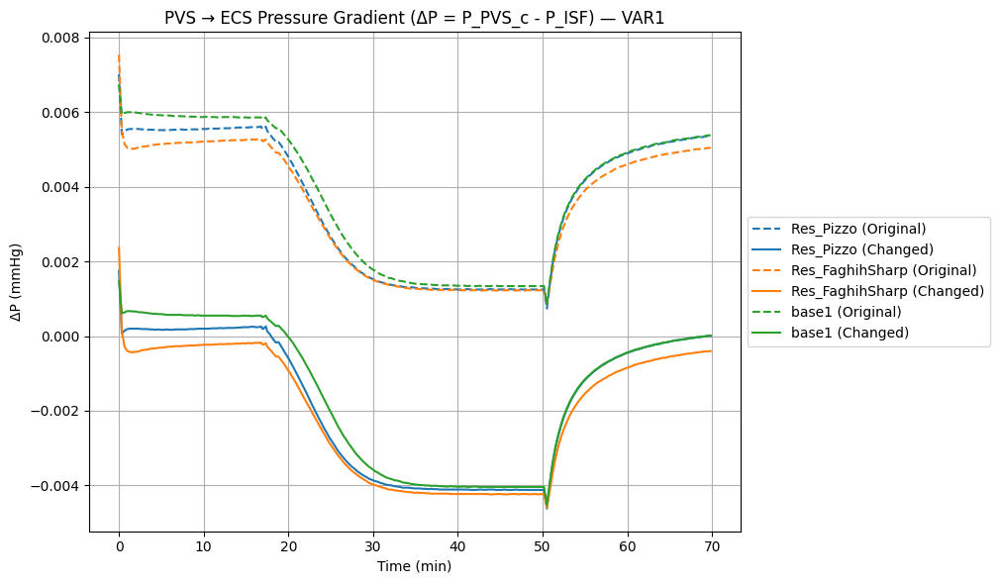

In [ ]:
plot_var1_pressure_gradient("/content/drive/MyDrive/227 Final Project/Variation 1 Results")
